## Import Data Analysis modules

First importing all the necessary and required libraries to be used for analysing the patients health record data.

In [1]:
pip install missingno

Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_rows', 15)
pd.plotting.register_matplotlib_converters()
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import missingno as msno
from sklearn.metrics import mean_absolute_error
from sklearn.base import TransformerMixin
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor


#import the implementation for outlier algorithm from sklearn
from sklearn.ensemble import IsolationForest
from sklearn.cluster import DBSCAN
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import ParameterGrid
#import the implementation for categorical encoding algorithm from sklearn
from sklearn.preprocessing import OneHotEncoder
# import category_encoders as ce
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.utils import resample
from sklearn.preprocessing import StandardScaler
#import the implementation for transformers algorithm from sklearn
from sklearn.preprocessing import MinMaxScaler, Normalizer, PowerTransformer, QuantileTransformer, StandardScaler

from sklearn.pipeline import Pipeline

#importing classifier from sklearn
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB

import lightgbm as lgb
from lightgbm import LGBMClassifier
from lazypredict.Supervised import LazyClassifier
from xgboost import XGBClassifier

from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import make_scorer, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report



print("Vis setup Complete")
print("Setup complete.")

Vis setup Complete
Setup complete.


# 1. SUMMARY OF THE DATA VARIABLES/FEATURES

## 1.1 Data Acquisition

### Load and read the data: 
- firstly creating variables to specify the path to the downloaded file of the train and test data for Healthcare Dataset
- read the loaded file with the `read_csv()` function into a variable to hold the data frame.

In [3]:
#designate the path where health_train data is saved
health_train_data_path = "health_train.csv"
health_test_data_path = "health_test.csv"

#Load and read the train data using pandas read_csv function.
health_train_data = pd.read_csv(health_train_data_path)

#Load and read the train data using pandas read_csv function.
health_test_data = pd.read_csv(health_test_data_path)

## 1.2 Scanning the data in the dataframe

- view few section of the data to ensure it loaded correctly, using the following functions
    - `describe()`, 
    - `head()`, 
    - `tail()` .

In [4]:
#Calling the variable that holds the dataframe of the patients health recored
#To show the first few records to check data is loading correctly and have a view of what it looks like
health_train_data.head()


,id,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x16,x17,x18,x19,x20,x21,x22,x23,x24,target
0,PA1001,1406,145.00,F,0.01,0.00,0.00,0.00,0.00,0.00,...,104.00,171.00,4.00,0.00,155.00,153.00,154.00,4.00,1.00,Low risk
1,PA1002,258,127.00,M,0.01,0.00,0.01,0.00,0.00,0.00,...,53.00,191.00,12.00,1.00,133.00,126.00,131.00,41.00,0.00,Low risk
2,PA1003,479,145.00,F,0.00,0.00,0.00,0.00,0.00,0.00,...,111.00,157.00,1.00,1.00,150.00,146.00,149.00,6.00,1.00,Low risk
3,PA1004,906,146.00,F,0.00,0.00,0.01,0.00,0.00,0.00,...,107.00,169.00,2.00,2.00,150.00,147.00,149.00,7.00,0.00,Low risk
4,PA1005,1921,140.00,F,0.00,0.00,0.01,0.01,0.00,0.00,...,75.00,228.00,9.00,0.00,142.00,118.00,142.00,20.00,0.00,Low risk


In [5]:
#Calling the variable that holds the dataframe of the patients health recored
#To show the last few records to check data is loading correctly and have a view of what it looks like
health_train_data.tail() 

,id,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x16,x17,x18,x19,x20,x21,x22,x23,x24,target
1579,PA2580,2077,130.00,M,0.01,0.00,0.00,0.00,0.00,0.00,...,127.00,158.00,2.00,0.00,139.00,139.00,140.00,3.00,0.00,Low risk
1580,PA2581,664,138.00,F,0.00,0.00,0.00,0.00,0.00,0.00,...,69.00,187.00,10.00,1.00,142.00,130.00,140.00,61.00,0.00,Moderate risk
1581,PA2582,1431,144.00,F,0.00,0.00,0.01,0.00,0.00,0.00,...,139.00,169.00,2.00,0.00,157.00,155.00,157.00,2.00,0.00,Moderate risk
1582,PA2583,630,134.00,F,0.02,0.00,0.00,0.00,0.00,0.00,...,50.00,170.00,5.00,0.00,160.00,150.00,155.00,28.00,1.00,Low risk
1583,PA2584,436,151.00,F,0.00,0.00,0.01,0.01,0.00,0.00,...,50.00,200.00,11.00,2.00,156.00,150.00,156.00,38.00,1.00,Moderate risk


In [6]:
#Calling the variable that holds the dataframe of the patients health recored
#To describe the necessary aggregate values of the loaded data and have a view of what it looks like
health_train_data.describe()

,x1,x2,x4,x5,x6,x7,x8,x9,x10,x11,...,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24
count,1584.00,1584.00,1584.00,1540.00,1584.00,1584.00,1567.00,1584.00,1557.00,1584.00,...,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00
mean,1053.19,133.30,0.00,0.01,0.00,0.00,0.00,0.00,47.09,1.34,...,70.41,93.50,163.91,4.06,0.32,137.33,134.54,137.94,18.45,0.31
std,616.00,10.00,0.00,0.05,0.00,0.00,0.00,0.00,17.27,0.90,...,38.99,29.59,17.91,2.95,0.72,16.46,15.73,14.62,28.38,0.62
min,0.00,106.00,0.00,0.00,0.00,0.00,0.00,0.00,13.00,0.20,...,3.00,50.00,122.00,0.00,0.00,60.00,73.00,77.00,0.00,-1.00
25%,523.75,126.00,0.00,0.00,0.00,0.00,0.00,0.00,32.00,0.70,...,36.00,67.00,152.00,2.00,0.00,128.00,125.00,128.00,2.00,0.00
50%,1049.50,133.00,0.00,0.00,0.00,0.00,0.00,0.00,49.00,1.20,...,68.00,93.00,162.00,3.00,0.00,139.00,136.00,139.00,7.00,0.00
75%,1583.25,141.00,0.01,0.00,0.01,0.00,0.00,0.00,61.00,1.70,...,100.00,120.00,174.00,6.00,0.00,148.00,145.25,148.00,23.00,1.00
max,2125.00,160.00,0.02,0.48,0.01,0.01,0.00,0.01,86.00,7.00,...,176.00,158.00,238.00,18.00,10.00,187.00,182.00,186.00,269.00,1.00


### Data exploration
The check_loaded_data function below is used for the patients health data which has been loaded, to display more information summary of the data, such as;
- the number of records and columns the in the dataset, using the `shape` method.
- the total number of each individual columns using the count function 
- and check the data type for each data.

`:param:` `data_filename` represents the name of the data to be passed into the function.

In [7]:
def check_loaded_data(data_filename):
    health_data_info = data_filename.count()
    #access the dimensions of the dataframe
    print("_____________________________\n The total number of all the patients health recorded and columns of the data is: \n", data_filename.shape, "records and columns \n")
    #display each arrtributes' total
    print("_____________________________\n Total record of all patients data in each column data \n",health_data_info, "\n________________________")
    #display the datatype of the each column attribute
    print("\n __________________________ \n Observations of the loaded data \n", data_filename.info())

check_loaded_data(health_train_data)


_____________________________
 The total number of all the patients health recorded and columns of the data is: 
 (1584, 26) records and columns 

_____________________________
 Total record of all patients data in each column data 
 id        1584
x1        1584
x2        1584
x3        1584
x4        1584
          ... 
x21       1584
x22       1584
x23       1584
x24       1584
target    1584
Length: 26, dtype: int64 
________________________
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1584 entries, 0 to 1583
Data columns (total 26 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   id      1584 non-null   object 
 1   x1      1584 non-null   int64  
 2   x2      1584 non-null   float64
 3   x3      1584 non-null   object 
 4   x4      1584 non-null   float64
 5   x5      1540 non-null   float64
 6   x6      1584 non-null   float64
 7   x7      1584 non-null   float64
 8   x8      1567 non-null   float64
 9   x9      1584 non-null   float64

The above shows that the train data of the patients health data contains 1584 records with 25 variables and the target variable(summing up to 26).
The variables are the attributes that describes each patients health records and their health status.

Each record is associated with one of the following health risk: 'Low risk', 'Moderate risk' or 'High risk'. 
`target` is the target variable or label (a potential classification project).

The above indicates that there are no duplicate values appearing in the dataset of all the patients record. 

## 1.3 Specifying columns and statistics

This section is to specify the data type in the dataset.

In [8]:
# Having a look at the columns in the data
health_train_data.columns

Index(['id', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10',
       'x11', 'x12', 'x13', 'x14', 'x15', 'x16', 'x17', 'x18', 'x19', 'x20',
       'x21', 'x22', 'x23', 'x24', 'target'],
      dtype='object')

From the above, the `target` column is the target/label and will not be added to the list of column variables.


Specifying the columns which are: "id", "x1", "x2", "x3", "x4", "x5", "x6", "x7", "x8", "x9", "x10", "x11", "x12", "x13", "x14", "x15", "x16", "x17", "x18", "x19", "x20", "x21", "x22", "x23", "x24".
    

In [9]:
#creating a variable for the feature columns
COLUMNS = ["id", "x1", "x2", "x3", "x4", "x5", "x6", "x7", "x8", "x9", "x10", "x11", "x12", "x13", "x14", "x15", "x16", "x17", "x18", "x19", "x20", "x21", "x22", "x23", "x24"]



In [10]:
#Now identifying which columns will be categorical and which will be numerical
health_train_data.select_dtypes(include=['object']).columns

Index(['id', 'x3', 'x14', 'target'], dtype='object')

Now to divide and specify the columns into two lists based on the above to identify the one which contains the categorical columns, and one which contains the numeric columns of interest. 

- The numeric columns of interest are: "x1", "x2", "x4", "x5", "x6", "x7", "x8", "x9", "x10", "x11", "x12", "x13", "x15", "x16", "x17", "x18", "x19", "x20", "x21", "x22", "x23", "x24". 
- The categorical columns are: "id" ,"x3", "x14". 



In [11]:
NUMERICAL_COLUMNS = ["x1", "x2", "x4", "x5", "x6", "x7", "x8", "x9", "x10", "x11", 
                     "x12", "x13", "x15", "x16", "x17", "x18", "x19", "x20", "x21", "x22", "x23", "x24"]


CATEGORICAL_COLUMNS = ["id", "x3", "x14"]

### Numerical variables statistics

Attempting to retrieve all the continuous attributes, to obtain necessary information and show characteristics of each attributes.

- Describing all the numerical attributes using the `describe()` function to output a dataframe of the numerical columns as attributes and the different value of the rows.

In [12]:
# Creating a data dictionary for the numeric column dataframe to hold the returned values from the describe function.
num_stats = health_train_data[NUMERICAL_COLUMNS].describe()
print(num_stats)


           x1      x2      x4      x5      x6      x7      x8      x9     x10  \
count 1584.00 1584.00 1584.00 1540.00 1584.00 1584.00 1567.00 1584.00 1557.00   
mean  1053.19  133.30    0.00    0.01    0.00    0.00    0.00    0.00   47.09   
std    616.00   10.00    0.00    0.05    0.00    0.00    0.00    0.00   17.27   
min      0.00  106.00    0.00    0.00    0.00    0.00    0.00    0.00   13.00   
25%    523.75  126.00    0.00    0.00    0.00    0.00    0.00    0.00   32.00   
50%   1049.50  133.00    0.00    0.00    0.00    0.00    0.00    0.00   49.00   
75%   1583.25  141.00    0.01    0.00    0.01    0.00    0.00    0.00   61.00   
max   2125.00  160.00    0.02    0.48    0.01    0.01    0.00    0.01   86.00   

          x11  ...     x15     x16     x17     x18     x19     x20     x21  \
count 1584.00  ... 1584.00 1584.00 1584.00 1584.00 1584.00 1584.00 1584.00   
mean     1.34  ...   70.41   93.50  163.91    4.06    0.32  137.33  134.54   
std      0.90  ...   38.99   29.59  


- Describing the health status of the recorded values of the numerical columns of all the patient's data based on a `groupby()` function. 

In [13]:
# viewing each target value description to view the health risk of all the patients records data.
health_train_data.groupby('target')[NUMERICAL_COLUMNS].describe()


x1                                                     \
                count    mean    std  min    25%     50%     75%     max   
target                                                                     
High risk      130.00 1183.88 727.19 6.00 468.25 1490.00 1903.75 2048.00   
Low risk      1235.00 1117.71 593.58 1.00 635.50 1136.00 1612.50 2125.00   
Moderate risk  219.00  611.76 467.44 0.00 313.50  437.00  776.50 2124.00   

                   x2         ...   x23            x24                         \
                count   mean  ...   75%    max   count  mean  std   min   25%   
target                        ...                                               
High risk      130.00 131.70  ... 80.00 269.00  130.00 -0.10 0.68 -1.00 -1.00   
Low risk      1235.00 132.01  ... 23.00 177.00 1235.00  0.33 0.60 -1.00  0.00   
Moderate risk  219.00 141.50  ...  4.00 108.00  219.00  0.42 0.60 -1.00  0.00   

                              
               50%  75%  max  
target                        
High risk     0.00 0.00 1.00  
Low risk      0.00 1.00 1.00  
Moderate risk 0.00 1.00 1.00  

[3 rows x 176 columns]

Generating the median and total number of null values for each variables as extra information and adding them to created statistics data frame, using `median()` and `isnull().sum` functions respectively.

In [14]:
#Iterating through the numerical variables to generate the median and sum the null values in the data set 
#and storing into the variable created to hold the statistic values.
for column in NUMERICAL_COLUMNS:
    num_stats.loc['median', column] = health_train_data[column].median()
    num_stats.loc['missing', column] = health_train_data[column].isnull().sum()
print(num_stats)

             x1      x2      x4      x5      x6      x7      x8      x9  \
count   1584.00 1584.00 1584.00 1540.00 1584.00 1584.00 1567.00 1584.00   
mean    1053.19  133.30    0.00    0.01    0.00    0.00    0.00    0.00   
std      616.00   10.00    0.00    0.05    0.00    0.00    0.00    0.00   
min        0.00  106.00    0.00    0.00    0.00    0.00    0.00    0.00   
25%      523.75  126.00    0.00    0.00    0.00    0.00    0.00    0.00   
50%     1049.50  133.00    0.00    0.00    0.00    0.00    0.00    0.00   
75%     1583.25  141.00    0.01    0.00    0.01    0.00    0.00    0.00   
max     2125.00  160.00    0.02    0.48    0.01    0.01    0.00    0.01   
median  1049.50  133.00    0.00    0.00    0.00    0.00    0.00    0.00   
missing    0.00    0.00    0.00   44.00    0.00    0.00   17.00    0.00   

            x10     x11  ...     x15     x16     x17     x18     x19     x20  \
count   1557.00 1584.00  ... 1584.00 1584.00 1584.00 1584.00 1584.00 1584.00   
mean      47.0

### Categorical variables statistics
Attempting to retrieve all the categorical attributes, to obtain necessary information and show characteristics of each attributes.

- Describing all the categorical attributes to output a dataframe of the categorical columns as attributes and the different value of the rows.


In [15]:
# Creating a data dictionary for the categorical column dataframe to hold the returned values from the describe function.
cat_stats = health_train_data[CATEGORICAL_COLUMNS]


- Iterating through the categorical variables to retrieve more detailed information, such as;
    - data value description using `describe()` function,
    - unique record values available using `unique()`, and,
    - obtaining the total number of each unique values using `value_counts()`.
N.B: Since it is not a continous values, the describe function, will only output the total count, number of unique values, frequency of how it appears and not the aggregate value like that of numrical variables.

In [16]:
for column in CATEGORICAL_COLUMNS:
    print("Details for column---" ,column)
    print("Data description:\n", cat_stats[column].describe(),"\n")
    print("Unique values are:\n", cat_stats[column].unique(),"\n")
    print("Total count of each unique values:\n", cat_stats[column].value_counts(), "\n\n")

Details for column--- id
Data description:
 count       1584
unique      1584
top       PA1001
freq           1
Name: id, dtype: object 

Unique values are:
 ['PA1001' 'PA1002' 'PA1003' ... 'PA2582' 'PA2583' 'PA2584'] 

Total count of each unique values:
 PA1001    1
PA2065    1
PA2063    1
PA2062    1
PA2061    1
         ..
PA1526    1
PA1525    1
PA1524    1
PA1523    1
PA2584    1
Name: id, Length: 1584, dtype: int64 


Details for column--- x3
Data description:
 count     1584
unique       2
top          M
freq       842
Name: x3, dtype: object 

Unique values are:
 ['F' 'M'] 

Total count of each unique values:
 M    842
F    742
Name: x3, dtype: int64 


Details for column--- x14
Data description:
 count     1584
unique       8
top         O+
freq       410
Name: x14, dtype: object 

Unique values are:
 ['O+' 'A+' 'B+' 'O-' 'A-' 'B-' 'AB-' 'AB+'] 

Total count of each unique values:
 O+     410
A+     328
B+     307
A-     165
B-     154
O-     146
AB+     57
AB-     17
Name: x1

Generating and identifying the total number of null/missing and unique values available for each variables as extra information and adding them to created statistics data frame, using `isnull().sum` and `unique()` functions respectively.

In [17]:
for column in CATEGORICAL_COLUMNS:
    #
    cat_stats.loc['missing',column] = health_train_data[column].isnull().sum()
    cat_stats.loc['values',column] = health_train_data[column].unique()

print(cat_stats)

                                                        id      x3  \
0                                                   PA1001       F   
1                                                   PA1002       M   
2                                                   PA1003       F   
3                                                   PA1004       F   
4                                                   PA1005       F   
...                                                    ...     ...   
1581                                                PA2582       F   
1582                                                PA2583       F   
1583                                                PA2584       F   
missing                                                  0       0   
values   [PA1001, PA1002, PA1003, PA1004, PA1005, PA100...  [F, M]   

                                        x14  
0                                        O+  
1                                        A+  
2                    

- Viewing the records of each categorical column been grouped according to the target values

In [18]:
(health_train_data.groupby('target')[CATEGORICAL_COLUMNS].describe())


id                        x3                   x14         \
              count unique     top freq count unique top freq count unique   
target                                                                       
High risk       130    130  PA1015    1   130      2   M   88   130      8   
Low risk       1235   1235  PA1001    1  1235      2   M  715  1235      8   
Moderate risk   219    219  PA1013    1   219      2   F  180   219      8   

                        
              top freq  
target                  
High risk      A+   60  
Low risk       O+  381  
Moderate risk  O-   52

## 1.4 Variable summary visualisation

Visualising each attributes to properly have a view of the distribution, but also using the target attribute to contrast the distributions for the different labels.


Dividing the data into three data frames: 
   - one for the patients records with High health risk
   - one for the patients records with Moderate health risk, and
   - one for those patients with Low health risk 

In [19]:
health_data_high = health_train_data[(health_train_data.target.str.strip()=='High risk')]
health_data_med = health_train_data[(health_train_data.target.str.strip()=='Moderate risk')]
health_data_low = health_train_data[(health_train_data.target.str.strip()=='Low risk')]


### Distribution visualisation for the numerical health data records of all patient.

Using __sns__ for the seaborn library with the __kde plot__, to show the distribution of an attribute.
Plotting the graph using `for` loop to iterate through every of the numeric column
I set the fill parameter to True for colour shading to contrast distributions for each risk target (this is inplace of the 'shade' value which is deprecated).


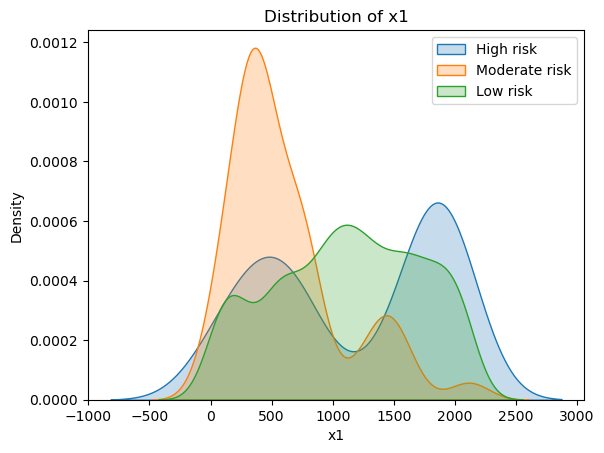

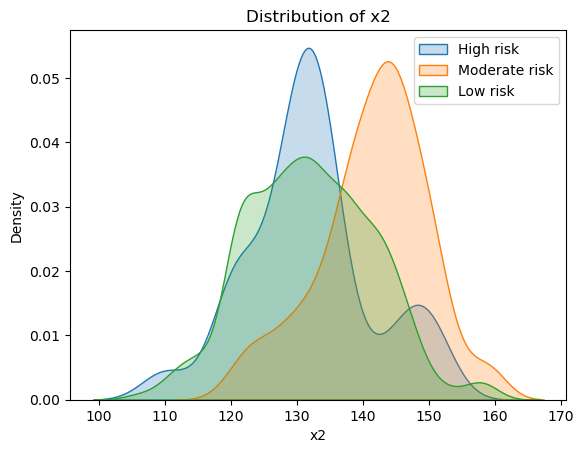

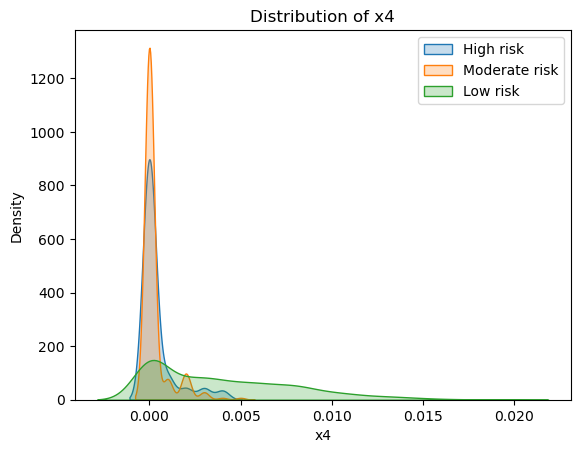

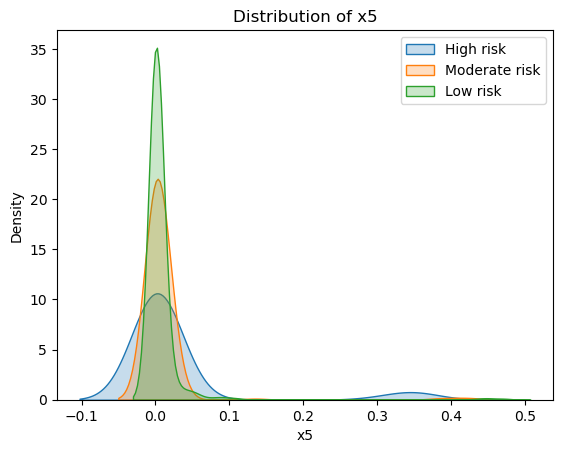

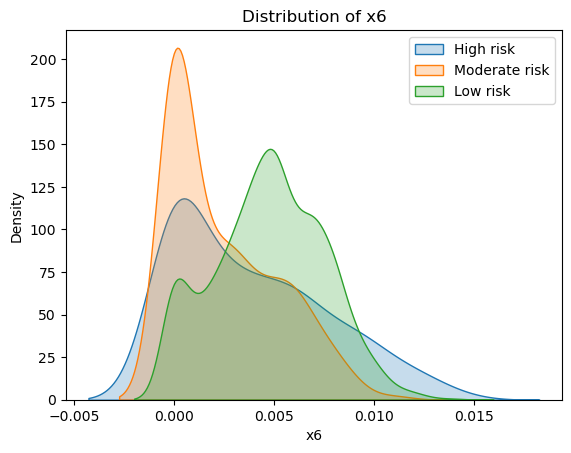

...

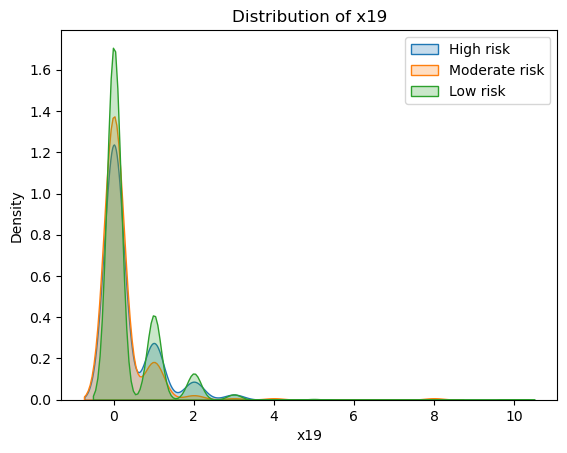

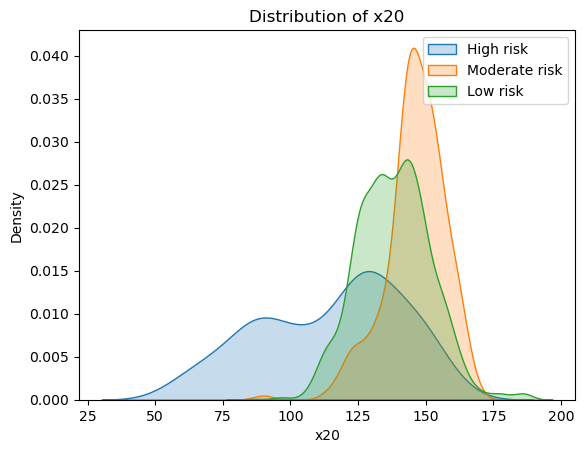

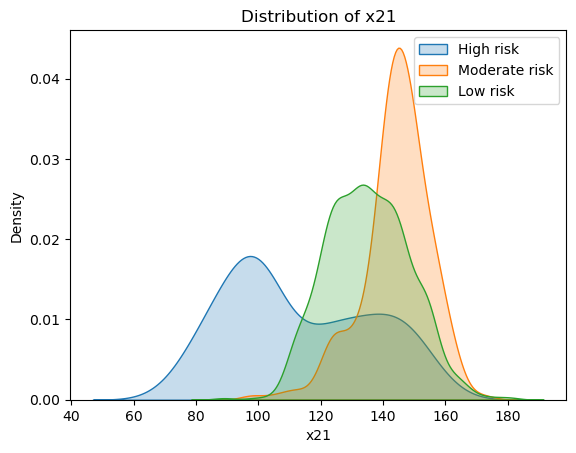

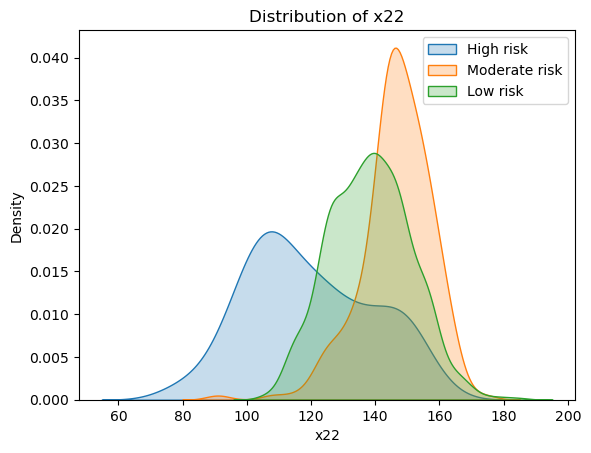

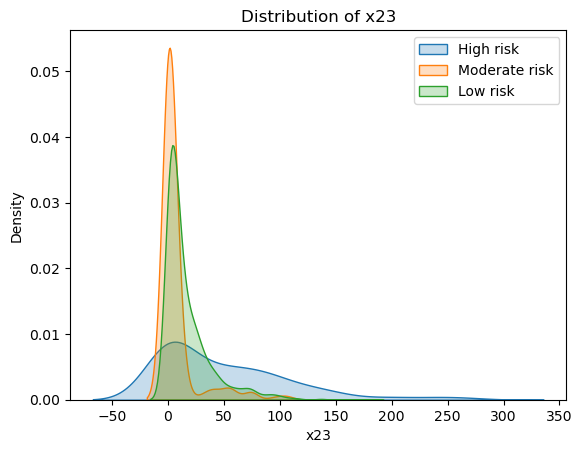

In [20]:
for column in NUMERICAL_COLUMNS:
    #the plot below allows for the three different risk target 
    plt.figure()
    # displaying an interlink plot for each health risk target
    sns.kdeplot(data=health_data_high[column], label="High risk", fill=True)
    sns.kdeplot(data=health_data_med[column], label="Moderate risk",fill=True)
    sns.kdeplot(data=health_data_low[column], label="Low risk",fill=True)
    #include a legend
    plt.legend()
    #include a dynamic title
    plt.title("Distribution of " +column)
    
    #Save the plot to the working directory
    plt.savefig(column+'.jpg')
plt.close()

__Observation:__
Patients with high `x1` value tends to have high risk of health status and also patients with values less than zero also tend to have higher health risk. A shift in the `x2` status indicates that patients whose `x2` status value is high will experience moderate risk. A record with low value of `x4` shows that the patients have low tendency of health risk. Health risk has a wider possibility of being high for `x5` as it spreads both away and after 0. The higher the value of `x6`, the higher the chance of being at risk. Patients who has records under the `x8` column indicates that they have high health risk. Patients values in the `x19` column is not easily discrimantory/deduced as to what level of risk they are opened to.

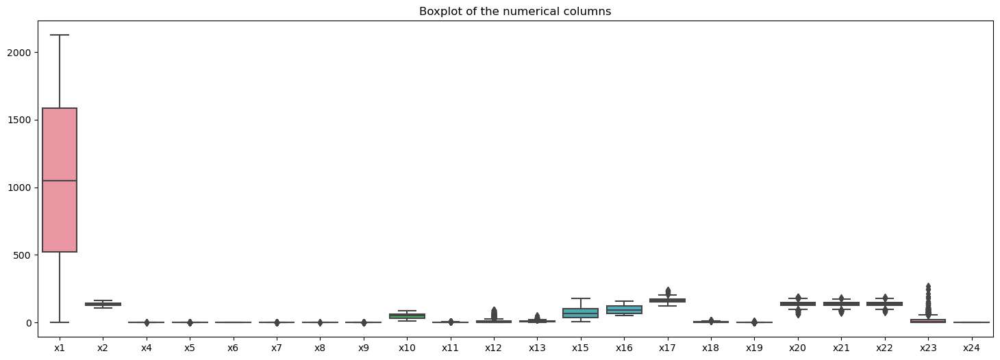

In [21]:
plt.figure(figsize=(18,6))
sns.boxplot(data=health_train_data[NUMERICAL_COLUMNS])
plt.title("Boxplot of the numerical columns")
plt.show()

The boxplot indicates the quartile distribution of the numerical variable and also identifies whiskers(outliers) present in the data.

 ### Distribution visualisation for the categorical health data records of all patient.

To show distribution of values for categorical variables, the countplot will be used for visualisation. The target attribute containing the health risk will be used for the value of the hue parameter to contrast the distributions for the different health risk labels.

using __sns__ for the seaborn library with the __countplot__, to show the distribution of an attribute.
Plotting the graph using `for` loop to iterate through every of the categorical column which will serve as the value for the x-axis.

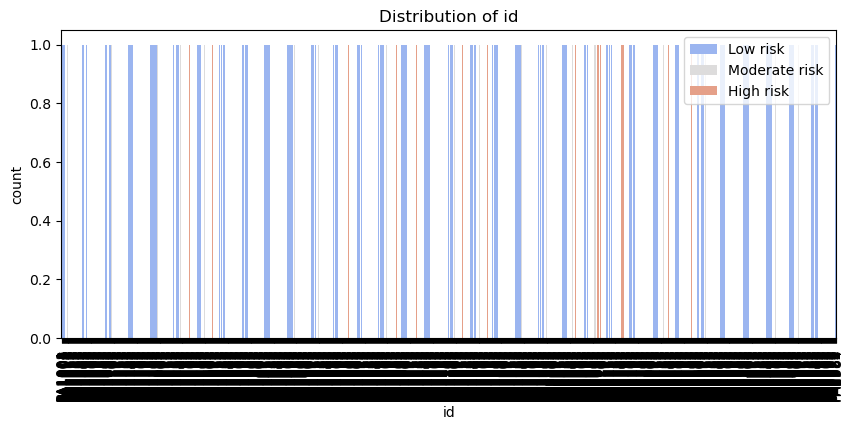

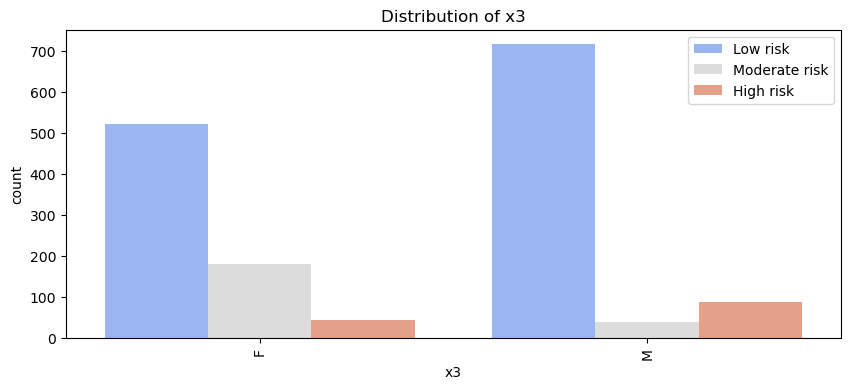

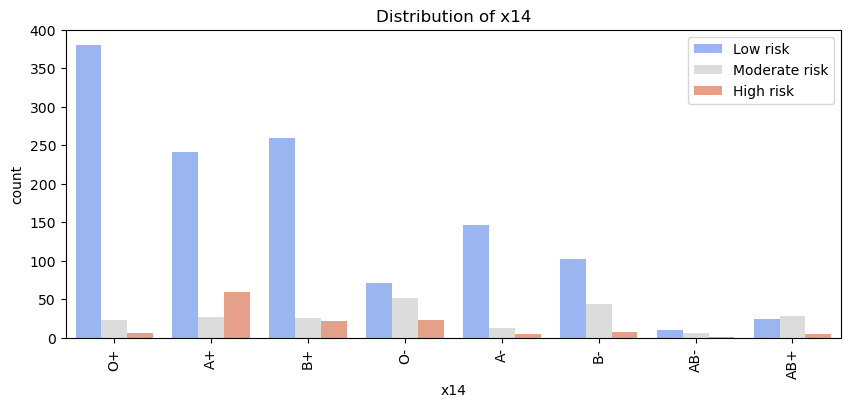

In [22]:
# to show the Count plots of the categorical columns

for column in CATEGORICAL_COLUMNS:
    #graph showing the plot for the column against each target
    plt.figure(figsize=(10,4))
    plt.xticks(rotation=90) 
    # produce a count plot for each target label so they interlink
    sns.countplot(x=column, hue='target', palette="coolwarm", data=health_train_data)
    #adding a legend
    plt.legend()
    #title for each column
    plt.title("Distribution of " +column)
    #Saving the plot to the working directory
    plt.savefig(column+'.jpg')

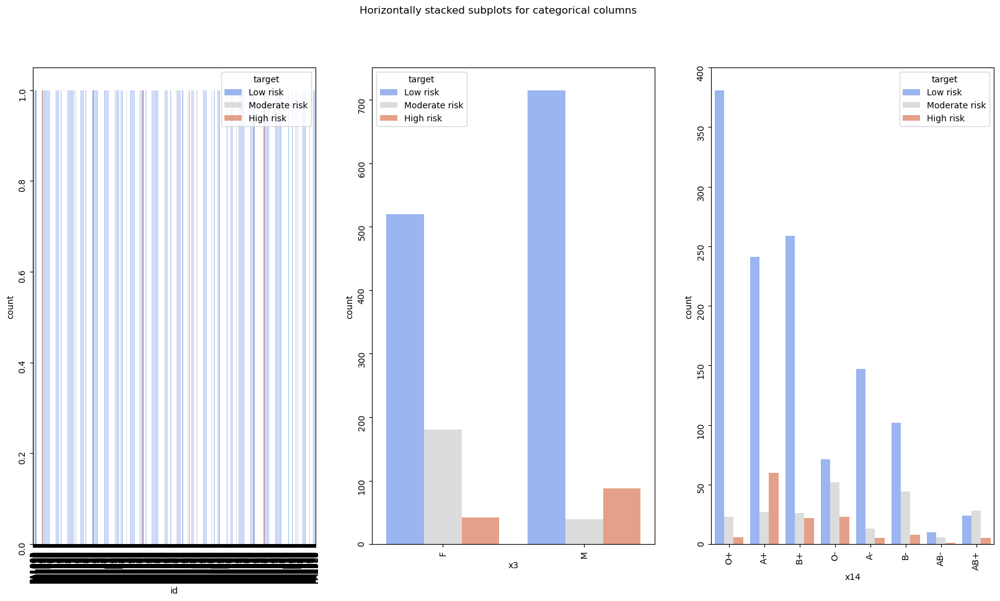

In [23]:
fig, (ax) = plt.subplots(1, len(CATEGORICAL_COLUMNS), figsize=(20,10))
fig.suptitle('Horizontally stacked subplots for categorical columns')

for i in range(len(CATEGORICAL_COLUMNS)):
    ax[i].tick_params(labelrotation=90)
    sns.countplot(x=CATEGORICAL_COLUMNS[i], hue='target', palette="coolwarm", data=health_train_data, ax=ax[i])
plt.savefig('hst_cntplot'+'.jpg')


Observing from the visualised graph above, it is obvious that the `id` column have little to no effect on the dataset. And therefore particularly not a useful variable in the prediction of health risk on the patients data record.
The x3 indicates that more females are moderately at risk as compared to male group.
The x14 indicates that patients records with AB- are relatively at low health risk as compared to others.

### -Univariant analysis


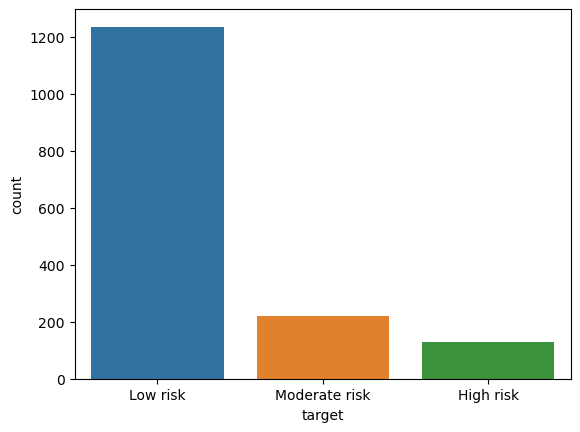

In [24]:
#Show distribution of the target class on the dataset
sns.countplot(x='target', data= health_train_data)
plt.savefig('uni_target'+'.jpg')

The countplot shows that there is data imbalance in the data with respect to the target column, where low risk is so high. This indicates that there is a igh number of patients with low risk in the dataset.

### - Multivariant analysis
Randomly viewing the interlinks between different data of different columns

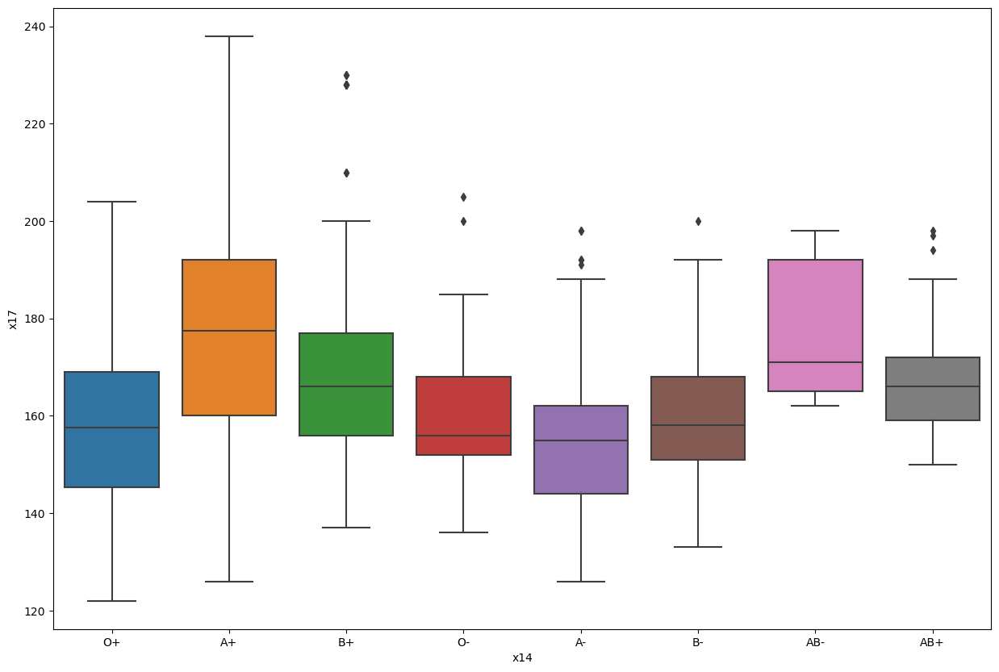

In [25]:
fig, ax =plt.subplots(figsize=(15,10))
sns.boxplot(data=health_train_data, x="x14", y="x17", ax=ax)
plt.savefig('multi_bx'+'.jpg')

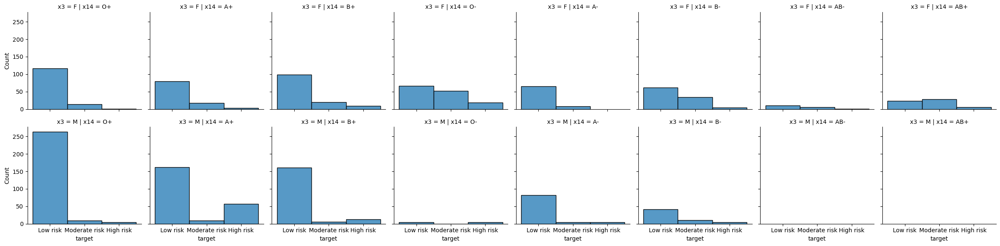

In [26]:
g = sns.FacetGrid(health_train_data, row='x3', col= 'x14')
g.map(sns.histplot, "target")
plt.savefig('multi_hst'+'.jpg')
plt.show()

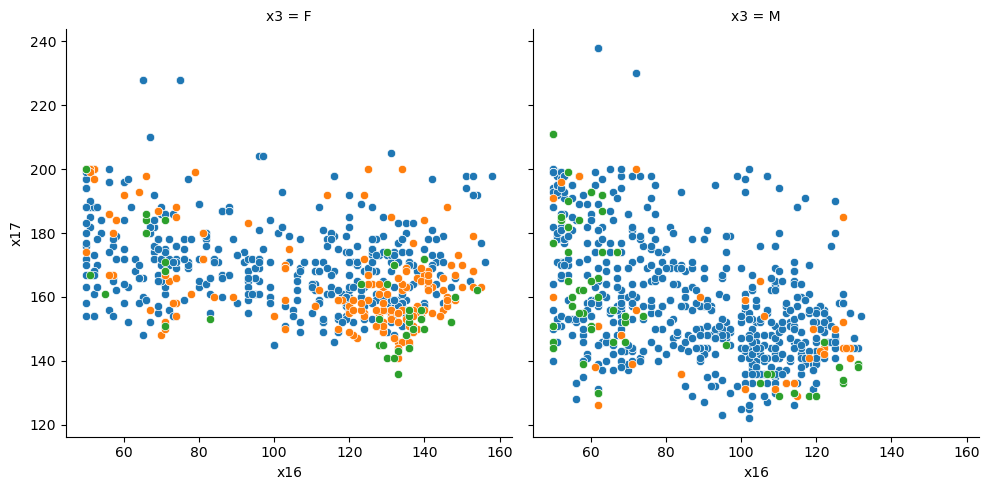

In [27]:
g = sns.FacetGrid(health_train_data, hue='target', col= 'x3', height= 5)
g.map(sns.scatterplot, "x16", "x17")
plt.savefig('multi_sct'+'.jpg')
plt.show()

<!-- - Feature Variables
To designate the input variables into X and view the description and first few data records. -->

## 1.5 Identifying the amount of missing data in the train data set

- First finding to check if missing values can be identified, using the `isnull()`. function.

In [28]:
health_train_data.isnull()

,id,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x16,x17,x18,x19,x20,x21,x22,x23,x24,target
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1579,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1580,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1581,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1582,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


- Identifying the number of missing data in each rows

In [29]:
print(" \n Checking for number of missing data in each data set:")
    # check for the rows with missing values and the total number of missing values in that row.
for i in range(len(health_train_data.index)):
    if health_train_data.iloc[i].isnull().sum() > 0:
        print("Number of missing value in row {} is {}".format(i, health_train_data.iloc[i].isnull().sum()))

 
 Checking for number of missing data in each data set:
Number of missing value in row 11 is 1
Number of missing value in row 21 is 1
Number of missing value in row 24 is 1
Number of missing value in row 32 is 1
Number of missing value in row 46 is 1
Number of missing value in row 64 is 1
Number of missing value in row 91 is 1
Number of missing value in row 120 is 1
Number of missing value in row 123 is 1
Number of missing value in row 133 is 1
Number of missing value in row 144 is 1
Number of missing value in row 161 is 1
Number of missing value in row 228 is 1
Number of missing value in row 241 is 1
Number of missing value in row 261 is 1
Number of missing value in row 262 is 1
Number of missing value in row 265 is 1
Number of missing value in row 280 is 1
Number of missing value in row 288 is 2
Number of missing value in row 310 is 1
Number of missing value in row 312 is 1
Number of missing value in row 325 is 1
Number of missing value in row 330 is 1
Number of missing value in row

- Identifying the column with missing values and calculating total number and percentage of missingness.

In [30]:
# total number and percentage of missing data per column
total_missing = health_train_data.isnull().sum().sort_values(ascending=False)
total_percent = (health_train_data.isnull().sum()/health_train_data.isnull().count()).sort_values(ascending=False)*100
missing_concat = pd.concat([total_missing, total_percent], axis=1, keys=["Total", "Percentage"])
data_missing = missing_concat[missing_concat['Total']>0]
data_missing

,Total,Percentage
x5,44,2.78
x10,27,1.70
x8,17,1.07


- Total percentage of missing data in the entire whole dataset

In [31]:

#Calculation of total cells in the entire dataframe
total_cells = np.product(health_train_data.shape)
total_missing_count = total_missing.sum()

# percent of data that is missing in the entire dataframe
percent_missing = (total_missing_count/total_cells) * 100
(percent_missing)


0.2136752136752137

   - Visualisation of missing values by features using `barplot`.

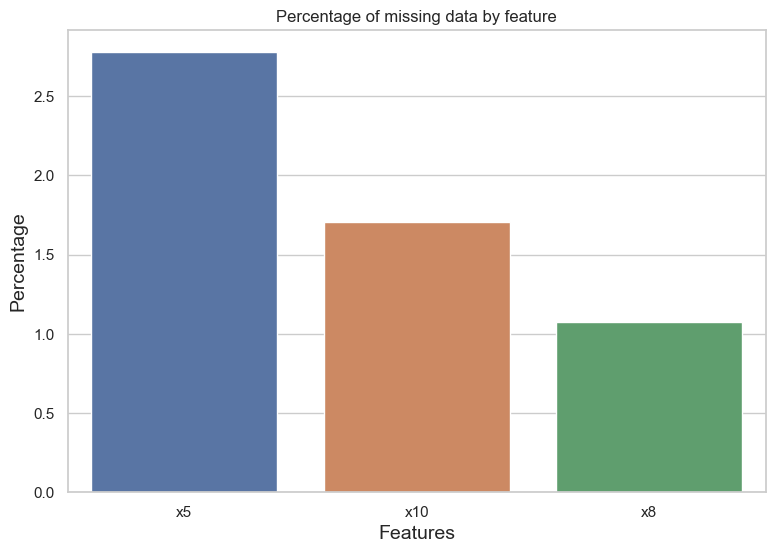

In [32]:
#using barplot for visualisation
plt.figure(figsize=(9,6))
sns.set(style="whitegrid")
sns.barplot(x=data_missing.index, y=data_missing['Percentage'], data = data_missing)
plt.title('Percentage of missing data by feature')
plt.xlabel('Features', fontsize=14)
plt.ylabel('Percentage', fontsize=14)
plt.savefig('missing'+'.jpg')
plt.show()

The x5 column has the highest percentage of missing data i.e at approximately 2.78% the missing entries of the others are between 1.0% and 1.7%.


- can also be viewed using `heatmap`

<AxesSubplot:>

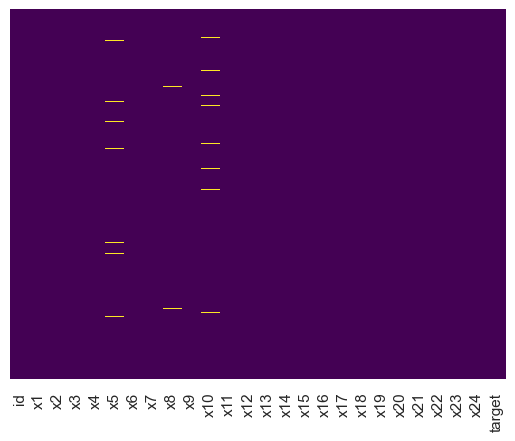

In [33]:
sns.heatmap(health_train_data.isnull(), yticklabels=False, cbar=False, cmap='viridis')

It can also viewed with respect to its total value to know how many values are missing using `msno` library

<function matplotlib.pyplot.show(close=None, block=None)>

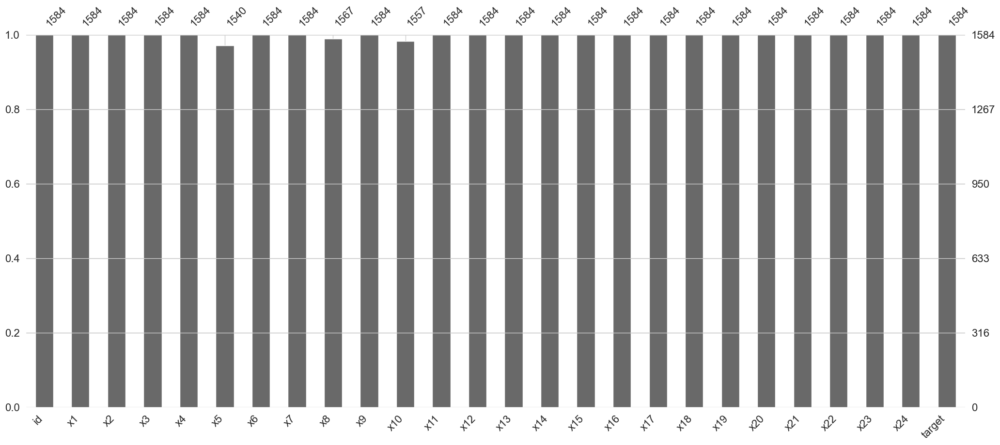

In [34]:
msno.bar(health_train_data)
plt.show

## 1.6 Identifying Outliers in each individual fields

- First looking through the description of the numerical data to view the `min` and `max` values in each column of the dataset.

In [35]:
num_stats = health_train_data[NUMERICAL_COLUMNS].describe()
print(num_stats)

           x1      x2      x4      x5      x6      x7      x8      x9     x10  \
count 1584.00 1584.00 1584.00 1540.00 1584.00 1584.00 1567.00 1584.00 1557.00   
mean  1053.19  133.30    0.00    0.01    0.00    0.00    0.00    0.00   47.09   
std    616.00   10.00    0.00    0.05    0.00    0.00    0.00    0.00   17.27   
min      0.00  106.00    0.00    0.00    0.00    0.00    0.00    0.00   13.00   
25%    523.75  126.00    0.00    0.00    0.00    0.00    0.00    0.00   32.00   
50%   1049.50  133.00    0.00    0.00    0.00    0.00    0.00    0.00   49.00   
75%   1583.25  141.00    0.01    0.00    0.01    0.00    0.00    0.00   61.00   
max   2125.00  160.00    0.02    0.48    0.01    0.01    0.00    0.01   86.00   

          x11  ...     x15     x16     x17     x18     x19     x20     x21  \
count 1584.00  ... 1584.00 1584.00 1584.00 1584.00 1584.00 1584.00 1584.00   
mean     1.34  ...   70.41   93.50  163.91    4.06    0.32  137.33  134.54   
std      0.90  ...   38.99   29.59  

- Now visualising the data using 
    - `subplot` and `boxplot`, to identify whiskers and have a view of outliers.
    - `scatterplot`.

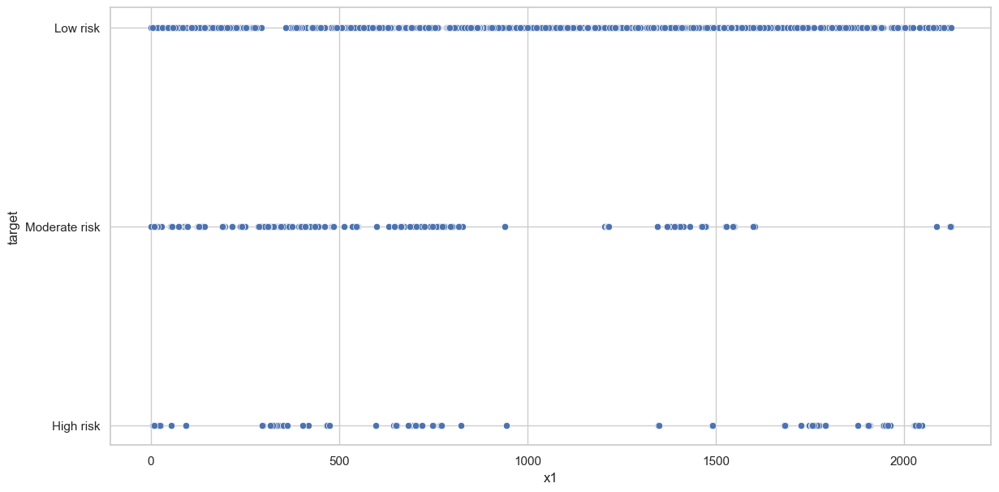

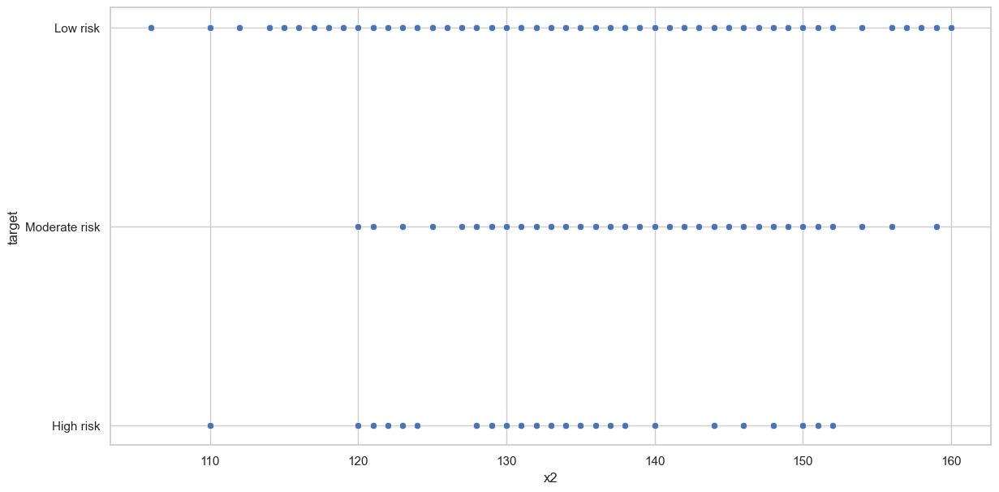

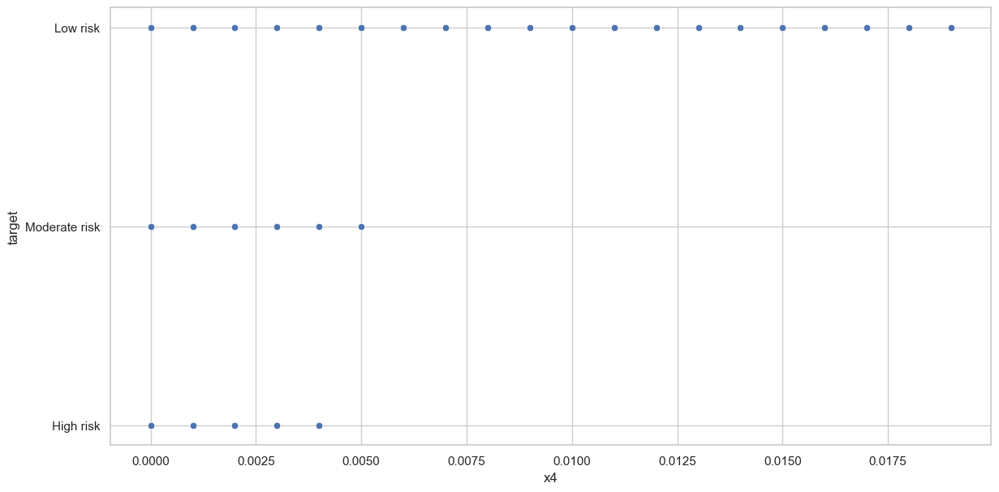

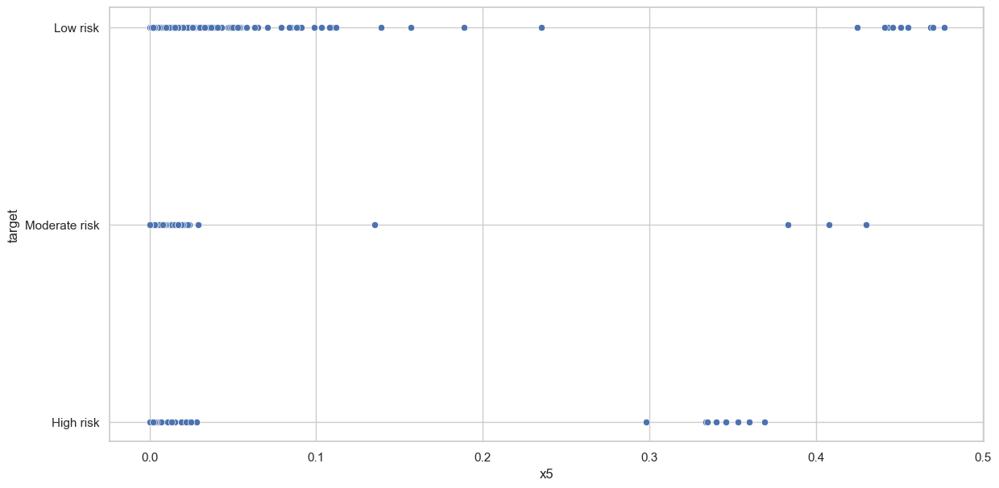

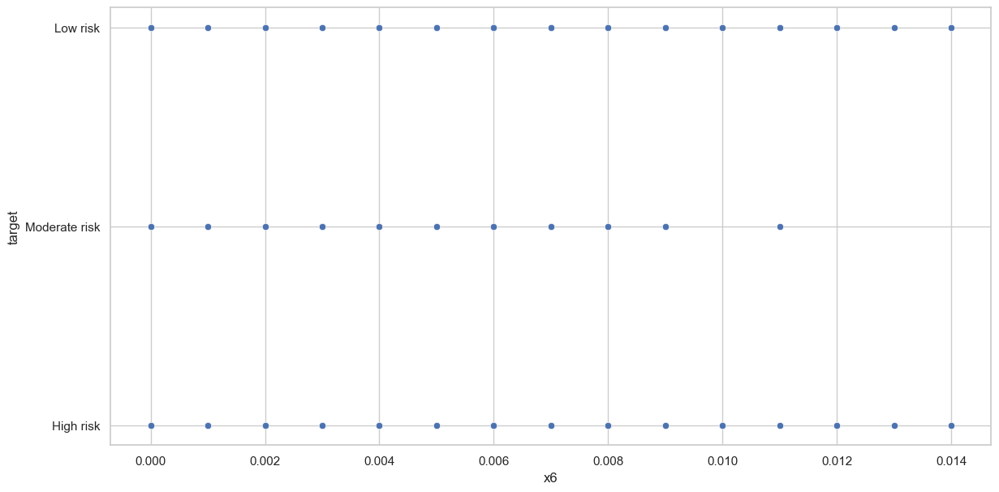

...

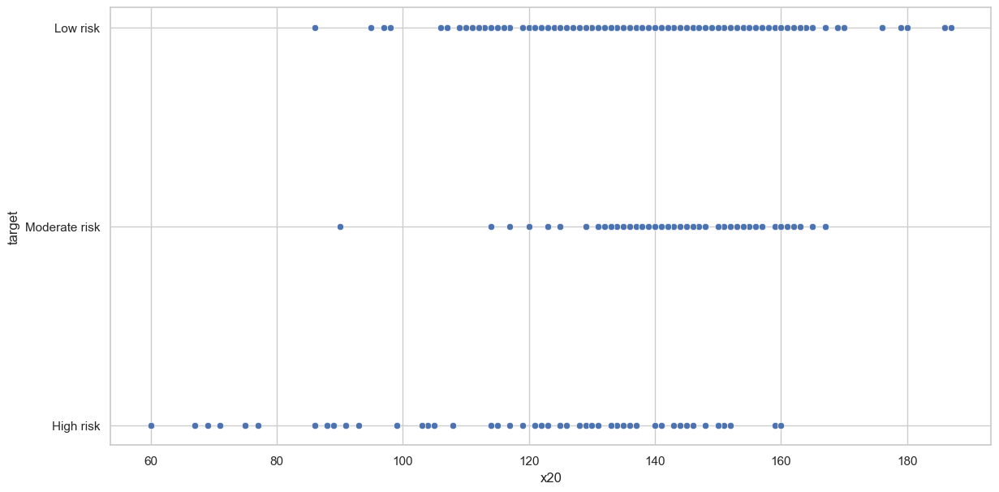

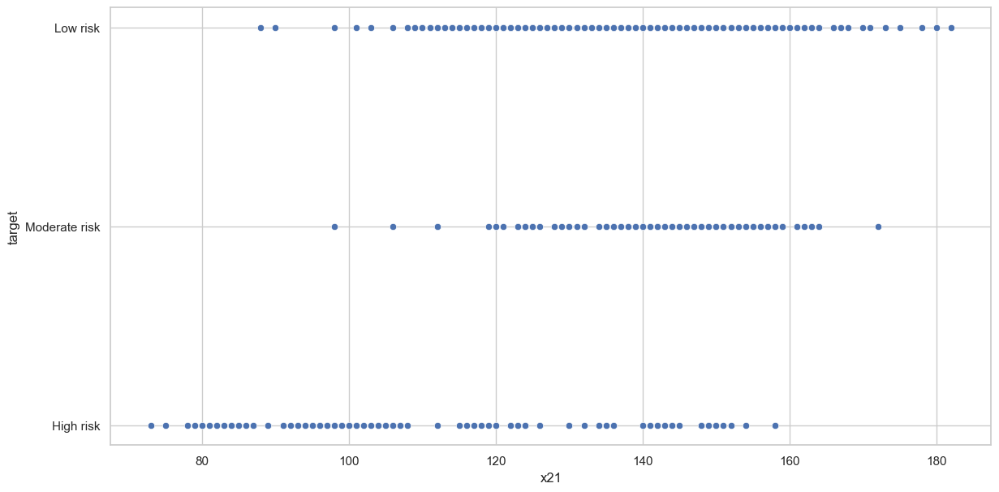

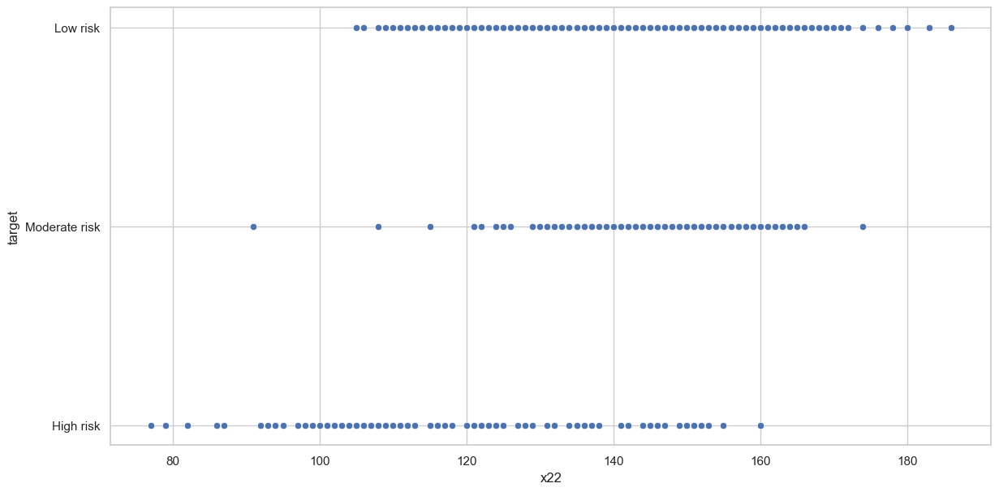

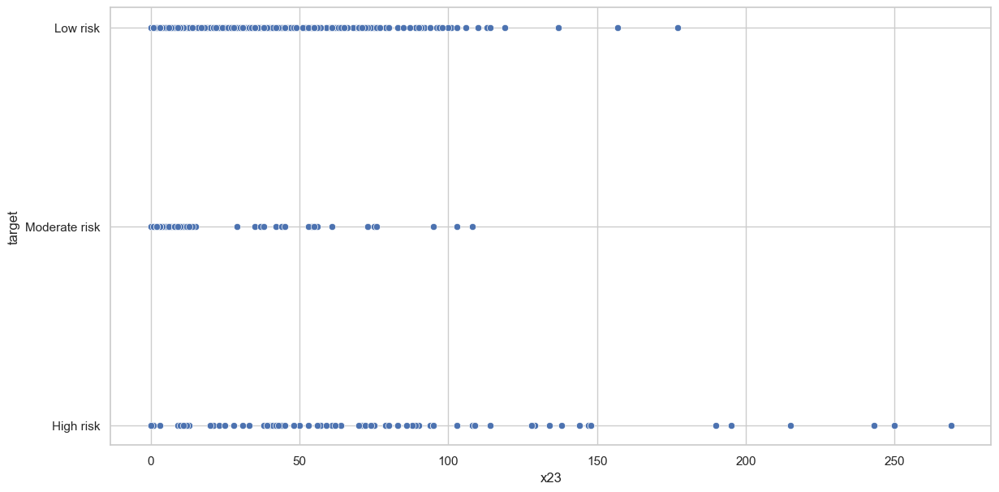

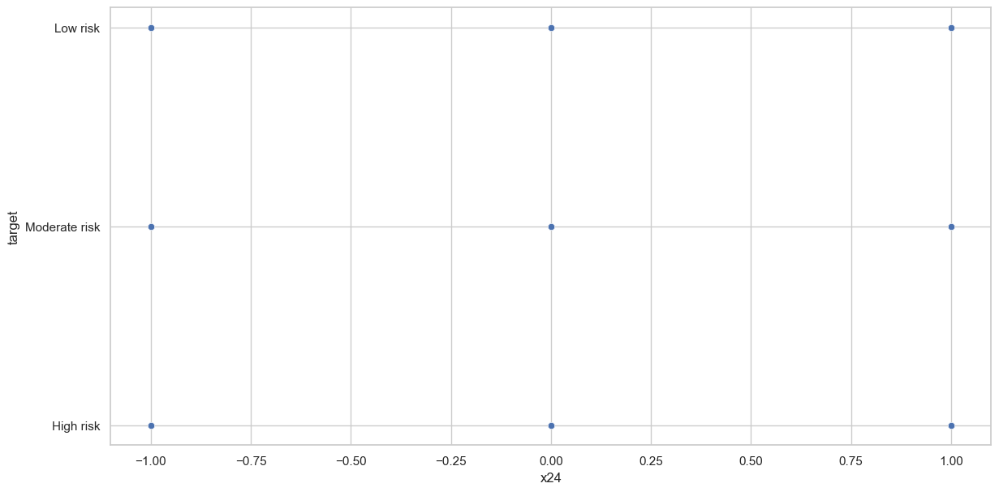

In [36]:
#using scatterplot
for col in NUMERICAL_COLUMNS:
    plt.figure(figsize=(14,7))

    sns.scatterplot(x=health_train_data[col], y=health_train_data['target'])

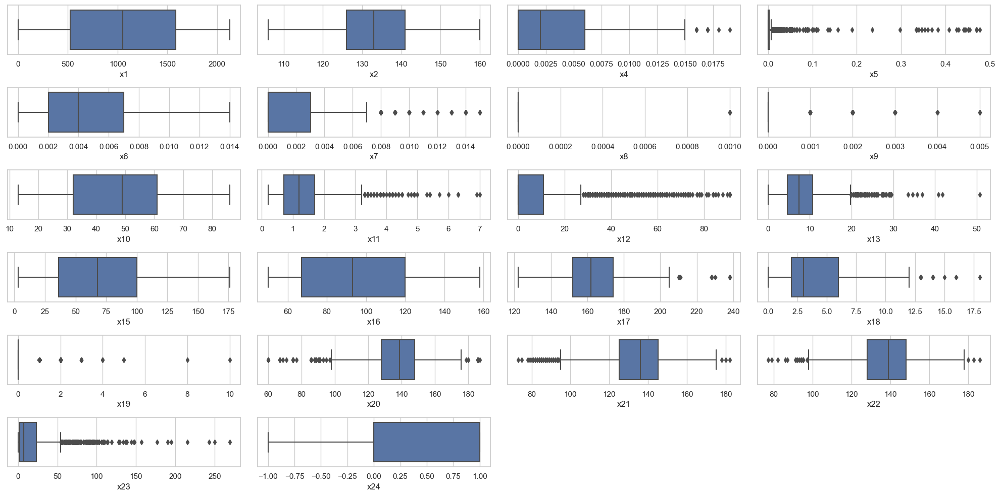

In [37]:
#using boxplot
plt.figure(figsize=(20, 10))
for i in enumerate(NUMERICAL_COLUMNS):
    plt.subplot(6, 4, i[0]+1)
    sns.boxplot(x=i[1], data=health_train_data)
# plt.show()

plt.savefig('num_bx'+'.jpg')
plt.tight_layout()

Although from the two graphs above, the scatter plot did not do justice in identifying outliers. However, the boxplot identified it clearly, as the whiskers can be visibly seen in all other columns except x1, x2, x6, x10, x15, x16 and x24.

### 1.6.1 Using Interquartile range(IQR) method

 #### - Using interquartile statistical technique to identify the outliers in each column data, i.e values below the lower limit or above the upper limit.

In [38]:
health_train_data_OL = dict()
# loop over each numeric column
for col in NUMERICAL_COLUMNS:
    # computing the InterQuartileRange(IQR), using Q1 and Q3
    Q1 = health_train_data[col].quantile(0.25)
    Q3 = health_train_data[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR

    # filtering out any outliers which are exceeding the range
    health_train_data_OL[col] = health_train_data[col][(health_train_data[col] < lower_limit) | (health_train_data[col] > upper_limit)].count()

health_train_data_OL

{'x1': 0,
 'x2': 0,
 'x4': 8,
 'x5': 222,
 'x6': 0,
 'x7': 102,
 'x8': 4,
 'x9': 131,
 'x10': 0,
 'x11': 53,
 'x12': 238,
 'x13': 58,
 'x15': 0,
 'x16': 0,
 'x17': 15,
 'x18': 16,
 'x19': 371,
 'x20': 52,
 'x21': 33,
 'x22': 19,
 'x23': 150,
 'x24': 0}

From the computation above, outliers are detected to be present in almost all the columns except for; x1, x2, x6, x10, x15, x16, and x24. This identifies that there are lots of outliers being identified with this interquartile range technique.

This is also similar to the visualisation from the boxplot.


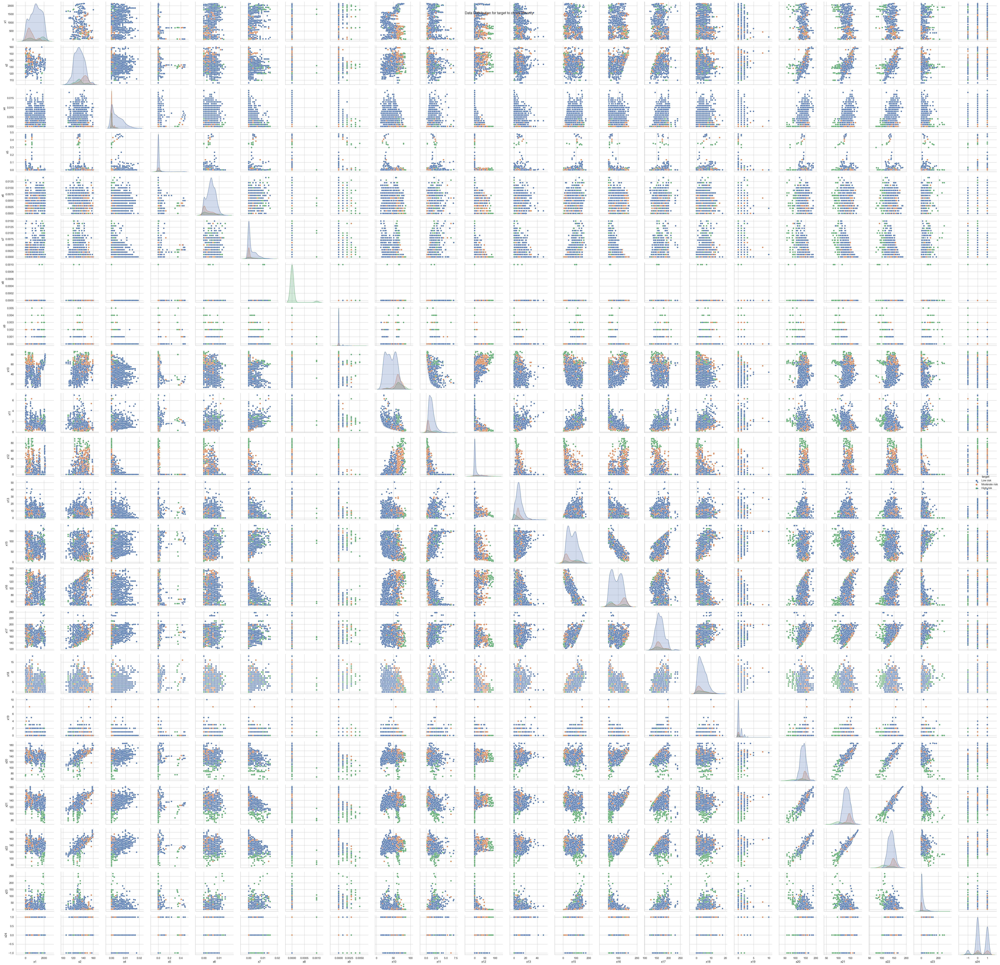

In [39]:
def show_distribution_plot(data, title):
    ax = sns.pairplot(data=data, hue=title)
    plt.suptitle("Data Distribution for "+title+ " to check linearity")
    plt.tight_layout()
#     plt.savefig(title+"_lin_non_lin_check.png")
    plt.show()
    


show_distribution_plot(health_train_data, 'target')  

# 2. DATA PREPROCESSING

## 2.1 Cleaning and filtering the dataset
Preparing the data by cleaning it. This is done by checking and removing 
- duplicates,
- unwanted data(rows or columns),
- dealing with missing values,
- dealing with the detected outliers

This process, prepares the data for preprocessing which in turn prepares the data for modeling.

### 2.1.1 Checking for duplicates

In [39]:
# checking for row duplicates
health_train_data.duplicated().sum()


0

Checking the dataset for duplicate values using the `duplicated()` function. The above returned a zero(0) value indicating that the dataset of all the patients record is void of duplicate values.

### 2.1.2 Checking for and removing unwanted data values


To clean the data, checking for nonsensical data and unwanted data is crucial. 

The function below searches through the values in every column and shows if there are any values that seems nonsensical (like having'?' or any symbol), this is because an health data record should not contain symbols like that.

In [40]:
def check_columns(patients_data):
    print(" \n Checking for unique data in each health data features")
    # A dictionary to hold each unique column and values in the health record dataFrame.
    data_dict = {}
    # checking for unique values containsed in each column
    for columns in health_train_data.columns:
        data_dict[columns] = np.unique(health_train_data[columns])

    for keys, values in data_dict.items():
        print(keys, ' : ', list(values))

In [41]:
check_columns(health_train_data)

 
 Checking for unique data in each health data features
id  :  ['PA1001', 'PA1002', 'PA1003', 'PA1004', 'PA1005', 'PA1006', 'PA1007', 'PA1008', 'PA1009', 'PA1010', 'PA1011', 'PA1012', 'PA1013', 'PA1014', 'PA1015', 'PA1016', 'PA1017', 'PA1018', 'PA1019', 'PA1020', 'PA1021', 'PA1022', 'PA1023', 'PA1024', 'PA1025', 'PA1026', 'PA1027', 'PA1028', 'PA1029', 'PA1030', 'PA1031', 'PA1032', 'PA1033', 'PA1034', 'PA1035', 'PA1036', 'PA1037', 'PA1038', 'PA1039', 'PA1040', 'PA1041', 'PA1042', 'PA1043', 'PA1044', 'PA1045', 'PA1046', 'PA1047', 'PA1048', 'PA1049', 'PA1050', 'PA1051', 'PA1052', 'PA1053', 'PA1054', 'PA1055', 'PA1056', 'PA1057', 'PA1058', 'PA1059', 'PA1060', 'PA1061', 'PA1062', 'PA1063', 'PA1064', 'PA1065', 'PA1066', 'PA1067', 'PA1068', 'PA1069', 'PA1070', 'PA1071', 'PA1072', 'PA1073', 'PA1074', 'PA1075', 'PA1076', 'PA1077', 'PA1078', 'PA1079', 'PA1080', 'PA1081', 'PA1082', 'PA1083', 'PA1084', 'PA1085', 'PA1086', 'PA1087', 'PA1088', 'PA1089', 'PA1090', 'PA1091', 'PA1092', 'PA1093', 'PA10

In [43]:
check_columns(health_train_data)

 
 Checking for unique data in each health data features
x1  :  [0, 1, 3, 4, 6, 8, 9, 10, 11, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 26, 28, 29, 30, 31, 32, 33, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 59, 60, 61, 62, 65, 66, 67, 70, 71, 72, 73, 74, 75, 76, 77, 79, 80, 81, 82, 83, 85, 86, 89, 90, 91, 93, 94, 95, 96, 97, 98, 99, 102, 103, 104, 105, 106, 107, 108, 109, 112, 113, 115, 117, 119, 120, 121, 123, 124, 125, 126, 127, 128, 129, 130, 131, 133, 134, 135, 136, 137, 139, 140, 141, 142, 143, 144, 145, 146, 148, 149, 150, 151, 152, 155, 156, 157, 159, 161, 162, 164, 165, 166, 168, 170, 171, 172, 173, 174, 175, 176, 178, 180, 181, 182, 183, 185, 186, 190, 191, 192, 194, 195, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 213, 214, 215, 216, 217, 218, 219, 220, 221, 223, 224, 227, 228, 230, 231, 234, 235, 237, 238, 239, 242, 243, 244, 246, 248, 249, 250, 251, 252, 253, 254, 255, 258, 259, 260, 261, 262, 263, 264, 2

Checking through the dataset, there were no unwanted or unsensical data(like '?'). 
However, it was quite evident from the visualisation  of categorical column using histogram plot (section 1.4) that there was a column `id` which would not have any relevant effect or impact on the dataset.

The `id` column will be discarded at this stage as it is not a particularly useful variable for the prediction of health target risk.

Therefore, it will be taken off using the `drop()` function.


In [42]:
#taking off the id data variable
health_train_data = health_train_data.drop(['id'], axis=1)
health_train_data.head()

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,...,x16,x17,x18,x19,x20,x21,x22,x23,x24,target
0,1406,145.00,F,0.01,0.00,0.00,0.00,0.00,0.00,46.00,...,104.00,171.00,4.00,0.00,155.00,153.00,154.00,4.00,1.00,Low risk
1,258,127.00,M,0.01,0.00,0.01,0.00,0.00,0.00,13.00,...,53.00,191.00,12.00,1.00,133.00,126.00,131.00,41.00,0.00,Low risk
2,479,145.00,F,0.00,0.00,0.00,0.00,0.00,0.00,57.00,...,111.00,157.00,1.00,1.00,150.00,146.00,149.00,6.00,1.00,Low risk
3,906,146.00,F,0.00,0.00,0.01,0.00,0.00,0.00,29.00,...,107.00,169.00,2.00,2.00,150.00,147.00,149.00,7.00,0.00,Low risk
4,1921,140.00,F,0.00,0.00,0.01,0.01,0.00,0.00,62.00,...,75.00,228.00,9.00,0.00,142.00,118.00,142.00,20.00,0.00,Low risk


In [44]:
health_train_data.shape

(1584, 25)

The dataset now has 1584 rows and 25 columns including the target variable.

Updating the `COLUMN` list to remove the `id` column, but first viewing the available columns

In [45]:
COLUMNS.remove("id")
COLUMNS

['x1',
 'x2',
 'x3',
 'x4',
 'x5',
 'x6',
 'x7',
 'x8',
 'x9',
 'x10',
 'x11',
 'x12',
 'x13',
 'x14',
 'x15',
 'x16',
 'x17',
 'x18',
 'x19',
 'x20',
 'x21',
 'x22',
 'x23',
 'x24']

Also updating the categorical columns variable list to remove the `id` column and get it ready for use.

In [46]:
CATEGORICAL_COLUMNS.remove("id")
CATEGORICAL_COLUMNS

['x3', 'x14']

## 2.1.3 Imputing and dealing with missing values
The missing data was only seen on the numerical column dataset.
Therefore, performing imputation on the Numerical column with the continuous values. This is because the outlier classification algorithm to be used does not accept missing data.

Describing the original train data initially to have a view of its description and compare with when values are been imputed.

In [47]:
health_train_data.describe()

,x1,x2,x4,x5,x6,x7,x8,x9,x10,x11,...,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24
count,1584.00,1584.00,1584.00,1540.00,1584.00,1584.00,1567.00,1584.00,1557.00,1584.00,...,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00
mean,1053.19,133.30,0.00,0.01,0.00,0.00,0.00,0.00,47.09,1.34,...,70.41,93.50,163.91,4.06,0.32,137.33,134.54,137.94,18.45,0.31
std,616.00,10.00,0.00,0.05,0.00,0.00,0.00,0.00,17.27,0.90,...,38.99,29.59,17.91,2.95,0.72,16.46,15.73,14.62,28.38,0.62
min,0.00,106.00,0.00,0.00,0.00,0.00,0.00,0.00,13.00,0.20,...,3.00,50.00,122.00,0.00,0.00,60.00,73.00,77.00,0.00,-1.00
25%,523.75,126.00,0.00,0.00,0.00,0.00,0.00,0.00,32.00,0.70,...,36.00,67.00,152.00,2.00,0.00,128.00,125.00,128.00,2.00,0.00
50%,1049.50,133.00,0.00,0.00,0.00,0.00,0.00,0.00,49.00,1.20,...,68.00,93.00,162.00,3.00,0.00,139.00,136.00,139.00,7.00,0.00
75%,1583.25,141.00,0.01,0.00,0.01,0.00,0.00,0.00,61.00,1.70,...,100.00,120.00,174.00,6.00,0.00,148.00,145.25,148.00,23.00,1.00
max,2125.00,160.00,0.02,0.48,0.01,0.01,0.00,0.01,86.00,7.00,...,176.00,158.00,238.00,18.00,10.00,187.00,182.00,186.00,269.00,1.00


Trying out two different methods of filling the 'NaN' values in the rows;
- backward-filling the missing values with the value preceeding it and filling the others with 0.
- using TransformerMixin to fill the numerical missing values with mean (the default strategy), thereby also preserving the categorical columns.

In [48]:
# replacing all na's with the values that comes directly before it in the same column, 
# then replace all the remaining nissing values with 0
bfill_data= health_train_data.fillna(method='bfill', axis=0).fillna(0)
bfill_data.describe()

,x1,x2,x4,x5,x6,x7,x8,x9,x10,x11,...,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24
count,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,...,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00
mean,1053.19,133.30,0.00,0.01,0.00,0.00,0.00,0.00,47.10,1.34,...,70.41,93.50,163.91,4.06,0.32,137.33,134.54,137.94,18.45,0.31
std,616.00,10.00,0.00,0.05,0.00,0.00,0.00,0.00,17.31,0.90,...,38.99,29.59,17.91,2.95,0.72,16.46,15.73,14.62,28.38,0.62
min,0.00,106.00,0.00,0.00,0.00,0.00,0.00,0.00,13.00,0.20,...,3.00,50.00,122.00,0.00,0.00,60.00,73.00,77.00,0.00,-1.00
25%,523.75,126.00,0.00,0.00,0.00,0.00,0.00,0.00,32.00,0.70,...,36.00,67.00,152.00,2.00,0.00,128.00,125.00,128.00,2.00,0.00
50%,1049.50,133.00,0.00,0.00,0.00,0.00,0.00,0.00,49.00,1.20,...,68.00,93.00,162.00,3.00,0.00,139.00,136.00,139.00,7.00,0.00
75%,1583.25,141.00,0.01,0.00,0.01,0.00,0.00,0.00,61.00,1.70,...,100.00,120.00,174.00,6.00,0.00,148.00,145.25,148.00,23.00,1.00
max,2125.00,160.00,0.02,0.48,0.01,0.01,0.00,0.01,86.00,7.00,...,176.00,158.00,238.00,18.00,10.00,187.00,182.00,186.00,269.00,1.00


In [49]:
class MissingDataImputer(TransformerMixin):

    def __init__(self):
        """Impute missing values.

        Columns of dtype object are imputed with the most frequent value 
        in column.

        Columns of other types are imputed with mean of column.

        """
    def fit(self, data_col, y=None):
        # Find most common value with value_counts() which returns 
        # counts in descending order so that the first element is the most frequently-occurring element.
        self.fill = pd.Series([health_train_data[c].value_counts().index[0]
            #Use that if type is object otherwise use mean                   
            if data_col[c].dtype == np.dtype('O') else data_col[c].mean() for c in data_col],
            index=data_col.columns)

        return self

    def transform(self, data_col, y=None):
        return data_col.fillna(self.fill)


#Define the data to be filled as X, we can pass the whole data frame and apply our new class
data_col = health_train_data
health_train_data = MissingDataImputer().fit_transform(data_col)

print('Train data before imputation...')
#viewing the missing value for the train data before imputation
count_missing_val_before_by_column = (data_col.isnull().sum())
print('Missing columns for the Train data:\n',count_missing_val_before_by_column[count_missing_val_before_by_column>0])

#and after imputation
print('Train data after imputation...')
count_missing_val_after_by_column = (health_train_data.isnull().sum())
print('Missing columns for the Train data:\n',count_missing_val_after_by_column[count_missing_val_after_by_column>0])



Train data before imputation...
Missing columns for the Train data:
 x5     44
x8     17
x10    27
dtype: int64
Train data after imputation...
Missing columns for the Train data:
 Series([], dtype: int64)


In [50]:
health_train_data.describe()

,x1,x2,x4,x5,x6,x7,x8,x9,x10,x11,...,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24
count,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,...,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00
mean,1053.19,133.30,0.00,0.01,0.00,0.00,0.00,0.00,47.09,1.34,...,70.41,93.50,163.91,4.06,0.32,137.33,134.54,137.94,18.45,0.31
std,616.00,10.00,0.00,0.05,0.00,0.00,0.00,0.00,17.12,0.90,...,38.99,29.59,17.91,2.95,0.72,16.46,15.73,14.62,28.38,0.62
min,0.00,106.00,0.00,0.00,0.00,0.00,0.00,0.00,13.00,0.20,...,3.00,50.00,122.00,0.00,0.00,60.00,73.00,77.00,0.00,-1.00
25%,523.75,126.00,0.00,0.00,0.00,0.00,0.00,0.00,32.00,0.70,...,36.00,67.00,152.00,2.00,0.00,128.00,125.00,128.00,2.00,0.00
50%,1049.50,133.00,0.00,0.00,0.00,0.00,0.00,0.00,48.00,1.20,...,68.00,93.00,162.00,3.00,0.00,139.00,136.00,139.00,7.00,0.00
75%,1583.25,141.00,0.01,0.00,0.01,0.00,0.00,0.00,61.00,1.70,...,100.00,120.00,174.00,6.00,0.00,148.00,145.25,148.00,23.00,1.00
max,2125.00,160.00,0.02,0.48,0.01,0.01,0.00,0.01,86.00,7.00,...,176.00,158.00,238.00,18.00,10.00,187.00,182.00,186.00,269.00,1.00


After running both methods, the `TransformerMixin()` gave a more accurate value when comapring it with the mean values of the original data. The `fillna()` function also gave a close range with the mean, but it altered it a bit.

So I wll opt for the `TransformerMixin()` as it is a better imputation method and it also help preserve the categorical column.



### 2.1.4 Handling the detected outliers

To carry out the handling of outliers, it would be performed using two different algorithms.
- DBSCAN, and
- Isolation Forest.
But first determining the useful hyperparameter is really necessary.
And to determine this, using `GridSearchCV()` function will help.

In [49]:
#Firstly performing GridSearchCV to determine the hyperparameters to use

# defining a range of values as the parameter grid for isolationForest to search over
param_grid_iso = {
    'n_estimators': [10, 50, 100, 150],
    'max_samples': [0.5, 0.7, 1.0, 100, 500, 1000, 1584],
    'contamination': [0.01, 0.05, 0.1]
}

# defining a range of values as the parameter grid for DBSCAN to search over
param_grid_dbscan = {
    'eps': [0.1, 0.5, 1.0, 2, 3,4,5,6,7,8,9,10],
    'min_samples': [2,3,4, 5,6,7,8,9, 10],
    'metric': ['euclidean', 'manhattan']
}

# IsolationForest object created
clf_iso = IsolationForest(random_state=6)
# DBSCAN object created
clf_dbscan = DBSCAN()

# create a GridSearchCV object for IsolationForest with the specified parameter grid
grid_search_iso = GridSearchCV(clf_iso, param_grid_iso, cv=5, scoring='f1_macro')
# create a GridSearchCV object for DBSCAN with the specified parameter grid
grid_search_dbscan = GridSearchCV(clf_dbscan, param_grid_dbscan, cv=5, scoring='f1_macro')

# fitting the IsolationForest grid search object to the data
grid_search_iso.fit(health_train_data[NUMERICAL_COLUMNS])
# fitting the DBSCAN grid search object to the data
grid_search_dbscan.fit(health_train_data[NUMERICAL_COLUMNS])

# print the best parameters found for IsolationForest
print("Best hyperparameters for IsolationForest: ", grid_search_iso.best_params_)
# print the best parameters found for DBSCAN
print("Best hyperparameters for DBSCAN: ",grid_search_dbscan.best_params_)

Best hyperparameters for IsolationForest:  {'contamination': 0.01, 'max_samples': 0.5, 'n_estimators': 10}
Best hyperparameters for DBSCAN:  {'eps': 0.1, 'metric': 'euclidean', 'min_samples': 2}


- Now detecting and then handling the detected outliers using the individual algorithms

#### To detect outliers, first using DBSCAN algorithm

In [50]:

#The algorithm is used for detecting outlier
#using the gridsearchcv predicted hyperparameters to create an DBSCAN object
outlier_detection = DBSCAN(min_samples = 2, eps = 0.10, metric= 'euclidean')
clustersDB = outlier_detection.fit_predict(health_train_data[NUMERICAL_COLUMNS])

#Count total number of outliers as count of those labelled as -1
TotalOutliersDB=list(clustersDB).count(-1)
print (clustersDB)
print("Total number of outliers identified is: ",TotalOutliersDB)

[-1 -1 -1 ... -1 -1 -1]
Total number of outliers identified is:  1584



#### To detect outliers, first using ISOLATION FOREST algorithm

In [51]:

#The algorithm is used for detecting outlier
#using the gridsearchcv predicted hyperparameters to create an isolationForest object
clf = IsolationForest(contamination= 0.01, max_samples= 0.5, n_estimators= 10, random_state = 1)
preds = clf.fit_predict(health_train_data[NUMERICAL_COLUMNS])
print(preds)

#Count total number of outliers as count of those labelled as -1
totalOutliers=0
for pred in preds:
    #predicted points labelled as -1 is an outlier
    if pred == -1:
        totalOutliers=totalOutliers+1
print("Total number of outliers identified is: ",totalOutliers)

[1 1 1 ... 1 1 1]
Total number of outliers identified is:  16


Outliers in data appear due to several reason of being abnormally low or high and this can inturn affect the analyses of the dataset. But removing them has to be carefully thought and dealt with proper understanding to distinguish the extremly high or low data from either being outliers or trend with respect to the domain knowledge.

However, a decision that removing the outliers may not be beneficial because of;
- The data given does not have a defined column to determine if the identified outlers are truly outliers as there is no measuring factor to decide.  
- The amount of outliers identified, looks like a great number and comparing it with the total number of data available would not be a good choice.

### 2.1.5 Correlation

- Checking for highly correlated information

Only checking for correlated information between the features variable, but will not perform any removal till after splitting the data into training and validation sets.
This is to ensure that data leakage is prevented and there is no bias occurrence towards the test data.


In [51]:
corr = health_train_data.corr()
corr

,x1,x2,x4,x5,x6,x7,x8,x9,x10,x11,...,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24
x1,1.00,-0.14,0.06,-0.17,0.44,0.29,0.05,0.16,0.14,0.12,...,-0.03,0.02,-0.05,-0.03,-0.03,-0.19,-0.28,-0.20,0.15,-0.15
x2,-0.14,1.00,-0.06,-0.04,-0.14,-0.16,-0.05,-0.11,0.31,-0.28,...,-0.12,0.35,0.31,-0.10,-0.00,0.72,0.73,0.79,-0.13,0.29
x4,0.06,-0.06,1.00,0.04,0.08,-0.11,-0.04,-0.12,-0.28,0.20,...,0.30,-0.15,0.41,0.20,-0.00,0.25,0.28,0.28,0.13,0.05
x5,-0.17,-0.04,0.04,1.00,-0.06,0.06,-0.01,0.27,-0.12,0.13,...,0.17,-0.16,0.11,0.18,-0.01,-0.06,-0.10,-0.08,0.20,-0.01
x6,0.44,-0.14,0.08,-0.06,1.00,0.29,-0.01,0.07,-0.23,0.29,...,0.14,-0.12,0.11,0.08,0.05,-0.11,-0.19,-0.15,0.23,-0.06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
x20,-0.19,0.72,0.25,-0.06,-0.11,-0.36,-0.19,-0.43,0.07,-0.30,...,-0.14,0.34,0.27,-0.10,-0.05,1.00,0.90,0.93,-0.30,0.41
x21,-0.28,0.73,0.28,-0.10,-0.19,-0.52,-0.14,-0.49,0.09,-0.44,...,-0.26,0.47,0.22,-0.20,-0.07,0.90,1.00,0.95,-0.39,0.33
x22,-0.20,0.79,0.28,-0.08,-0.15,-0.39,-0.14,-0.45,0.13,-0.33,...,-0.15,0.39,0.32,-0.11,-0.04,0.93,0.95,1.00,-0.29,0.39
x23,0.15,-0.13,0.13,0.20,0.23,0.55,0.12,0.51,-0.15,0.55,...,0.61,-0.54,0.43,0.46,0.19,-0.30,-0.39,-0.29,1.00,-0.08


visualisation of the correlated variables by using `heatmap` imported from seaborn library to show the correlated feature pairs present in the dataset. It uses a range of colors as indicators, with the blue indicating negative correlation and red indicating positive correlation.

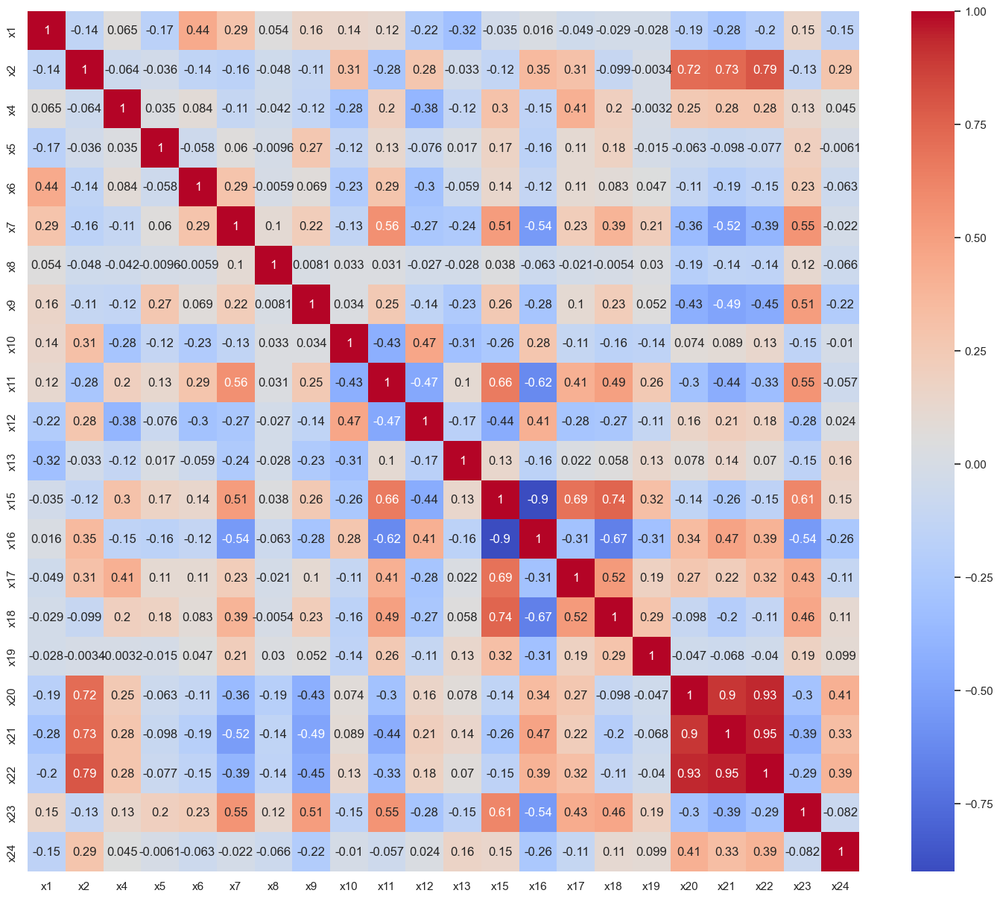

In [52]:
#Using Pearson Correlation
plt.figure(figsize=(18,15))
sns.heatmap(corr, annot=True,cmap='coolwarm')
plt.savefig('corrheatmap'+'.jpg')
plt.show()

## 2.2 Preprocessing

## 2.2.1 Designating the input (features) and output (target/label)variables
Performing the following:
 - seperate and assign the `target` variable which is the output variable as y
 - collate the values of the features variables also referred to as the input variable and then assign and store it as X


- Feature Variables
To designate the input variables into X and view the description and first few data records.

In [53]:
X = health_train_data[COLUMNS]
X.head()

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,...,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24
0,1406,145.00,F,0.01,0.00,0.00,0.00,0.00,0.00,46.00,...,67.00,104.00,171.00,4.00,0.00,155.00,153.00,154.00,4.00,1.00
1,258,127.00,M,0.01,0.00,0.01,0.00,0.00,0.00,13.00,...,138.00,53.00,191.00,12.00,1.00,133.00,126.00,131.00,41.00,0.00
2,479,145.00,F,0.00,0.00,0.00,0.00,0.00,0.00,57.00,...,46.00,111.00,157.00,1.00,1.00,150.00,146.00,149.00,6.00,1.00
3,906,146.00,F,0.00,0.00,0.01,0.00,0.00,0.00,29.00,...,62.00,107.00,169.00,2.00,2.00,150.00,147.00,149.00,7.00,0.00
4,1921,140.00,F,0.00,0.00,0.01,0.01,0.00,0.00,62.00,...,153.00,75.00,228.00,9.00,0.00,142.00,118.00,142.00,20.00,0.00


In [54]:
X.describe()

,x1,x2,x4,x5,x6,x7,x8,x9,x10,x11,...,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24
count,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,...,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00
mean,1053.19,133.30,0.00,0.01,0.00,0.00,0.00,0.00,47.09,1.34,...,70.41,93.50,163.91,4.06,0.32,137.33,134.54,137.94,18.45,0.31
std,616.00,10.00,0.00,0.05,0.00,0.00,0.00,0.00,17.12,0.90,...,38.99,29.59,17.91,2.95,0.72,16.46,15.73,14.62,28.38,0.62
min,0.00,106.00,0.00,0.00,0.00,0.00,0.00,0.00,13.00,0.20,...,3.00,50.00,122.00,0.00,0.00,60.00,73.00,77.00,0.00,-1.00
25%,523.75,126.00,0.00,0.00,0.00,0.00,0.00,0.00,32.00,0.70,...,36.00,67.00,152.00,2.00,0.00,128.00,125.00,128.00,2.00,0.00
50%,1049.50,133.00,0.00,0.00,0.00,0.00,0.00,0.00,48.00,1.20,...,68.00,93.00,162.00,3.00,0.00,139.00,136.00,139.00,7.00,0.00
75%,1583.25,141.00,0.01,0.00,0.01,0.00,0.00,0.00,61.00,1.70,...,100.00,120.00,174.00,6.00,0.00,148.00,145.25,148.00,23.00,1.00
max,2125.00,160.00,0.02,0.48,0.01,0.01,0.00,0.01,86.00,7.00,...,176.00,158.00,238.00,18.00,10.00,187.00,182.00,186.00,269.00,1.00


- Target Label Variable
To designate the output variables into y and view the first few data records.

In [55]:
y = health_train_data.target
y.head()

0    Low risk
1    Low risk
2    Low risk
3    Low risk
4    Low risk
Name: target, dtype: object

## 2.2.2 Viewing nature of data
To check if the data is balance or imbalanced.

In [56]:
# distribution of the target variable, 'target' 
health_train_data['target'].value_counts()

Low risk         1235
Moderate risk     219
High risk         130
Name: target, dtype: int64

In [57]:
# percentage distribution of the target variable, 'target' 
health_train_data['target'].value_counts(normalize=True)

Low risk        0.78
Moderate risk   0.14
High risk       0.08
Name: target, dtype: float64

In [58]:
def view_data_balance(target_column, title):
    label = np.unique(target_column)  # get the unique labels in the classes
    total_counts = target_column.value_counts()  # get the total counts of each unique label in the class
    ax = sns.barplot(x=label, y=total_counts)
    ax.set(xlabel=title, ylabel=title + " counts (arb)", title="Distribution view of "+title)
    for p in ax.patches:
        # retrieve each bar's height
        height = p.get_height()
        # include text in each bar
        ax.text(x=p.get_x() + (p.get_width() / 2), y=height + 3, s= '{: .0f}'.format(height), ha = 'center')
    plt.savefig(title+"_distribution.png")
    plt.show()

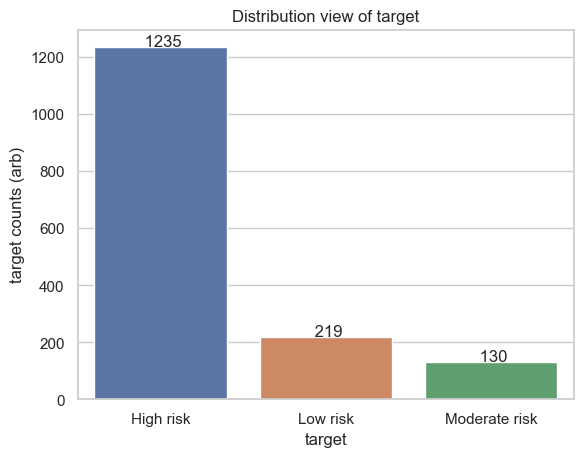

In [59]:
view_data_balance(health_train_data['target'],"target")

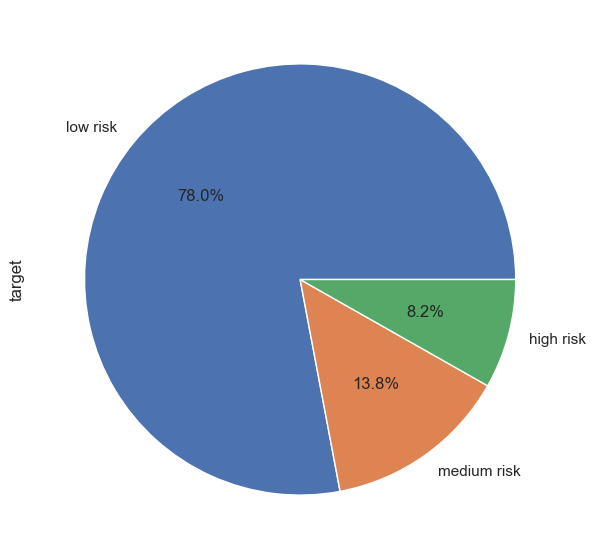

In [60]:
# visualising the distribution in the target variable using piechat 
plt.figure(figsize=(10,7))
health_train_data['target'].value_counts().plot(kind='pie', autopct='%1.1f%%', labels=['low risk', 'medium risk', 'high risk'])
plt.savefig('target_pie'+"_distribution.png")
plt.show()

### 2.2.3 Categorical data encoding

In [61]:
health_train_data.select_dtypes(include=['object']).columns

Index(['x3', 'x14', 'target'], dtype='object')

Perusing through the data, majority of the features of the patients' health data are numerical, while the others are categorical (implying that they were recorded as strings). In as much as some machine machine models can process data as strings, it is safe to encode them as integers for easy modeling. 


#### Categorical Features Encoding

###### Method 1 Trial- Ordinal Encoding

Performing Ordinal Encoding for x3 and x14 variables which includes gender and blood group, and append the new variable to X.

In [62]:
import category_encoders as ce

#We establish the Ordinal encoder which will convert each categorical label to a number
# We specify the columns we want to transform, we ask it to handle missing values if any and also to return a dataframe instead of an np array
enc = ce.OrdinalEncoder(cols=['x3','x14'], handle_missing='return_nan', return_df= True)

#We now fit the model and transform the data and put it in X which is a dataframe
X_ord=enc.fit_transform(X)
type(X_ord)

pandas.core.frame.DataFrame

In [63]:
X_ord

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,...,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24
0,1406,145.00,1.00,0.01,0.00,0.00,0.00,0.00,0.00,46.00,...,67.00,104.00,171.00,4.00,0.00,155.00,153.00,154.00,4.00,1.00
1,258,127.00,2.00,0.01,0.00,0.01,0.00,0.00,0.00,13.00,...,138.00,53.00,191.00,12.00,1.00,133.00,126.00,131.00,41.00,0.00
2,479,145.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,57.00,...,46.00,111.00,157.00,1.00,1.00,150.00,146.00,149.00,6.00,1.00
3,906,146.00,1.00,0.00,0.00,0.01,0.00,0.00,0.00,29.00,...,62.00,107.00,169.00,2.00,2.00,150.00,147.00,149.00,7.00,0.00
4,1921,140.00,1.00,0.00,0.00,0.01,0.01,0.00,0.00,62.00,...,153.00,75.00,228.00,9.00,0.00,142.00,118.00,142.00,20.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1579,2077,130.00,2.00,0.01,0.00,0.00,0.00,0.00,0.00,72.00,...,31.00,127.00,158.00,2.00,0.00,139.00,139.00,140.00,3.00,0.00
1580,664,138.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,60.00,...,118.00,69.00,187.00,10.00,1.00,142.00,130.00,140.00,61.00,0.00
1581,1431,144.00,1.00,0.00,0.00,0.01,0.00,0.00,0.00,45.00,...,30.00,139.00,169.00,2.00,0.00,157.00,155.00,157.00,2.00,0.00
1582,630,134.00,1.00,0.02,0.00,0.00,0.00,0.00,0.00,48.00,...,120.00,50.00,170.00,5.00,0.00,160.00,150.00,155.00,28.00,1.00


###### Method 2 Trial - OneHot Encoding

Performing OneHotEncoding for `x3` and `x14` variables which includes _gender_ and _blood group_, and append the new variable to X.

In [64]:

# create an instance of OneHotEncoder
ohenc_trial = OneHotEncoder(handle_unknown='ignore')

# passing x3 column to fit and transform the x3 column
ohenc_trial_df = pd.DataFrame(ohenc_trial.fit_transform(X[['x3']]).toarray())

# rename the encoded dataframe's columns
ohenc_trial_df.columns = ohenc_trial.get_feature_names_out(['x3'])
print(ohenc_trial_df)

# concatenate the encoded dataframe with the original dataframe
X_enc_trial = pd.concat([X, ohenc_trial_df], axis=1)
print(X_enc_trial)


      x3_F  x3_M
0     1.00  0.00
1     0.00  1.00
2     1.00  0.00
3     1.00  0.00
4     1.00  0.00
...    ...   ...
1579  0.00  1.00
1580  1.00  0.00
1581  1.00  0.00
1582  1.00  0.00
1583  1.00  0.00

[1584 rows x 2 columns]
        x1     x2 x3   x4   x5   x6   x7   x8   x9   x10  ...    x17   x18  \
0     1406 145.00  F 0.01 0.00 0.00 0.00 0.00 0.00 46.00  ... 171.00  4.00   
1      258 127.00  M 0.01 0.00 0.01 0.00 0.00 0.00 13.00  ... 191.00 12.00   
2      479 145.00  F 0.00 0.00 0.00 0.00 0.00 0.00 57.00  ... 157.00  1.00   
3      906 146.00  F 0.00 0.00 0.01 0.00 0.00 0.00 29.00  ... 169.00  2.00   
4     1921 140.00  F 0.00 0.00 0.01 0.01 0.00 0.00 62.00  ... 228.00  9.00   
...    ...    ... ..  ...  ...  ...  ...  ...  ...   ...  ...    ...   ...   
1579  2077 130.00  M 0.01 0.00 0.00 0.00 0.00 0.00 72.00  ... 158.00  2.00   
1580   664 138.00  F 0.00 0.00 0.00 0.00 0.00 0.00 60.00  ... 187.00 10.00   
1581  1431 144.00  F 0.00 0.00 0.01 0.00 0.00 0.00 45.00  ... 169.00 

In [65]:
# create an instance of OneHotEncoder
ohenc_trial = OneHotEncoder(handle_unknown='ignore')

# passing x3 column to fit and transform the x3 column
ohenc_trial_df = pd.DataFrame(ohenc_trial.fit_transform(X[['x14']]).toarray())

# rename the encoded dataframe's columns
ohenc_trial_df.columns = ohenc_trial.get_feature_names_out(['x14'])
print(ohenc_trial_df)

# concatenate the encoded dataframe with the original dataframe
X_enc_trial = pd.concat([X, ohenc_trial_df], axis=1)
print(X_enc_trial)

      x14_A+  x14_A-  x14_AB+  x14_AB-  x14_B+  x14_B-  x14_O+  x14_O-
0       0.00    0.00     0.00     0.00    0.00    0.00    1.00    0.00
1       1.00    0.00     0.00     0.00    0.00    0.00    0.00    0.00
2       0.00    0.00     0.00     0.00    0.00    0.00    1.00    0.00
3       0.00    0.00     0.00     0.00    0.00    0.00    1.00    0.00
4       0.00    0.00     0.00     0.00    1.00    0.00    0.00    0.00
...      ...     ...      ...      ...     ...     ...     ...     ...
1579    0.00    0.00     0.00     0.00    0.00    1.00    0.00    0.00
1580    0.00    0.00     0.00     0.00    1.00    0.00    0.00    0.00
1581    0.00    0.00     0.00     0.00    0.00    0.00    0.00    1.00
1582    1.00    0.00     0.00     0.00    0.00    0.00    0.00    0.00
1583    1.00    0.00     0.00     0.00    0.00    0.00    0.00    0.00

[1584 rows x 8 columns]
        x1     x2 x3   x4   x5   x6   x7   x8   x9   x10  ...   x23  x24  \
0     1406 145.00  F 0.01 0.00 0.00 0.00 0.00 0

After categorical encoding, it is required that the original columns (__x3__ and __x14__) with the categorical values will be dropped using the _drop()_ function. This is to avoid errors because they are still with categorical values.

In [66]:
# X = health_train_data.iloc[:,:-1]
X_enc_trial.drop(['x3', 'x14'], inplace=True, axis=1)
X_enc_trial

,x1,x2,x4,x5,x6,x7,x8,x9,x10,x11,...,x23,x24,x14_A+,x14_A-,x14_AB+,x14_AB-,x14_B+,x14_B-,x14_O+,x14_O-
0,1406,145.00,0.01,0.00,0.00,0.00,0.00,0.00,46.00,0.80,...,4.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00
1,258,127.00,0.01,0.00,0.01,0.00,0.00,0.00,13.00,3.80,...,41.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,479,145.00,0.00,0.00,0.00,0.00,0.00,0.00,57.00,0.50,...,6.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00
3,906,146.00,0.00,0.00,0.01,0.00,0.00,0.00,29.00,1.20,...,7.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00
4,1921,140.00,0.00,0.00,0.01,0.01,0.00,0.00,62.00,1.60,...,20.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1579,2077,130.00,0.01,0.00,0.00,0.00,0.00,0.00,72.00,0.90,...,3.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00
1580,664,138.00,0.00,0.00,0.00,0.00,0.00,0.00,60.00,1.00,...,61.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00
1581,1431,144.00,0.00,0.00,0.01,0.00,0.00,0.00,45.00,0.70,...,2.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00
1582,630,134.00,0.02,0.00,0.00,0.00,0.00,0.00,48.00,2.20,...,28.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


Therefore, from the two trial methods as seen above, the two categorical features `x3` and `x14` will be encoded using __OneHotEncoder__, this is because there is no hierarchical or ordinal relationship between the content in the data.

And then, the original columns (__x3__ and __x14__) with the categorical values will be dropped using the _drop()_ function.


A reusable and callable function will be used to encode the two categorical columns.

In [67]:
def one_hot_encode_columns(X_data, column_names, drop_original_cat_col=True):
    # Create an instance of OneHotEncoder
    ohenc = OneHotEncoder(handle_unknown='ignore')

    # Create an empty DataFrame to store the encoded columns
    ohenc_df = pd.DataFrame()

    # Iterate over each column name
    for column_name in column_names:
        # Fit and transform the specified column
        encoded_column = ohenc.fit_transform(X_data[[column_name]]).toarray()

        # Create a DataFrame with the encoded column and append it to ohenc_df
        encoded_column_df = pd.DataFrame(encoded_column, columns=ohenc.get_feature_names_out([column_name]))
        ohenc_df = pd.concat([ohenc_df, encoded_column_df], axis=1)

    # Concatenate the encoded dataframe with the original dataframe
    encoded_data = pd.concat([X_data, ohenc_df], axis=1)

    # Drop the original columns if specified
    if drop_original_cat_col:
        encoded_data.drop(column_names, axis=1, inplace=True)

    return encoded_data

# Calling the function on the categorical columns of the health dataset
cat_columns_to_encode = ['x3', 'x14']  # List of column names to encode
X = one_hot_encode_columns(X, cat_columns_to_encode, drop_original_cat_col=True)
print(X)

        x1     x2   x4   x5   x6   x7   x8   x9   x10  x11  ...  x3_F  x3_M  \
0     1406 145.00 0.01 0.00 0.00 0.00 0.00 0.00 46.00 0.80  ...  1.00  0.00   
1      258 127.00 0.01 0.00 0.01 0.00 0.00 0.00 13.00 3.80  ...  0.00  1.00   
2      479 145.00 0.00 0.00 0.00 0.00 0.00 0.00 57.00 0.50  ...  1.00  0.00   
3      906 146.00 0.00 0.00 0.01 0.00 0.00 0.00 29.00 1.20  ...  1.00  0.00   
4     1921 140.00 0.00 0.00 0.01 0.01 0.00 0.00 62.00 1.60  ...  1.00  0.00   
...    ...    ...  ...  ...  ...  ...  ...  ...   ...  ...  ...   ...   ...   
1579  2077 130.00 0.01 0.00 0.00 0.00 0.00 0.00 72.00 0.90  ...  0.00  1.00   
1580   664 138.00 0.00 0.00 0.00 0.00 0.00 0.00 60.00 1.00  ...  1.00  0.00   
1581  1431 144.00 0.00 0.00 0.01 0.00 0.00 0.00 45.00 0.70  ...  1.00  0.00   
1582   630 134.00 0.02 0.00 0.00 0.00 0.00 0.00 48.00 2.20  ...  1.00  0.00   
1583   436 151.00 0.00 0.00 0.01 0.01 0.00 0.00 64.00 1.10  ...  1.00  0.00   

      x14_A+  x14_A-  x14_AB+  x14_AB-  x14_B+  x14

#### Categorical Target Label  Encoding

Encoding the label using label encoder. This encodes the data alphabetically

In [68]:
from sklearn.preprocessing import LabelEncoder

#encode the labels from strings to values.
le = LabelEncoder()

y = le.fit_transform(y)
print("Original labels", le.classes_)
print("Labels after encoding", y)

Original labels ['High risk' 'Low risk' 'Moderate risk']
Labels after encoding [1 1 1 ... 2 1 2]


# High = 0
# Low = 1
# Moderate = 2

# 3. SUPERVISED MODEL TRAINING AND EVALUATION

# This process will include 
* Data split and further preporcessing
* Model training and evaluation

## 3.1 Data split and further preprocessing

### 3.1.1 Stratified splitting of the data to generate train and validation dataset 

In [69]:
from sklearn.model_selection import train_test_split

# Without stratification divide into first partition and test set.
train_X, val_X, train_y, val_y= train_test_split(X,y, test_size=0.3, random_state=10, stratify=y)

print(train_X.describe())
print(val_X.describe())

           x1      x2      x4      x5      x6      x7      x8      x9     x10  \
count 1108.00 1108.00 1108.00 1108.00 1108.00 1108.00 1108.00 1108.00 1108.00   
mean  1038.27  133.14    0.00    0.01    0.00    0.00    0.00    0.00   46.94   
std    608.70   10.17    0.00    0.05    0.00    0.00    0.00    0.00   16.98   
min      0.00  106.00    0.00    0.00    0.00    0.00    0.00    0.00   13.00   
25%    525.75  125.00    0.00    0.00    0.00    0.00    0.00    0.00   32.00   
50%   1036.00  133.00    0.00    0.00    0.00    0.00    0.00    0.00   48.00   
75%   1556.25  141.00    0.01    0.00    0.01    0.00    0.00    0.00   61.00   
max   2125.00  160.00    0.02    0.47    0.01    0.01    0.00    0.01   86.00   

          x11  ...    x3_F    x3_M  x14_A+  x14_A-  x14_AB+  x14_AB-  x14_B+  \
count 1108.00  ... 1108.00 1108.00 1108.00 1108.00  1108.00  1108.00 1108.00   
mean     1.33  ...    0.46    0.54    0.21    0.11     0.04     0.01    0.20   
std      0.88  ...    0.50    

In [70]:
train_y_frame= pd.DataFrame(train_y)
train_y_frame.value_counts()

1    864
2    153
0     91
dtype: int64

### 3.1.2 Data Balancing  and sampling by Upsampling

In [71]:
#The first thing is contatenate our training data back together.  
resampling = train_X.copy()
resampling['target']= train_y

# separate minority and majority classes
majority_class = resampling[resampling['target']==1]
minority_class1 = resampling[resampling['target']==0]
minority_class2 = resampling[resampling['target']== 2]

# Upsample minority classes
minority_upsampled1 = resample(minority_class1, 
                               replace=True,     # sample with replacement
                               n_samples=864,     # half of the number to match majority class
                               random_state=123) # reproducible results

minority_upsampled2 = resample(minority_class2, 
                               replace=True,     # sample with replacement
                               n_samples=864,     # half of the number to match majority class
                               random_state=123) # reproducible results

# Combine majority class with upsampled minority classes
upsampled = pd.concat([majority_class, minority_upsampled1, minority_upsampled2])

# Show dataset statistics
print(upsampled.describe())
 
# Display new class counts
upsampled.target.value_counts()

           x1      x2      x4      x5      x6      x7      x8      x9     x10  \
count 2592.00 2592.00 2592.00 2592.00 2592.00 2592.00 2592.00 2592.00 2592.00   
mean   964.87  134.70    0.00    0.02    0.00    0.00    0.00    0.00   55.61   
std    637.81   10.18    0.00    0.07    0.00    0.00    0.00    0.00   17.20   
min      0.00  106.00    0.00    0.00    0.00    0.00    0.00    0.00   13.00   
25%    403.00  128.00    0.00    0.00    0.00    0.00    0.00    0.00   43.00   
50%    771.00  134.00    0.00    0.00    0.00    0.00    0.00    0.00   61.00   
75%   1572.25  143.00    0.00    0.01    0.01    0.00    0.00    0.00   67.00   
max   2125.00  160.00    0.02    0.47    0.01    0.01    0.00    0.01   86.00   

          x11  ...    x3_M  x14_A+  x14_A-  x14_AB+  x14_AB-  x14_B+  x14_B-  \
count 2592.00  ... 2592.00 2592.00 2592.00  2592.00  2592.00 2592.00 2592.00   
mean     1.20  ...    0.48    0.26    0.07     0.06     0.02    0.18    0.12   
std      0.96  ...    0.50    

1    864
0    864
2    864
Name: target, dtype: int64

In [72]:
train_X_samp = upsampled.iloc[:,:-1]
train_X_samp

,x1,x2,x4,x5,x6,x7,x8,x9,x10,x11,...,x3_F,x3_M,x14_A+,x14_A-,x14_AB+,x14_AB-,x14_B+,x14_B-,x14_O+,x14_O-
1284,2071,130.00,0.01,0.00,0.01,0.00,0.00,0.00,69.00,0.70,...,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00
1578,1731,134.00,0.01,0.00,0.01,0.01,0.00,0.00,61.00,1.10,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00
1549,1520,133.00,0.01,0.00,0.01,0.00,0.00,0.00,31.00,1.30,...,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00
927,81,145.00,0.00,0.01,0.00,0.00,0.00,0.00,40.00,1.40,...,1.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
629,603,144.00,0.01,0.01,0.00,0.00,0.00,0.00,73.00,0.70,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,534,137.00,0.00,0.00,0.00,0.00,0.00,0.00,63.00,0.50,...,1.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00
226,779,128.00,0.00,0.00,0.00,0.00,0.00,0.00,73.00,0.20,...,0.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00
565,796,146.00,0.00,0.00,0.00,0.00,0.00,0.00,66.00,0.40,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00
582,1211,137.00,0.00,0.00,0.00,0.00,0.00,0.00,61.00,0.40,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00


In [73]:
train_y_samp = upsampled.target
train_y_samp

1284    1
1578    1
1549    1
927     1
629     1
       ..
917     2
226     2
565     2
582     2
12      2
Name: target, Length: 2592, dtype: int32

### 3.1.3 Feature selection

### Feature Selection on train data

#### Method Trial 1- Using Univariate Filter Method: __ANOVA f-test Feature Selection__

In [76]:
from sklearn.feature_selection import SelectKBest, f_classif

# Keep the features but rank them by best f_classif score
ft_selector = SelectKBest(f_classif)

#Fit and apply feature ranking method
Xfc = ft_selector.fit_transform(train_X_samp, train_y_samp)

#Retrieve the column names for the selected columns
ft_names = train_X_samp.columns.values[ft_selector.get_support()]
#Retrieve the the scores of the selected columns 
scores = ft_selector.scores_[ft_selector.get_support()]
#pairing the value of the column names and scores together with the zip function
ft_names_scores = list(zip(ft_names, scores))
#Store the information in a data frame
ns_df_fc = pd.DataFrame(data = ft_names_scores, columns=['Feat_names', 'F_Scores'])
#Sort the dataframe for better visualization
ns_df_sortedfc = ns_df_fc.sort_values(['F_Scores', 'Feat_names'], ascending = [False, True])
print(ns_df_sortedfc)
#Look at shape of new data
Xfc.shape

  Feat_names  F_Scores
5        x21    801.68
6        x22    731.70
1         x4    691.23
4        x20    674.83
2         x9    555.38
3        x10    527.21
7        x23    323.89
0         x2    311.71
8       x3_F    305.26
9       x3_M    305.26


(2592, 10)

In [77]:
ft_names 

array(['x2', 'x4', 'x9', 'x10', 'x20', 'x21', 'x22', 'x23', 'x3_F',
       'x3_M'], dtype=object)

when k is specified as 17

In [78]:
from sklearn.feature_selection import SelectKBest, f_classif
# Keep 17 of the features but rank them by best f_classif score
ft_selector = SelectKBest(f_classif, k= 17)

#Fit and apply feature ranking method
Xfc = ft_selector.fit_transform(train_X_samp, train_y_samp)

#Retrieve the column names for the selected columns
ft_names = train_X_samp.columns.values[ft_selector.get_support()]
#Retrieve the the scores of the selected columns 
scores = ft_selector.scores_[ft_selector.get_support()]
#pairing the value of the column names and scores together with the zip function
ft_names_scores = list(zip(ft_names, scores))
#Store the information in a data frame
ns_df_fc = pd.DataFrame(data = ft_names_scores, columns=['Feat_names', 'F_Scores'])
#Sort the dataframe for better visualization
ns_df_sortedfc = ns_df_fc.sort_values(['F_Scores', 'Feat_names'], ascending = [False, True])
print(ns_df_sortedfc)
#Look at shape of new data
Xfc.shape

   Feat_names  F_Scores
11        x21    801.68
12        x22    731.70
2          x4    691.23
10        x20    674.83
4          x9    555.38
..        ...       ...
6         x11    236.57
0          x1    234.88
3          x7    189.41
9         x16    175.84
14        x24    167.46

[17 rows x 2 columns]


(2592, 17)

In [79]:
ft_names #at k=17

array(['x1', 'x2', 'x4', 'x7', 'x9', 'x10', 'x11', 'x12', 'x13', 'x16',
       'x20', 'x21', 'x22', 'x23', 'x24', 'x3_F', 'x3_M'], dtype=object)

when k is specified as 23

In [80]:
# Keep the features but rank them by best f_classif score
ft_selector = SelectKBest(f_classif, k= 23)

#Fit and apply feature ranking method
Xfc = ft_selector.fit_transform(train_X_samp, train_y_samp)

#Retrieve the column names for the selected columns
ft_names = train_X_samp.columns.values[ft_selector.get_support()]
#Retrieve the the scores of the selected columns 
scores = ft_selector.scores_[ft_selector.get_support()]
#pairing the value of the column names and scores together with the zip function
ft_names_scores = list(zip(ft_names, scores))
#Store the information in a data frame
ns_df_fc = pd.DataFrame(data = ft_names_scores, columns=['Feat_names', 'F_Scores'])
#Sort the dataframe for better visualization
ns_df_sortedfc = ns_df_fc.sort_values(['F_Scores', 'Feat_names'], ascending = [False, True])
print(ns_df_sortedfc)
#Look at shape of new data
Xfc.shape

   Feat_names  F_Scores
14        x21    801.68
15        x22    731.70
2          x4    691.23
13        x20    674.83
6          x9    555.38
..        ...       ...
4          x6    148.48
22     x14_O+    127.20
11        x15     92.06
3          x5     61.16
21     x14_B-     59.54

[23 rows x 2 columns]


(2592, 23)

In [81]:
ft_names #at k=23

array(['x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x9', 'x10', 'x11', 'x12',
       'x13', 'x15', 'x16', 'x20', 'x21', 'x22', 'x23', 'x24', 'x3_F',
       'x3_M', 'x14_A+', 'x14_B-', 'x14_O+'], dtype=object)

#### Method Trial 2- Using Univariate Filter Method: __Mutual Information Feature Selection__

In [82]:
from sklearn.feature_selection import SelectKBest, mutual_info_classif
# configure to select all features
selectorm = SelectKBest(score_func=mutual_info_classif)

# transform train input data
Xmic = selectorm.fit_transform(train_X_samp, train_y_samp)

#Retrieve the column names for the selected columns
mic_names = train_X_samp.columns.values[selectorm.get_support()]
#Retrieve the the scores of the selected columns 
scores = selectorm.scores_[selectorm.get_support()]
#pairing the value of the column names and scores together with the zip function
names_scores = list(zip(mic_names, scores))
#Store the information in a data frame
ns_df_mic = pd.DataFrame(data = names_scores, columns=['Feat_names', 'Mutual_info_Scores'])
#Sort the dataframe for better visualization
ns_df_sortedmic = ns_df_mic.sort_values(['Mutual_info_Scores', 'Feat_names'], ascending = [False, True])
print(ns_df_sortedmic)
#Look at shape of new data
Xmic.shape

  Feat_names  Mutual_info_Scores
0         x1                0.96
3        x13                0.47
2        x12                0.46
4        x15                0.44
9        x23                0.41
1        x10                0.41
7        x21                0.40
6        x20                0.40
8        x22                0.39
5        x16                0.39


(2592, 10)

In [83]:
mic_names

array(['x1', 'x10', 'x12', 'x13', 'x15', 'x16', 'x20', 'x21', 'x22',
       'x23'], dtype=object)

when k is specified as 17

In [84]:
from sklearn.feature_selection import SelectKBest, mutual_info_classif
# configure to select all features
selectorm = SelectKBest(score_func=mutual_info_classif, k=17)

# transform train input data
Xmic = selectorm.fit_transform(train_X_samp, train_y_samp)

#Retrieve the column names for the selected columns
mic_names = train_X_samp.columns.values[selectorm.get_support()]
#Retrieve the the scores of the selected columns 
scores = selectorm.scores_[selectorm.get_support()]
#pairing the value of the column names and scores together with the zip function
names_scores = list(zip(mic_names, scores))
#Store the information in a data frame
ns_df_mic = pd.DataFrame(data = names_scores, columns=['Feat_names', 'Mutual_info_Scores'])
#Sort the dataframe for better visualization
ns_df_sortedmic = ns_df_mic.sort_values(['Mutual_info_Scores', 'Feat_names'], ascending = [False, True])
print(ns_df_sortedmic)
#Look at shape of new data
Xmic.shape

   Feat_names  Mutual_info_Scores
0          x1                0.96
9         x13                0.48
8         x12                0.44
10        x15                0.44
6         x10                0.41
..        ...                 ...
12        x17                0.26
2          x4                0.23
5          x9                0.18
3          x5                0.18
4          x7                0.12

[17 rows x 2 columns]


(2592, 17)

In [85]:
mic_names #at k=17

array(['x1', 'x2', 'x4', 'x5', 'x7', 'x9', 'x10', 'x11', 'x12', 'x13',
       'x15', 'x16', 'x17', 'x20', 'x21', 'x22', 'x23'], dtype=object)

when k is specified as all

In [86]:
from sklearn.feature_selection import SelectKBest, mutual_info_classif
# configure to select all features
selectorm = SelectKBest(score_func=mutual_info_classif, k='all')

# transform train input data
Xmic = selectorm.fit_transform(train_X_samp, train_y_samp)

#Retrieve the column names for the selected columns
mic_names = train_X_samp.columns.values[selectorm.get_support()]
#Retrieve the the scores of the selected columns 
scores = selectorm.scores_[selectorm.get_support()]
#pairing the value of the column names and scores together with the zip function
names_scores = list(zip(mic_names, scores))
#Store the information in a data frame
ns_df_mic = pd.DataFrame(data = names_scores, columns=['Feat_names', 'Mutual_info_Scores'])
#Sort the dataframe for better visualization
ns_df_sortedmic = ns_df_mic.sort_values(['Mutual_info_Scores', 'Feat_names'], ascending = [False, True])
print(ns_df_sortedmic)
#Look at shape of new data
Xmic.shape

   Feat_names  Mutual_info_Scores
0          x1                0.96
11        x13                0.47
10        x12                0.44
12        x15                0.43
18        x21                0.42
..        ...                 ...
25     x14_A-                0.01
31     x14_O-                0.01
27    x14_AB-                0.00
28     x14_B+                0.00
6          x8                0.00

[32 rows x 2 columns]


(2592, 32)

In [87]:
mic_names #at k='all

array(['x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'x11',
       'x12', 'x13', 'x15', 'x16', 'x17', 'x18', 'x19', 'x20', 'x21',
       'x22', 'x23', 'x24', 'x3_F', 'x3_M', 'x14_A+', 'x14_A-', 'x14_AB+',
       'x14_AB-', 'x14_B+', 'x14_B-', 'x14_O+', 'x14_O-'], dtype=object)

#### Method Trial 3- Using Model-Based Embedded Method: __SelectFromModel with Tree Based Model__

This method is used with DecisionTreeClassifier() and to determine the best parameters to use, I will be using GridSearchCV to iterate through the different hyperparameters.

In [92]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

# define the parameters for grid search
params = {
    'criterion' : ['gini', 'entropy', 'log_loss'],
    'max_depth': [1,2,3,4, 6, 8,9,10,20,21,25,30],
   'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 3, 4]
}

#create an object of the DecisionTreeClassifier feature selection
dt_clf = DecisionTreeClassifier()

# create a GridSearchCV object with the parameters
grid = GridSearchCV(dt_clf, param_grid=params, scoring='accuracy')

# fit the grid search object to the data
grid.fit(train_X_samp, train_y_samp)

# print the best parameters and score
print("Best Parameters: ", grid.best_params_)
print("Best Score: ", grid.best_score_)

Best Parameters:  {'criterion': 'gini', 'max_depth': 25, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best Score:  0.9849539878441613


Having got all the hyperparameter values to use, then I had to perfrom the embedded method using the __SelectFromModel__

In [93]:
from sklearn.feature_selection import SelectFromModel
# defining the tree-based feature importance score 

clf_sfm = DecisionTreeClassifier(criterion='gini', max_depth=25, min_samples_leaf=1, min_samples_split=2, random_state=10)
clf_sfm.fit(train_X_samp, train_y_samp)
print(clf_sfm.feature_importances_)

# use SelectFromModel to select the top most important features
selector_sfm = SelectFromModel(clf_sfm)
X_sfm = selector_sfm.fit_transform(train_X_samp, train_y_samp)

[0.0384472  0.01460007 0.05552173 0.00562308 0.01720579 0.00113426
 0.         0.04651694 0.11095562 0.20257947 0.16576583 0.00584673
 0.01535489 0.         0.00556299 0.02407022 0.00591907 0.01432801
 0.20434535 0.04533861 0.         0.00694444 0.         0.00267094
 0.00105219 0.00096451 0.         0.         0.         0.00824653
 0.00100553 0.        ]


In [94]:
sfm_selected_columns= train_X_samp.columns.values[selector_sfm.get_support()]
sfm_selected_columns

array(['x1', 'x4', 'x9', 'x10', 'x11', 'x12', 'x21', 'x22'], dtype=object)

In [84]:
# X_new

array([[ 2.071e+03,  7.000e-03,  1.000e-03, ...,  3.000e+00,  0.000e+00,
         0.000e+00],
       [ 1.731e+03,  8.000e-03,  1.000e-03, ...,  6.100e+01,  0.000e+00,
         0.000e+00],
       [ 1.520e+03,  5.000e-03,  0.000e+00, ...,  1.000e+01,  0.000e+00,
         0.000e+00],
       ...,
       [ 7.960e+02,  0.000e+00,  0.000e+00, ...,  1.000e+00,  0.000e+00,
         0.000e+00],
       [ 1.211e+03,  0.000e+00,  0.000e+00, ...,  0.000e+00,  0.000e+00,
         0.000e+00],
       [ 3.030e+02,  0.000e+00,  1.800e-02, ...,  0.000e+00, -1.000e+00,
         0.000e+00]])

__#Getting the columns from the ANOVA f-test feature selection at k=23__

In [95]:
selected_feat_columns_aft= train_X_samp.columns.values[ft_selector.get_support()]
selected_feat_columns_aft

array(['x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x9', 'x10', 'x11', 'x12',
       'x13', 'x15', 'x16', 'x20', 'x21', 'x22', 'x23', 'x24', 'x3_F',
       'x3_M', 'x14_A+', 'x14_B-', 'x14_O+'], dtype=object)

__#Getting the columns from selectFromModel feature selection__

In [96]:
selected_feat_columns_sfm= train_X_samp.columns.values[selector_sfm.get_support()]
selected_feat_columns_sfm

array(['x1', 'x4', 'x9', 'x10', 'x11', 'x12', 'x21', 'x22'], dtype=object)

__#Getting the columns from mutual_info feature selection__

In [97]:
selected_feat_columns_mi= train_X_samp.columns.values[selectorm.get_support()]
selected_feat_columns_mi

array(['x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'x11',
       'x12', 'x13', 'x15', 'x16', 'x17', 'x18', 'x19', 'x20', 'x21',
       'x22', 'x23', 'x24', 'x3_F', 'x3_M', 'x14_A+', 'x14_A-', 'x14_AB+',
       'x14_AB-', 'x14_B+', 'x14_B-', 'x14_O+', 'x14_O-'], dtype=object)

_Applying Mututal Information selected features for the train X feature columns_

In [98]:
train_X_new_mi = train_X_samp[selected_feat_columns_mi]
train_X_new_mi

,x1,x2,x4,x5,x6,x7,x8,x9,x10,x11,...,x3_F,x3_M,x14_A+,x14_A-,x14_AB+,x14_AB-,x14_B+,x14_B-,x14_O+,x14_O-
1284,2071,130.00,0.01,0.00,0.01,0.00,0.00,0.00,69.00,0.70,...,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00
1578,1731,134.00,0.01,0.00,0.01,0.01,0.00,0.00,61.00,1.10,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00
1549,1520,133.00,0.01,0.00,0.01,0.00,0.00,0.00,31.00,1.30,...,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00
927,81,145.00,0.00,0.01,0.00,0.00,0.00,0.00,40.00,1.40,...,1.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
629,603,144.00,0.01,0.01,0.00,0.00,0.00,0.00,73.00,0.70,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,534,137.00,0.00,0.00,0.00,0.00,0.00,0.00,63.00,0.50,...,1.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00
226,779,128.00,0.00,0.00,0.00,0.00,0.00,0.00,73.00,0.20,...,0.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00
565,796,146.00,0.00,0.00,0.00,0.00,0.00,0.00,66.00,0.40,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00
582,1211,137.00,0.00,0.00,0.00,0.00,0.00,0.00,61.00,0.40,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00


_Applying SelectFromModel selected features on the train X feature columns_

In [99]:
train_X_new_sfm = train_X_samp[selected_feat_columns_sfm]
train_X_new_sfm

,x1,x4,x9,x10,x11,x12,x21,x22
1284,2071,0.01,0.00,69.00,0.70,5.00,139.00,140.00
1578,1731,0.01,0.00,61.00,1.10,0.00,144.00,151.00
1549,1520,0.01,0.00,31.00,1.30,0.00,139.00,140.00
927,81,0.00,0.00,40.00,1.40,0.00,148.00,149.00
629,603,0.01,0.00,73.00,0.70,0.00,154.00,157.00
...,...,...,...,...,...,...,...,...
917,534,0.00,0.00,63.00,0.50,36.00,141.00,143.00
226,779,0.00,0.00,73.00,0.20,32.00,132.00,133.00
565,796,0.00,0.00,66.00,0.40,33.00,147.00,150.00
582,1211,0.00,0.00,61.00,0.40,34.00,140.00,142.00


# Feature selection on validation data

Applying Mututal Information selected features for the validation X feature columns

In [100]:
val_X_new_mi = val_X[selected_feat_columns_mi]
val_X_new_mi

,x1,x2,x4,x5,x6,x7,x8,x9,x10,x11,...,x3_F,x3_M,x14_A+,x14_A-,x14_AB+,x14_AB-,x14_B+,x14_B-,x14_O+,x14_O-
1553,1086,122.00,0.00,0.00,0.00,0.00,0.00,0.00,23.00,1.60,...,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00
108,1424,144.00,0.01,0.00,0.01,0.00,0.00,0.00,41.00,0.90,...,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00
1334,2042,128.00,0.00,0.01,0.01,0.01,0.00,0.00,65.00,2.00,...,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00
1396,1158,127.00,0.01,0.00,0.01,0.00,0.00,0.00,22.00,1.70,...,0.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1300,1418,142.00,0.01,0.00,0.01,0.00,0.00,0.00,41.00,1.00,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1185,947,142.00,0.00,0.00,0.01,0.00,0.00,0.00,30.00,1.40,...,1.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00
1371,606,147.00,0.01,0.01,0.00,0.00,0.00,0.00,67.00,0.80,...,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00
486,827,152.00,0.00,0.00,0.01,0.00,0.00,0.00,55.00,0.60,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00
539,398,148.00,0.00,0.00,0.00,0.00,0.00,0.00,65.00,0.40,...,1.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00


Applying __SelectFromModel__ selected features on the __validation X__ feature columns

In [101]:
val_X_new_sfm = val_X[selected_feat_columns_sfm]
val_X_new_sfm

,x1,x4,x9,x10,x11,x12,x21,x22
1553,1086,0.00,0.00,23.00,1.60,1.00,127.00,127.00
108,1424,0.01,0.00,41.00,0.90,6.00,153.00,154.00
1334,2042,0.00,0.00,65.00,2.00,0.00,119.00,127.00
1396,1158,0.01,0.00,22.00,1.70,0.00,136.00,142.00
1300,1418,0.01,0.00,41.00,1.00,0.00,150.00,151.00
...,...,...,...,...,...,...,...,...
1185,947,0.00,0.00,30.00,1.40,0.00,142.00,145.00
1371,606,0.01,0.00,67.00,0.80,0.00,157.00,157.00
486,827,0.00,0.00,55.00,0.60,45.00,154.00,158.00
539,398,0.00,0.00,65.00,0.40,21.00,155.00,157.00


### 3.1.4 Scaling of the train and validation set- Standard Scalar

Scaling the mutual info features

In [102]:
from sklearn.preprocessing import StandardScaler

standard = StandardScaler()
train_X_scale_mi = standard.fit_transform(train_X_new_mi)
val_X_scale_mi = standard.transform(val_X_new_mi)

Scaling the SelectFromModel feature columns

In [103]:
from sklearn.preprocessing import StandardScaler

standard_sfm = StandardScaler()
train_X_scale_sfm = standard_sfm.fit_transform(train_X_new_sfm)
val_X_scale_sfm = standard_sfm.transform(val_X_new_sfm)

In [104]:
train_X_scale_mi

array([[ 1.73459552, -0.46167465,  1.92258539, ..., -0.36654398,
        -0.42717883, -0.41319694],
       [ 1.20141739, -0.06858581,  2.27261287, ..., -0.36654398,
         2.34093998, -0.41319694],
       [ 0.87053332, -0.16685802,  1.22253041, ..., -0.36654398,
         2.34093998, -0.41319694],
       ...,
       [-0.26482245,  1.11068069, -0.52760702, ..., -0.36654398,
        -0.42717883,  2.42015348],
       [ 0.3859685 ,  0.22623081, -0.52760702, ..., -0.36654398,
        -0.42717883,  2.42015348],
       [-1.03793073,  1.01240849, -0.52760702, ..., -0.36654398,
        -0.42717883,  2.42015348]])

In [105]:
val_X_scale_mi

array([[ 0.18994713, -1.24785232, -0.52760702, ..., -0.36654398,
         2.34093998, -0.41319694],
       [ 0.71998891,  0.91413628,  1.22253041, ..., -0.36654398,
        -0.42717883, -0.41319694],
       [ 1.68911856, -0.65821907, -0.52760702, ..., -0.36654398,
         2.34093998, -0.41319694],
       ...,
       [-0.21620915,  1.70031395, -0.52760702, ..., -0.36654398,
         2.34093998, -0.41319694],
       [-0.88895449,  1.30722511, -0.52760702, ..., -0.36654398,
        -0.42717883, -0.41319694],
       [ 1.69695941, -0.65821907, -0.52760702, ..., -0.36654398,
        -0.42717883, -0.41319694]])

## 3.2 Model training, validation predict and evaluation using Classification algorithms

CREATING A BASE MODEL: __Using SVC, a simple classification model as my base model.__

### Base model Fit and Prediction

Trying out the two different feature selections; __Mutual Information selection__ and __SelectFromModel selection__

In [ ]:
# Training the base classifiction model on the train health dataset

In [106]:
# Creating a resuable and callable function to fit the train data into the model classifier
def base_model(train_X_scale, train_y_samp):
# Creating an object of the model and fitting the train data
    clf_svc = SVC(random_state=10)
    clf_svc.fit(train_X_scale, train_y_samp)

    return clf_svc

In [107]:
# Making predictions on the validation health dataset

In [108]:
# Creating a resuable and callable function for the trained model classifier to predict the validation health dataset
def base_model_predict(train_model, val_X_scale):
    # Creating an object of the model fit to Predict the unseen validation data
    y_model_predict = train_model.predict(val_X_scale)
    return y_model_predict

### Base model Evaluation

Viewing the evaluation report of the model performance on the validation data set.

In [ ]:
# Making evaluations on the predicted validation data target label

In [109]:
def base_model_evaluation(val_y, y_model_predict, model):    
    accuracy = accuracy_score(val_y, y_model_predict)
    counts, = np.where(y_model_predict==val_y)
    manual_accuracy = len(counts) / len(val_y)
    cm = confusion_matrix(val_y, y_model_predict)
    # tn, fp, fn, tp = cm[0, 0], cm[0, 1], cm[1, 0], cm[1, 1]
    recall_macro = recall_score(val_y, y_model_predict, average='macro')
    recall_weighted = recall_score(val_y, y_model_predict, average='weighted')
    precision_macro = precision_score(val_y, y_model_predict, average='macro')
    precision_weighted = precision_score(val_y, y_model_predict, average='weighted')
    f1score = f1_score(val_y, y_model_predict, average='weighted')
    fpr, tpr, _thresholds = metrics.roc_curve(val_y, y_model_predict, pos_label=1)
    auc = round(metrics.auc(fpr, tpr), 2)
    #cm = confusion_matrix(val_y, y_model_predict)
    evaluation_result_df = pd.DataFrame({'Model': model, 'Actual data point': len(val_y), 'Predicted data points': len(counts), 
                                         'Manual Accuracy': manual_accuracy, 'Accuracy': accuracy, 'AUC': auc,
                                         'Macro Precision': precision_macro, 'Weighted Precision': precision_weighted, 
                                         'Macro Recall': recall_macro, 'Weighted Recall': recall_weighted, 'f1_score': f1score})
    
    return cm, evaluation_result_df

### Evaluation, Confusion matrix and Classification Report

Trying out the two different feature selections; __Mutual Information selection__ and __SelectFromModel selection__

----->> Using __Mutual Information selection__  <<------

In [110]:
svc_mi_fit = base_model(train_X_scale_mi, train_y_samp)

In [111]:
svc_mi_base = base_model_predict(svc_mi_fit, val_X_scale_mi)

     CONFUSION MATRIX   


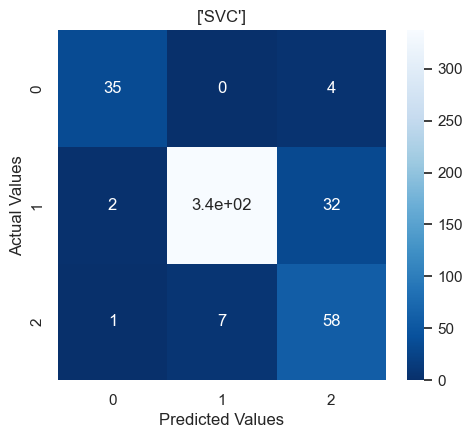

-------------------------------------

              EVALUATION MATRIX


,Model,Actual data point,Predicted data points,Manual Accuracy,Accuracy,AUC,Macro Precision,Weighted Precision,Macro Recall,Weighted Recall,f1_score
0,SVC,476,430,0.90,0.90,0.40,0.84,0.92,0.89,0.90,0.91


In [112]:
model =['SVC']
cm, evaluation_matrix = base_model_evaluation(val_y, svc_mi_base, model)

print('     CONFUSION MATRIX   ')
fig = plt.figure(figsize=(18, 10))
i = 0
i += 1
cm_plot = fig.add_subplot(2, 3, i).set_title(model)
cm_plot = sns.heatmap(cm, annot=True, cmap='Blues_r')
cm_plot.set_xlabel('Predicted Values')
cm_plot.set_ylabel('Actual Values')
plt.show()


print('-------------------------------------\n')
print('              EVALUATION MATRIX')
evaluation_matrix


Classification Report

In [113]:
print(metrics.classification_report(val_y, svc_mi_base, target_names=['High risk', 'Low risk', 'Moderate risk']))

               precision    recall  f1-score   support

    High risk       0.92      0.90      0.91        39
     Low risk       0.98      0.91      0.94       371
Moderate risk       0.62      0.88      0.73        66

     accuracy                           0.90       476
    macro avg       0.84      0.89      0.86       476
 weighted avg       0.92      0.90      0.91       476



-------->> Using __SelectFromModel selection__ <<--------

In [114]:
svc_sfm_fit = base_model(train_X_scale_sfm, train_y_samp)

In [115]:
svc_sfm_base = base_model_predict(svc_sfm_fit, val_X_scale_sfm)

     CONFUSION MATRIX   


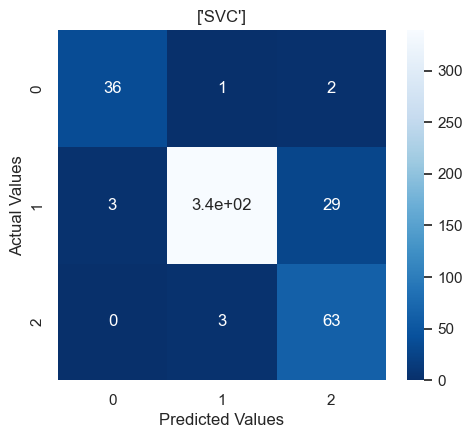

-------------------------------------

              EVALUATION MATRIX


,Model,Actual data point,Predicted data points,Manual Accuracy,Accuracy,AUC,Macro Precision,Weighted Precision,Macro Recall,Weighted Recall,f1_score
0,SVC,476,438,0.92,0.92,0.39,0.86,0.94,0.93,0.92,0.92


In [118]:
model =['SVC']
cm, evaluation_matrix = base_model_evaluation(val_y, svc_sfm_base, model)

print('     CONFUSION MATRIX   ')
fig = plt.figure(figsize=(18, 10))
i = 0
i += 1
cm_plot = fig.add_subplot(2, 3, i).set_title(model)
cm_plot = sns.heatmap(cm, annot=True, cmap='Blues_r')
cm_plot.set_xlabel('Predicted Values')
cm_plot.set_ylabel('Actual Values')
plt.show()

print('-------------------------------------\n')
print('              EVALUATION MATRIX')
evaluation_matrix


Classification Report

In [119]:
print(metrics.classification_report(val_y, svc_sfm_base, target_names=['High risk', 'Low risk', 'Moderate risk']))

               precision    recall  f1-score   support

    High risk       0.92      0.92      0.92        39
     Low risk       0.99      0.91      0.95       371
Moderate risk       0.67      0.95      0.79        66

     accuracy                           0.92       476
    macro avg       0.86      0.93      0.89       476
 weighted avg       0.94      0.92      0.92       476



<!-- Evaluation and confusion matrix -->

## Optimising by Fine-tuning the base model's hyperparameters and using pipelining method

In [107]:
# from sklearn.model_selection import GridSearchCV
# from sklearn.svm import SVC
# from sklearn.metrics import make_scorer, precision_score, recall_score

# # Define the parameter grid for grid search
# param_grid = {
#     'C': [0.1, 1, 2, 5, 10],
#     "gamma":['auto', 'scale'],
#     'kernel': ['linear', 'rbf'],
# }

# # Define the scoring metrics as precision and recall

# # Define the SVC classifier
# svc = SVC()


# # Define the scoring metrics as precision and recall
# scoring = {
#     'precision': make_scorer(precision_score, average='macro'),
#     'recall': make_scorer(recall_score, average='macro')
# }

# # Perform grid search with cross-validation
# grid_search = GridSearchCV(estimator=svc, param_grid=param_grid, scoring=scoring, refit='precision', cv=5)
# grid_search.fit(train_X_scale, train_y_samp)
# # print the best parameters found
# print("Best parameters: ", grid_search.best_params_)

# # print the best corresponding score
# print("Best score: ", grid_search.best_score_)

Best parameters:  {'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}
Best score:  0.9605732541957728


In [120]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.metrics import make_scorer, precision_score, recall_score

# Define the parameter grid for grid search
param_grid = {
    'svc_model__C': [0.1, 1, 2, 5, 10],
    'svc_model__gamma': ['auto', 'scale'],
    'svc_model__kernel': ['linear', 'rbf'],
}

# Define the scoring metrics as precision and recall
scoring = {
    'precision': make_scorer(precision_score, average='macro'),
    'recall': make_scorer(recall_score, average='macro')
}

# Define the pipeline with the SVC classifier
pipeline = Pipeline([
    ('feat_selection', SelectFromModel(DecisionTreeClassifier(max_depth=20, random_state=5, criterion='gini'))),
    ('scalar', StandardScaler()),
    ('svc_model', SVC())
])

# Create the grid search object with the pipeline
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, scoring=scoring, refit='precision', cv=5)
grid_search.fit(train_X_samp, train_y_samp)

# Print the best parameters found
print("Best parameters: ", grid_search.best_params_)

# Print the best corresponding score
print("Best score: ", grid_search.best_score_)

Best parameters:  {'svc_model__C': 10, 'svc_model__gamma': 'auto', 'svc_model__kernel': 'rbf'}
Best score:  0.9356401095924334


#### Fine-tuned pipelined base model fit and predict

In [121]:
def class_model_fit(X_train, y_train, model):
    model_name, model_estimator = model[0]
    pipe = Pipeline([('feat_selection', SelectFromModel(DecisionTreeClassifier(max_depth=20, random_state=5, criterion='gini'))),
                     ('scalar', StandardScaler()),
                     (model_name, model_estimator)])
    pipe.fit(X_train, y_train)
    
    
    return pipe

    

In [122]:
def class_model_predict(model_fit, X_val):
    y_model_predict = model_fit.predict(X_val)
    return y_model_predict
    

#### Creating an object instance of the fit  and predict function for the Base model -SVC

In [123]:
model = [('svc_model', SVC(kernel='rbf', C=10.0, gamma='auto', random_state=10))]
svc_model = class_model_fit(train_X_samp, train_y_samp, model)

In [124]:
svc_model_pred = class_model_predict(svc_model, val_X)

#### Fine-tuned pipelined base model's evaluation and confusion matrix

In [125]:
def evaluation_matrix_ft(predicted_y, val_y, model):
    accuracy = accuracy_score(val_y, predicted_y)
    counts, = np.where(predicted_y==val_y)
    manual_accuracy = len(counts) / len(val_y)
    cm = confusion_matrix(val_y, predicted_y)
    # tn, fp, fn, tp = cm[0, 0], cm[0, 1], cm[1, 0], cm[1, 1]
    recall_macro = recall_score(val_y, predicted_y, average='macro')
    recall_weighted = recall_score(val_y, predicted_y, average='weighted')
    precision_macro = precision_score(val_y, predicted_y, average='macro')
    precision_weighted = precision_score(val_y, predicted_y, average='weighted')
    f1score = f1_score(val_y, predicted_y, average='weighted')
    fpr, tpr, _thresholds = metrics.roc_curve(val_y, predicted_y, pos_label=1)
    auc = round(metrics.auc(fpr, tpr), 2)
    #cm = confusion_matrix(val_y, y_model_predict)
#     model =['SVC']
    evaluation_result_df = pd.DataFrame({'Model': model, 'Actual data point': len(val_y), 'Predicted data points': len(counts), 
                                         'Manual Accuracy': manual_accuracy, 'Accuracy': accuracy, 'AUC': auc,
                                         'Macro Precision': precision_macro, 'Weighted Precision': precision_weighted, 
                                         'Macro Recall': recall_macro, 'Weighted Recall': recall_weighted, 'f1_score': f1score})
    
    return cm, evaluation_result_df

#### Creating an object instance of the evaluation function

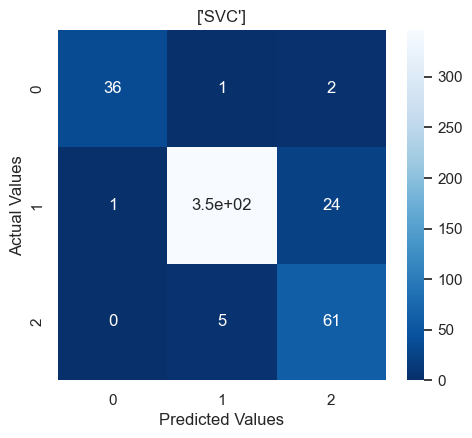

,Model,Actual data point,Predicted data points,Manual Accuracy,Accuracy,AUC,Macro Precision,Weighted Precision,Macro Recall,Weighted Recall,f1_score
0,SVC,476,443,0.93,0.93,0.39,0.89,0.94,0.93,0.93,0.93


In [126]:
model =['SVC']
cm, evaluate = evaluation_matrix_ft(svc_model_pred, val_y, model)

fig = plt.figure(figsize=(18, 10))
i = 0
i += 1
cm_plot = fig.add_subplot(2, 3, i).set_title(model)
cm_plot = sns.heatmap(cm, annot=True, cmap='Blues_r')
cm_plot.set_xlabel('Predicted Values')
cm_plot.set_ylabel('Actual Values')
plt.show()

evaluate

#### Fine-tuned pipelined base model's classification report

In [127]:
print(metrics.classification_report(val_y, svc_model_pred, target_names=['High risk', 'Low risk', 'Moderate risk']))

               precision    recall  f1-score   support

    High risk       0.97      0.92      0.95        39
     Low risk       0.98      0.93      0.96       371
Moderate risk       0.70      0.92      0.80        66

     accuracy                           0.93       476
    macro avg       0.89      0.93      0.90       476
 weighted avg       0.94      0.93      0.93       476



In [ ]:
# from sklearn.metrics import plot_precision_recall_curve, plot_roc_curve

# plot_precision_recall_curve(class_model_fit, val_X, val_y)

# plot_roc_curve(class_model_fit, val_X, val_y)





# # Import scikit-plot
# import scikitplot as skplt
# import matplotlib.pyplot as plt

# #from sklearn.metrics import plot_precision_recall_curve, plot_roc_curve

# skplt.metrics.plot_precision_recall(class_model_fit, val_X, val_y)

# skplt.metrics.plot_precision_recall(class_model_fit, val_X, val_y)

# plt.show()

In [ ]:
# import matplotlib.pyplot as plt
# from sklearn.metrics import precision_recall_curve, roc_curve, auc

# # Calculate precision, recall, and thresholds for precision-recall curve
# precision, recall, thresholds = precision_recall_curve(val_y, y_pred)

# # Calculate false positive rate, true positive rate, and thresholds for ROC curve
# fpr, tpr, thresholds_roc = roc_curve(val_y, y_pred)

# # Calculate area under the precision-recall curve (AUC-PR)
# auc_pr = auc(recall, precision)

# # Calculate area under the ROC curve (AUC-ROC)
# auc_roc = auc(fpr, tpr)

# # Plot precision-recall curve
# plt.figure()
# plt.plot(recall, precision, label='Precision-Recall curve (AUC = %0.2f)' % auc_pr)
# plt.xlabel('Recall')
# plt.ylabel('Precision')
# plt.title('Precision-Recall Curve')
# plt.legend(loc='lower left')
# plt.show()

# # Plot ROC curve
# plt.figure()
# plt.plot(fpr, tpr, label='ROC curve (AUC = %0.2f)' % auc_roc)
# plt.plot([0, 1], [0, 1], 'k--')
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('Receiver Operating Characteristic (ROC) Curve')
# plt.legend(loc='lower right')
# plt.show()

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# from sklearn.metrics import precision_recall_curve, roc_curve, auc

# num_classes = 3  # Number of classes in your multiclass problem

# # Calculate precision, recall, and thresholds for each class
# precision = dict()
# recall = dict()
# thresholds = dict()
# for class_label in range(num_classes):  # Iterate over each class label
#     precision[class_label], recall[class_label], thresholds[class_label] = precision_recall_curve(val_y == class_label, y_pred[:, class_label])

# # Calculate micro-averaged precision and recall
# precision["micro"], recall["micro"], _ = precision_recall_curve(val_y.ravel(), y_pred.ravel())

# # Calculate macro-averaged precision and recall
# precision["macro"] = np.mean(list(precision.values()), axis=0)
# recall["macro"] = np.mean(list(recall.values()), axis=0)

# # Calculate false positive rate, true positive rate, and thresholds for ROC curve
# fpr = dict()
# tpr = dict()
# thresholds_roc = dict()
# for class_label in range(num_classes):  # Iterate over each class label
#     fpr[class_label], tpr[class_label], thresholds_roc[class_label] = roc_curve(val_y == class_label, y_pred[:, class_label])

# # Calculate micro-averaged false positive rate and true positive rate
# fpr["micro"], tpr["micro"], _ = roc_curve(val_y.ravel(), y_pred.ravel())

# # Calculate macro-averaged false positive rate and true positive rate
# all_fpr = np.unique(np.concatenate(list(fpr.values())))
# mean_tpr = np.zeros_like(all_fpr)
# for class_label in range(num_classes):  # Iterate over each class label
#     mean_tpr += np.interp(all_fpr, fpr[class_label], tpr[class_label])
# mean_tpr /= num_classes
# fpr["macro"] = all_fpr
# tpr["macro"] = mean_tpr

# # Calculate area under the precision-recall curve (AUC-PR)
# auc_pr = dict()
# for class_label in range(num_classes):  # Iterate over each class label
#     auc_pr[class_label] = auc(recall[class_label], precision[class_label])

# # Calculate micro-averaged area under the precision-recall curve (AUC-PR)
# auc_pr["micro"] = auc(recall["micro"], precision["micro"])

# # Calculate macro-averaged area under the precision-recall curve (AUC-PR)
# auc_pr["macro"] = np.mean(list(auc_pr.values()))

# # Calculate area under the ROC curve (AUC-ROC)
# auc_roc = dict()
# for class_label in range(num_classes):  # Iterate over each class label
#     auc_roc[class_label] = auc(fpr[class_label], tpr[class_label])

# # Calculate micro-averaged area under the ROC curve (AUC-ROC)
# auc_roc["micro"] = auc(fpr["micro"], tpr["micro"])

# # Calculate macro-averaged area under the ROC curve (AUC-ROC)
# auc_roc["macro"] = auc(fpr["macro"], tpr["macro"])

# # Plot precision-recall curve
# plt.figure()
# plt.step(recall['micro'], precision['micro'], where='post', label='Micro-average (AUC = {0:0.2f})'.format(auc_pr['micro']))
# for class_label in range(num_classes):  # Iterate over each class label
#     plt.step(recall[class_label], precision[class_label], where='post', label='Class {0} (AUC = {1:0.2f})'.format(class_label, auc_pr[class_label]))
# plt.xlabel('Recall')
# plt.ylabel('Precision')
# plt.title('Precision-Recall Curve')
# plt.legend(loc='lower left')
# plt.show()

# # Plot ROC curve
# plt.figure()
# plt.plot(fpr['micro'], tpr['micro'], label='Micro-average (AUC = {0:0.2f})'.format(auc_roc['micro']))
# for class_label in range(num_classes):  # Iterate over each class label
#     plt.plot(fpr[class_label], tpr[class_label], label='Class {0} (AUC = {1:0.2f})'.format(class_label, auc_roc[class_label]))
# plt.plot([0, 1], [0, 1], 'k--')
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('Receiver Operating Characteristic (ROC) Curve')
# plt.legend(loc='lower right')
# plt.show()


## OTHER CLASSIFIERS

In [128]:
def class_model_fit(X_train, y_train, model):
    model_name, model_estimator = model[0]
    pipe = Pipeline([('feat_selection', SelectFromModel(DecisionTreeClassifier(max_depth=20, random_state=5, criterion='gini'))),
                     ('scalar', StandardScaler()),
                     (model_name, model_estimator)])
    pipe.fit(X_train, y_train)
    
    
    return pipe


def class_model_predict(model_fit, X_val):
    y_model_predict = model_fit.predict(X_val)
    return y_model_predict

### CLASSIFIER 2 - DECISION TREE CLASSIFIER

#### Creating an object instance of the fit and predict function for Decision Tree Classifier

In [129]:
dt_model = [('decision_tree', DecisionTreeClassifier(random_state=10))]
desiciontree_model = class_model_fit(train_X_samp, train_y_samp, dt_model)

In [130]:
desiciontree_model_pred = class_model_predict(desiciontree_model, val_X)

#### Creating an object instance of the evaluation function for Decision Tree Classifier

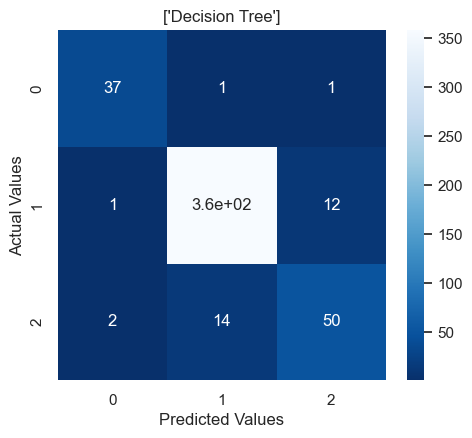

,Model,Actual data point,Predicted data points,Manual Accuracy,Accuracy,AUC,Macro Precision,Weighted Precision,Macro Recall,Weighted Recall,f1_score
0,Decision Tree,476,445,0.93,0.93,0.45,0.89,0.93,0.89,0.93,0.93


In [131]:
dt_model = ['Decision Tree']
cm, evaluate = evaluation_matrix_ft(desiciontree_model_pred, val_y, dt_model)

fig = plt.figure(figsize=(18, 10))
i = 0
i += 1
cm_plot = fig.add_subplot(2, 3, i).set_title(dt_model)
cm_plot = sns.heatmap(cm, annot=True, cmap='Blues_r')
cm_plot.set_xlabel('Predicted Values')
cm_plot.set_ylabel('Actual Values')
plt.show()

evaluate

### CLASSIFIER 3 - LOGISTIC REGRESSION CLASSIFIER

#### Creating an object instance of the fit and predict function for Logistic Regression Classifier

In [132]:
lg_model = [('logistic_regression', LogisticRegression(solver='lbfgs', random_state=10))]
logisticreg_model = class_model_fit(train_X_samp, train_y_samp, lg_model)

In [133]:
logisticreg_model_pred = class_model_predict(logisticreg_model, val_X)

#### Creating an object instance of the evaluation function for Logistic Regression Classifier

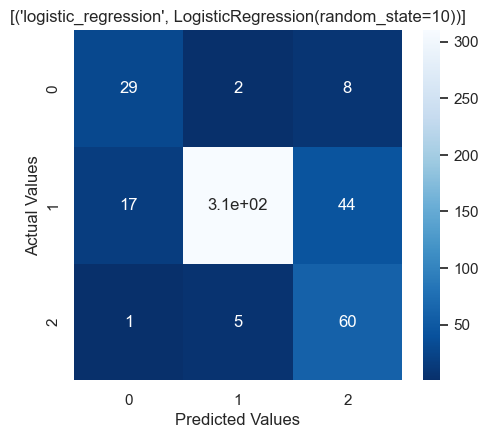

,Model,Actual data point,Predicted data points,Manual Accuracy,Accuracy,AUC,Macro Precision,Weighted Precision,Macro Recall,Weighted Recall,f1_score
0,"(logistic_regression, LogisticRegression(rando...",476,399,0.84,0.84,0.35,0.71,0.89,0.83,0.84,0.85


In [134]:
dt_model = ['Logistic Regression']
cm, evaluate = evaluation_matrix_ft(logisticreg_model_pred, val_y, lg_model)

fig = plt.figure(figsize=(18, 10))
i = 0
i += 1
cm_plot = fig.add_subplot(2, 3, i).set_title(lg_model)
cm_plot = sns.heatmap(cm, annot=True, cmap='Blues_r')
cm_plot.set_xlabel('Predicted Values')
cm_plot.set_ylabel('Actual Values')
plt.show()

evaluate

### CLASSIFIER 4 - RANDOM FOREST CLASSIFIER

#### Creating an object instance of the fit and predict function for Random Forest Classifier

In [135]:
rf_model = [('random_forest', RandomForestClassifier(random_state=10))]
randomforest_model = class_model_fit(train_X_samp, train_y_samp, rf_model)

In [136]:
randomforest_model_pred = class_model_predict(randomforest_model, val_X)

#### Creating an object instance of the evaluation function for Random Forest Classifier

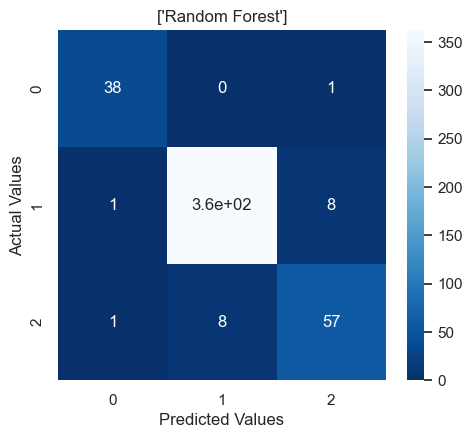

,Model,Actual data point,Predicted data points,Manual Accuracy,Accuracy,AUC,Macro Precision,Weighted Precision,Macro Recall,Weighted Recall,f1_score
0,Random Forest,476,457,0.96,0.96,0.42,0.93,0.96,0.94,0.96,0.96


In [137]:
rf_model = ['Random Forest']
cm, evaluate = evaluation_matrix_ft(randomforest_model_pred, val_y, rf_model)

fig = plt.figure(figsize=(18, 10))
i = 0
i += 1
cm_plot = fig.add_subplot(2, 3, i).set_title(rf_model)
cm_plot = sns.heatmap(cm, annot=True, cmap='Blues_r')
cm_plot.set_xlabel('Predicted Values')
cm_plot.set_ylabel('Actual Values')
plt.show()

evaluate

### CLASSIFIER 5 - GAUSSIAN NAIVE BAYES CLASSIFIER

#### Creating an object instance of the fit and predict function for Gaussian Naive Bayes Classifier

In [138]:
gb_model = [('random_forest', GaussianNB())]
gaussian_model = class_model_fit(train_X_samp, train_y_samp, gb_model)

In [139]:
gaussian_model_pred = class_model_predict(gaussian_model, val_X)

#### Creating an object instance of the evaluation function for Gaussian Naive Bayes Classifier

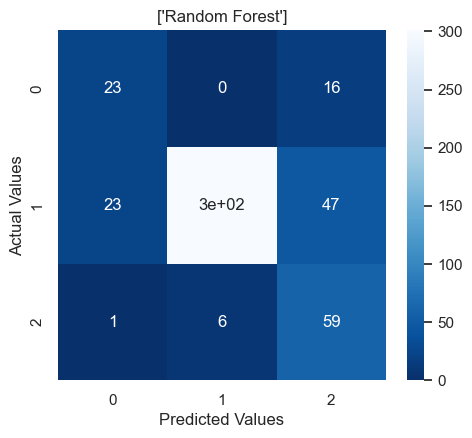

,Model,Actual data point,Predicted data points,Manual Accuracy,Accuracy,AUC,Macro Precision,Weighted Precision,Macro Recall,Weighted Recall,f1_score
0,Random Forest,476,383,0.80,0.80,0.30,0.65,0.87,0.77,0.80,0.82


In [140]:
gb_model = ['Random Forest']
cm, evaluate = evaluation_matrix_ft(gaussian_model_pred, val_y, gb_model)

fig = plt.figure(figsize=(18, 10))
i = 0
i += 1
cm_plot = fig.add_subplot(2, 3, i).set_title(gb_model)
cm_plot = sns.heatmap(cm, annot=True, cmap='Blues_r')
cm_plot.set_xlabel('Predicted Values')
cm_plot.set_ylabel('Actual Values')
plt.show()

evaluate

## Comparing the finetuned base model with other Classification Models to train and predict the health dataset 

Knowing fully well that there is no one best algorithm. After using svc classifier, now comparing the algorithm with other common classification algorithm to see the rank of how each performed better in the prediction of the health risk classification problem using the health train and validation dataset. Then, I will fine-tune and choose that algorithm to prediict the test dataset

## Training the models on the health train dataset

In [141]:

models = [('svc_model', SVC(kernel='rbf', C=10.0, gamma='auto', random_state=10)), 
          ('decision_tree', DecisionTreeClassifier(random_state=10)), 
          ('random_forest', RandomForestClassifier(random_state=10)),
          ('logistic_regression', LogisticRegression(solver='lbfgs', random_state=10)),
          ('gaussian', GaussianNB())
         ]
modellist = []
for model_name, model_obj in models:
    pipe = Pipeline([('feat_selection', SelectFromModel(DecisionTreeClassifier(max_depth=20, random_state=5, criterion='gini'))),
                     ('scalar', StandardScaler()),
                     (model_name, model_obj)
                     ])
    model_fit = pipe.fit(train_X_samp, train_y_samp)
    modellist.append(model_fit)


### Predicting the validation health dataset and 
### evaluating the result of the predicted validation target label using the trained classification models

In [150]:
model_list = ['svc', 'decision_tree',  'random_forest','logistic_regression', 'gaussian']
acc_list = []
count_list = []
auc_list =[]
roc_auc_list = []
cm_list =[]
macro_prec_list = []
weighted_prec_list = []
macro_rec_list = []
weighted_rec_list = []
f1score_list =[]
for each_model in modellist:
#        each_model.fit(train_X_samp, train_y_samp)
    y_pred = each_model.predict(val_X)
#     y_proba = each_model.predict_proba(val_X)
    acc_list.append(metrics.accuracy_score(val_y, y_pred))
    count_list.append(len(np.where(y_pred == val_y)[0]))
    fpr, tpr, _thresholds = metrics.roc_curve(val_y, y_pred, pos_label=1)
    auc_list.append(round(metrics.auc(fpr, tpr), 2))
    cm_list.append(confusion_matrix(val_y, y_pred))
    f1score_list.append(f1_score(val_y, y_pred, average='weighted'))
    weighted_rec_list.append(recall_score(val_y, y_pred, average='weighted'))
    macro_rec_list.append(recall_score(val_y, y_pred, average='macro'))
    weighted_prec_list.append(precision_score(val_y, y_pred, average='weighted'))
    macro_prec_list.append(recall_score(val_y, y_pred, average='macro'))

In [123]:
# # ROC curve and AUC 
# probs = logistic_clf.predict_proba(X_test)
# # keep probabilities for the positive outcome only
# probs = probs[:, 1]
# # calculate AUC
# log_auc = roc_auc_score(y_test, probs)

# # calculate roc curve
# fpr, tpr, thresholds = roc_curve(y_test, probs)
# # plot curve
# sns.set_style('whitegrid')
# plt.figure(figsize=(10,6))
# plt.plot([0, 1], [0, 1], linestyle='--')
# plt.plot(fpr, tpr, marker='.')
# plt.ylabel('True positive rate')
# plt.xlabel('False positive rate')
# plt.title(f"AUC = {round(log_auc,3)}")
# plt.show()

In [ ]:
### Evaluation and Confusion Matrix

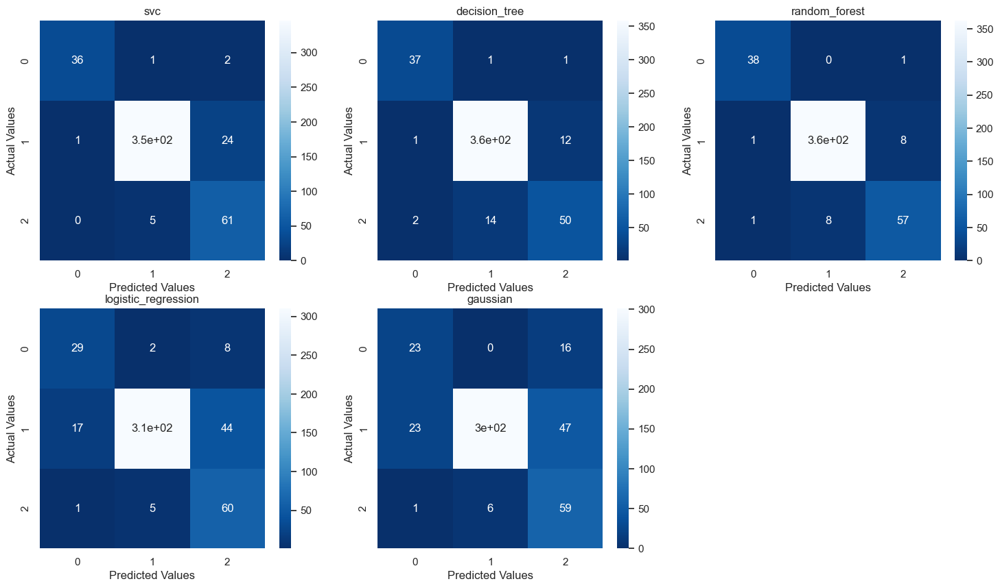

In [151]:
fig =plt.figure(figsize =(18,10))
for i in range(len(cm_list)):
    cm =cm_list[i]
    model = model_list[i]
    sub = fig.add_subplot(2, 3, i+1).set_title(model)
    cm_plot =sns.heatmap(cm, annot=True, cmap= 'Blues_r')
    cm_plot.set_xlabel('Predicted Values')
    cm_plot.set_ylabel('Actual Values')

In [ ]:
### Comparing the evaluation of each models performance 

In [152]:
result_df = pd.DataFrame({'Model': model_list, 'Actual data point': len(val_y), 'Predicted data points': count_list,
                          'Accuracy': acc_list, 'AUC': auc_list, 
                          'Macro Precision': macro_prec_list, 'Weighted Precision': weighted_prec_list,
                          'Macro Recall': macro_rec_list, 'Weighted Recall': weighted_rec_list,
                          'f1_score': f1score_list})
result_df

,Model,Actual data point,Predicted data points,Accuracy,AUC,Macro Precision,Weighted Precision,Macro Recall,Weighted Recall,f1_score
0,svc,476,443,0.93,0.39,0.93,0.94,0.93,0.93,0.93
1,decision_tree,476,445,0.93,0.45,0.89,0.93,0.89,0.93,0.93
2,random_forest,476,457,0.96,0.42,0.94,0.96,0.94,0.96,0.96
3,logistic_regression,476,399,0.84,0.35,0.83,0.89,0.83,0.84,0.85
4,gaussian,476,383,0.80,0.30,0.77,0.87,0.77,0.80,0.82


In [ ]:
## Comparing each Classification Models based on the effectiveness in terms of Precision, Recall and F1-Score 
### to evaluate the best performing and effective model.

In [153]:
model_comparison = pd.DataFrame({
    "SVC": {'Precision': weighted_prec_list[0], 'Recall': weighted_rec_list[0], 'F1 score': f1score_list[0]},
    "Decision trees": {'Precision': weighted_prec_list[1], 'Recall': weighted_rec_list[1], 'F1 score': f1score_list[1]},
    "Random forest": {'Precision': weighted_prec_list[2], 'Recall': weighted_rec_list[2], 'F1 score': f1score_list[2]},
    "Logistic Regression": {'Precision': weighted_prec_list[3], 'Recall': weighted_rec_list[3], 'F1 score': f1score_list[3]},
    "Gaussian": {'Precision': weighted_prec_list[4], 'Recall': weighted_rec_list[4], 'F1 score': f1score_list[4]}
}).T



In [154]:
model_comparison

,Precision,Recall,F1 score
SVC,0.94,0.93,0.93
Decision trees,0.93,0.93,0.93
Random forest,0.96,0.96,0.96
Logistic Regression,0.89,0.84,0.85
Gaussian,0.87,0.80,0.82


In [ ]:
### Visual analysis of each of the classification models

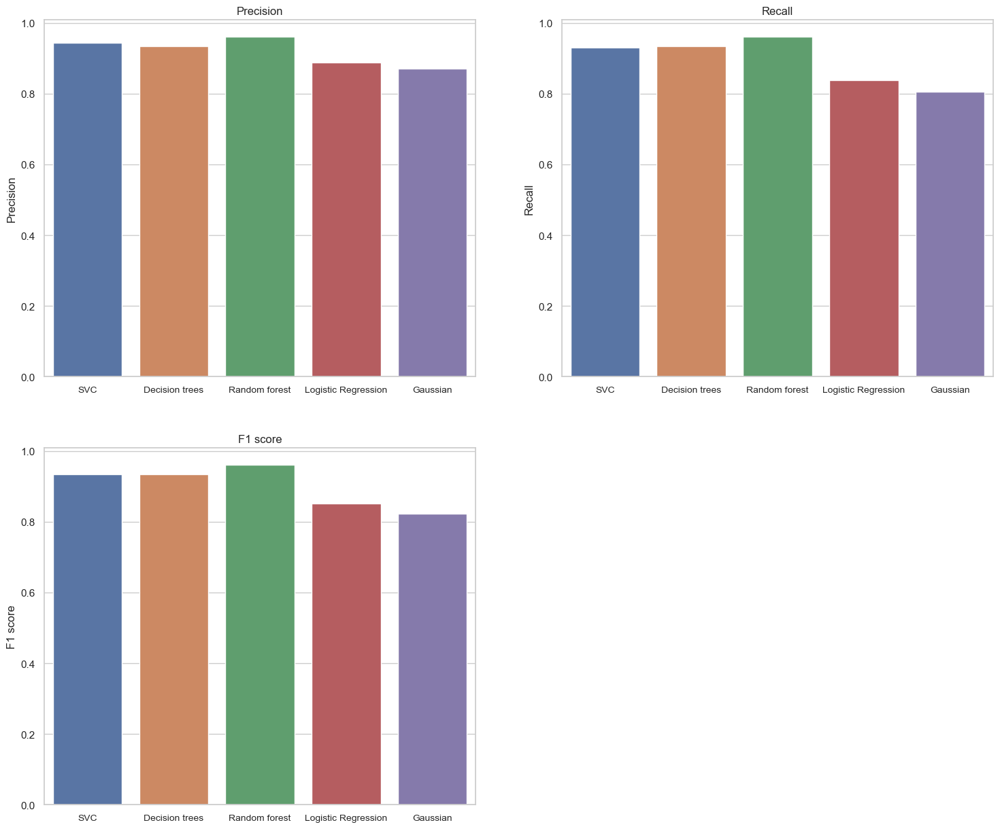

In [155]:
fig = plt.gcf()
fig.set_size_inches(18,15)
titles = ['Precision', 'Recall', 'F1 score']
for title, label in enumerate(model_comparison.columns):
    plt.subplot(2,2,title+1)
    sns.barplot(x=model_comparison.index, y=model_comparison[label], data=model_comparison)
    plt.xticks(fontsize=10)
    plt.title(titles[title])
plt.show()

In [149]:
from sklearn.metrics import plot_precision_recall_curve, plot_roc_curve

plot_precision_recall_curve(pipe, val_X, val_y)

plot_roc_curve(pipe, X_test, y_test)

In [ ]:
# ROC curve and AUC 
probs = logistic_clf.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
log_auc = roc_auc_score(y_test, probs)

# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test, probs)
# plot curve
sns.set_style('whitegrid')
plt.figure(figsize=(10,6))
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr, tpr, marker='.')
plt.ylabel('True positive rate')
plt.xlabel('False positive rate')
plt.title(f"AUC = {round(log_auc,3)}")
plt.show()

## OPTIMISING THE BEST CLASSIFIER MODEL- RANDOM FOREST

In [364]:
# from sklearn.model_selection import GridSearchCV
# from sklearn.pipeline import Pipeline
# from sklearn.metrics import make_scorer, precision_score, recall_score

# # Define the parameter grid for grid search
# param_grid = {'random_forest_model__n_estimators': [50, 90, 99, 100, 101, 110, 200],
#               'random_forest_model__criterion': ['gini', 'entropy', 'log_loss'],
#               'random_forest_model__max_features': ['sqrt', 'log2'],
#              "random_forest_model__max_depth": [ 1, 2, 3,4,5,6,7,8,9,10] }


# # Define the scoring metrics as precision and recall
# scoring = {
#     'precision': make_scorer(precision_score, average='macro'),
#     'recall': make_scorer(recall_score, average='macro')
# }

# # Define the pipeline with the SVC classifier
# pipeline = Pipeline([
#     ('feat_selection', SelectFromModel(DecisionTreeClassifier(max_depth=20, random_state=10, criterion='gini'))),
#     ('scalar', StandardScaler()),
#     ('random_forest_model', RandomForestClassifier(random_state=10))
# ])

# # Create the grid search object with the pipeline
# grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, scoring=scoring, refit='precision', cv=5)
# grid_search.fit(train_X_samp, train_y_samp)

# # Print the best parameters found
# print("Best parameters: ", grid_search.best_params_)

# # Print the best corresponding score
# print("Best score: ", grid_search.best_score_)

Best parameters:  {'random_forest_model__criterion': 'entropy', 'random_forest_model__max_depth': 10, 'random_forest_model__max_features': 'sqrt', 'random_forest_model__n_estimators': 99}
Best score:  0.9868701909283952


In [122]:
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import make_scorer, precision_score, recall_score

# Define the parameter grid for grid search
param_grid = {'random_forest_model__n_estimators': [50, 90, 99, 100, 101, 110, 200],
              'random_forest_model__criterion': ['gini', 'entropy', 'log_loss'],
              'random_forest_model__max_features': ['sqrt', 'log2'],
             "random_forest_model__max_depth": [ 1, 2, 3,4,5,6,7,8,9,10] }


# Define the scoring metrics as precision and recall
scoring = {
    'precision': make_scorer(precision_score, average='macro'),
    'recall': make_scorer(recall_score, average='macro')
}

# Define the pipeline with the SVC classifier
pipeline = Pipeline([
    ('feat_selection', SelectFromModel(DecisionTreeClassifier(max_depth=20, random_state=10, criterion='gini'))),
    ('scalar', StandardScaler()),
    ('random_forest_model', RandomForestClassifier(random_state=10))
])

# Create the grid search object with the pipeline
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, scoring=scoring, refit='precision', cv=5)
grid_search.fit(train_X_samp, train_y_samp)

# Print the best parameters found
print("Best parameters: ", grid_search.best_params_)

# Print the best corresponding score
print("Best score: ", grid_search.best_score_)

Best parameters:  {'random_forest_model__criterion': 'entropy', 'random_forest_model__max_depth': 10, 'random_forest_model__max_features': 'sqrt', 'random_forest_model__n_estimators': 99}
Best score:  0.9868701909283952


In [156]:
# model = [('random_forest_model', RandomForestClassifier(criterion='entropy', max_depth=None, max_features='sqrt', n_estimators=100))]

model = [('random_forest_model', RandomForestClassifier(criterion='entropy', max_depth=10, max_features='sqrt', n_estimators=99, random_state=10))]
rf_model_fit = class_model_fit(train_X_samp, train_y_samp, model)

In [157]:
rf_model = class_model_predict(rf_model_fit, val_X)

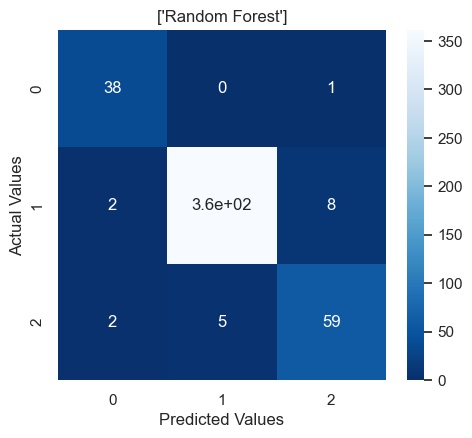

,Model,Actual data point,Predicted data points,Manual Accuracy,Accuracy,AUC,Macro Precision,Weighted Precision,Macro Recall,Weighted Recall,f1_score
0,Random Forest,476,458,0.96,0.96,0.41,0.92,0.96,0.95,0.96,0.96


In [158]:
model =['Random Forest']
cm, evaluate = evaluation_matrix_ft(rf_model, val_y, model)

fig = plt.figure(figsize=(18, 10))
i = 0
i += 1
cm_plot = fig.add_subplot(2, 3, i).set_title(model)
cm_plot = sns.heatmap(cm, annot=True, cmap='Blues_r')
cm_plot.set_xlabel('Predicted Values')
cm_plot.set_ylabel('Actual Values')
plt.show()

evaluate

In [159]:
print(metrics.classification_report(val_y, rf_model, target_names=['High risk', 'Low risk', 'Moderate risk']))

               precision    recall  f1-score   support

    High risk       0.90      0.97      0.94        39
     Low risk       0.99      0.97      0.98       371
Moderate risk       0.87      0.89      0.88        66

     accuracy                           0.96       476
    macro avg       0.92      0.95      0.93       476
 weighted avg       0.96      0.96      0.96       476



# PREDICTION FOR TEST DATA 

In [160]:
health_test_data

,id,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24
0,PA3001,767,135,F,0.00,0.00,0.00,0.00,0.00,0.00,...,76,67,143,2,0,137,136,138,0,1
1,PA3002,1592,134,F,0.00,0.00,0.01,0.00,0.00,0.00,...,74,89,163,7,1,138,134,138,13,0
2,PA3003,1115,122,M,0.00,0.00,0.00,0.00,0.00,0.00,...,39,103,142,1,0,120,120,122,3,0
3,PA3004,299,148,F,0.00,NaN,0.00,0.00,0.00,0.00,...,14,139,153,1,0,150,148,150,0,1
4,PA3005,1194,133,M,0.00,0.00,0.01,0.00,0.00,0.00,...,58,113,171,5,1,150,147,149,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
523,PA3524,1071,133,M,0.00,0.00,0.01,0.00,0.00,0.00,...,95,82,177,4,0,147,133,138,43,0
524,PA3525,364,135,F,0.00,0.02,0.00,0.00,0.00,0.00,...,9,132,141,1,0,136,136,137,0,0
525,PA3526,531,142,F,0.02,0.06,0.00,0.00,0.00,0.00,...,130,68,198,5,0,180,173,177,14,1
526,PA3527,878,136,F,0.00,0.00,0.01,0.00,0.00,0.00,...,47,107,154,1,0,138,139,139,2,0


In [161]:
health_test_data.drop(['id'], inplace=True, axis=1)
health_test_data

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,...,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24
0,767,135,F,0.00,0.00,0.00,0.00,0.00,0.00,67.00,...,76,67,143,2,0,137,136,138,0,1
1,1592,134,F,0.00,0.00,0.01,0.00,0.00,0.00,27.00,...,74,89,163,7,1,138,134,138,13,0
2,1115,122,M,0.00,0.00,0.00,0.00,0.00,0.00,19.00,...,39,103,142,1,0,120,120,122,3,0
3,299,148,F,0.00,NaN,0.00,0.00,0.00,0.00,72.00,...,14,139,153,1,0,150,148,150,0,1
4,1194,133,M,0.00,0.00,0.01,0.00,0.00,0.00,38.00,...,58,113,171,5,1,150,147,149,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
523,1071,133,M,0.00,0.00,0.01,0.00,0.00,0.00,27.00,...,95,82,177,4,0,147,133,138,43,0
524,364,135,F,0.00,0.02,0.00,0.00,0.00,0.00,70.00,...,9,132,141,1,0,136,136,137,0,0
525,531,142,F,0.02,0.06,0.00,0.00,0.00,0.00,38.00,...,130,68,198,5,0,180,173,177,14,1
526,878,136,F,0.00,0.00,0.01,0.00,0.00,0.00,39.00,...,47,107,154,1,0,138,139,139,2,0


# Imputation of missing values in the health test data set

In [162]:
#Define the data to be filled as X, we can pass the whole data frame and apply our new class
test_data_col = health_test_data
health_test_data = MissingDataImputer().fit_transform(test_data_col)

print('Test data before imputation...')
#viewing the missing value for the test data before imputation
count_missing_val_before_by_column = (test_data_col.isnull().sum())
print('Missing columns for the Test data:\n',count_missing_val_before_by_column[count_missing_val_before_by_column>0])

#and viewing the missing value for the test data after imputation
print('Test data after imputation...')
count_missing_val_after_by_column = (health_test_data.isnull().sum())
print('Missing columns for the Test data:\n',count_missing_val_after_by_column[count_missing_val_after_by_column>0])
 


Test data before imputation...
Missing columns for the Test data:
 x5     13
x8      6
x10    11
dtype: int64
Test data after imputation...
Missing columns for the Test data:
 Series([], dtype: int64)


# categorical feature encoding of the test data

In [163]:
# Calling the function on the categorical columns of the test dataset
cat_columns_to_encode = ['x3', 'x14']  # List of column names to encode
X_test = one_hot_encode_columns(health_test_data, cat_columns_to_encode, drop_original_cat_col=True)
print(X_test)

       x1   x2   x4   x5   x6   x7   x8   x9   x10  x11  ...  x3_F  x3_M  \
0     767  135 0.00 0.00 0.00 0.00 0.00 0.00 67.00 0.40  ...  1.00  0.00   
1    1592  134 0.00 0.00 0.01 0.00 0.00 0.00 27.00 2.80  ...  1.00  0.00   
2    1115  122 0.00 0.00 0.00 0.00 0.00 0.00 19.00 1.90  ...  0.00  1.00   
3     299  148 0.00 0.01 0.00 0.00 0.00 0.00 72.00 0.30  ...  1.00  0.00   
4    1194  133 0.00 0.00 0.01 0.00 0.00 0.00 38.00 1.10  ...  0.00  1.00   
..    ...  ...  ...  ...  ...  ...  ...  ...   ...  ...  ...   ...   ...   
523  1071  133 0.00 0.00 0.01 0.00 0.00 0.00 27.00 1.70  ...  0.00  1.00   
524   364  135 0.00 0.02 0.00 0.00 0.00 0.00 70.00 0.30  ...  1.00  0.00   
525   531  142 0.02 0.06 0.00 0.00 0.00 0.00 38.00 1.30  ...  1.00  0.00   
526   878  136 0.00 0.00 0.01 0.00 0.00 0.00 39.00 0.90  ...  1.00  0.00   
527  1733  134 0.01 0.01 0.01 0.00 0.00 0.00 60.00 1.20  ...  1.00  0.00   

     x14_A+  x14_A-  x14_AB+  x14_AB-  x14_B+  x14_B-  x14_O+  x14_O-  
0      0.00    

In [164]:
rf_model_predict_test = class_model_predict(rf_model_fit, X_test)

In [165]:
rf_model_predict_test

array([2, 1, 1, 2, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 2, 1,
       1, 1, 1, 2, 1, 0, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       2, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1,
       1, 1, 2, 1, 1, 2, 1, 2, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1,
       1, 2, 1, 2, 0, 1, 2, 1, 1, 1, 0, 2, 2, 2, 1, 1, 1, 2, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1,
       0, 2, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1,
       0, 2, 1, 1, 1, 1, 1, 1, 1, 0, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       2, 1, 0, 1, 1, 2, 1, 1, 1, 1, 0, 1, 2, 1, 1, 0, 1, 1, 1, 2, 1, 1,
       2, 2, 1, 1, 1, 1, 2, 2, 1, 0, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       2, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       2, 1, 1, 0, 1, 1, 1, 1, 2, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 2,
       1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 2, 2, 1, 1, 1, 1, 2, 1, 1,
       1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 0, 1, 2, 0, 1,

In [166]:
# reverse the encoding process
predicted_y_reverse = le.inverse_transform(rf_model_predict_test)
# print the original and decoded target labels to check if they match
print("Original target labels:", rf_model_predict_test)
print("Decoded target labels:", predicted_y_reverse)

Original target labels: [2 1 1 2 1 1 1 1 0 1 1 1 1 1 1 2 1 2 1 1 2 1 1 1 1 2 1 0 1 1 1 2 1 1 1 1 1
 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 0 1 1 1 2 1 1 1 1 1 1 2 1 1 1 2 1 1 2 1 2
 1 1 1 0 1 1 1 1 1 1 2 1 1 1 1 2 1 2 0 1 2 1 1 1 0 2 2 2 1 1 1 2 1 1 1 1 1
 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 1 1 0 1 1 0 2 1 0 1 1 1 1 1 1 1 1 2 1 1 1
 1 1 2 1 1 1 0 2 1 1 1 1 1 1 1 0 2 2 1 1 1 1 1 1 1 1 0 1 2 1 0 1 1 2 1 1 1
 1 0 1 2 1 1 0 1 1 1 2 1 1 2 2 1 1 1 1 2 2 1 0 2 1 1 1 1 1 1 1 1 1 1 1 2 1
 1 1 1 1 1 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 0 1 1 1 1 2 1 1 1 1 0 1 1 1
 1 1 1 1 2 1 1 1 1 1 1 1 1 2 1 2 1 1 2 2 1 1 1 1 2 1 1 1 1 1 1 2 2 2 2 1 1
 0 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 2 2 1 1 2 1 1 1 1 1 1 1 1 1 1 2 1 2 1 0 1 1 1 1 0 1 1 1 1 1 0 1 1 1
 1 1 1 1 1 2 1 1 2 0 1 1 1 2 1 1 1 1 0 1 1 2 1 1 1 1 1 1 1 1 1 1 2 1 0 1 1
 1 0 1 1 1 1 1 1 1 1 2 1 2 1 1 1 1 1 2 1 1 1 1 1 1 1 2 1 1 1 1 2 0 1 1 1 1
 0 1 1 1 1 1 1 1 1 1 1 2 2 2 1 2 1 1 1 1 1 1 1 1 2 1 0 0 1 0 2 1 1 1 1 1 1
 

In [167]:
# Initializing an empty dictionary to store the counts of each classes of the predicted target label
encoded_label_counts = {}

# Count the occurrences of each health risk class label
for label in rf_model_predict_test:
    if label in encoded_label_counts:
        encoded_label_counts[label] += 1
    else:
        encoded_label_counts[label] = 1

# the total count output for each health risk class label
for health_risk_label, count in encoded_label_counts.items():
    print(f"{health_risk_label}: {count}")

2: 79
1: 408
0: 41


In [169]:
# Convert the encoded risk counts dictionary into a DataFrame
encoded_predicted_df = pd.DataFrame(list(encoded_label_counts.items()), columns=['Risk Label', 'Count'])

# Print the DataFrame
print(encoded_predicted_df)

   Risk Label  Count
0           2     79
1           1    408
2           0     41


In [170]:
# Initializing an empty dictionary to store the counts of each classes of the predicted target label
class_label_counts = {}

# Count the occurrences of each health risk class label
for label in predicted_y_reverse:
    if label in class_label_counts:
        class_label_counts[label] += 1
    else:
        class_label_counts[label] = 1

# the total count output for each health risk class label
for health_risk_label, count in class_label_counts.items():
    print(f"{health_risk_label}: {count}")

Moderate risk: 79
Low risk: 408
High risk: 41


In [173]:
predicted_test_df = pd.DataFrame(predicted_y_reverse)
predicted_test_df

,0
0,Moderate risk
1,Low risk
2,Low risk
3,Moderate risk
4,Low risk
...,...
523,Low risk
524,High risk
525,Low risk
526,Low risk


In [175]:
# Convert the risk counts dictionary into a DataFrame
predicted_count_df = pd.DataFrame.from_dict(class_label_counts, orient='index', columns=['Total Count'])

# Print the DataFrame
print(predicted_count_df)

               Total Count
Moderate risk           79
Low risk               408
High risk               41


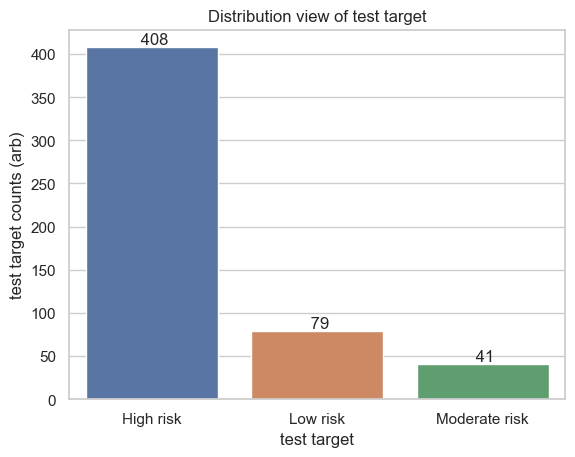

In [178]:
view_data_balance(predicted_test_df, 'test target' )

In [155]:
# Load the predicted target CSV file into a DataFrame
predicted_target_csv = pd.read_csv('predictedTarget.csv')

# updating the second column of the predicted target DataFrame with the newly predicted values
predicted_target_csv.iloc[:, 1] = predicted_test_df.values

# Saving the DataFrame and update the predictedTarget CSV file
predicted_target_csv.to_csv('predictedTarget.csv', index=False)

# 4.0 UNSUPERVISED CLUSTERING

In [179]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_rows', 15)
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

In [147]:
## Loading and Exploring the dataframe

In [180]:
# Load the dataset
#designate the path where health_train data is saved
health_train_data_path = "health_train.csv"
health_test_data_path = "health_test.csv"

#Load and read the train data using pandas read_csv function.
health_train_data = pd.read_csv(health_train_data_path)

#Load and read the train data using pandas read_csv function.
health_test_data = pd.read_csv(health_test_data_path)

### Scanning the data in the dataframe

- view few section of the data to ensure it loaded correctly, using the following functions
    - `describe()`, 
    - `head()`, 
    - `tail()` .

In [181]:
#Calling the variable that holds the dataframe of the patients health recored
#To show the first few records to check data is loading correctly and have a view of what it looks like
health_train_data.head()


,id,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x16,x17,x18,x19,x20,x21,x22,x23,x24,target
0,PA1001,1406,145.00,F,0.01,0.00,0.00,0.00,0.00,0.00,...,104.00,171.00,4.00,0.00,155.00,153.00,154.00,4.00,1.00,Low risk
1,PA1002,258,127.00,M,0.01,0.00,0.01,0.00,0.00,0.00,...,53.00,191.00,12.00,1.00,133.00,126.00,131.00,41.00,0.00,Low risk
2,PA1003,479,145.00,F,0.00,0.00,0.00,0.00,0.00,0.00,...,111.00,157.00,1.00,1.00,150.00,146.00,149.00,6.00,1.00,Low risk
3,PA1004,906,146.00,F,0.00,0.00,0.01,0.00,0.00,0.00,...,107.00,169.00,2.00,2.00,150.00,147.00,149.00,7.00,0.00,Low risk
4,PA1005,1921,140.00,F,0.00,0.00,0.01,0.01,0.00,0.00,...,75.00,228.00,9.00,0.00,142.00,118.00,142.00,20.00,0.00,Low risk


In [182]:
#Calling the variable that holds the dataframe of the patients health recored
#To show the last few records to check data is loading correctly and have a view of what it looks like
health_train_data.tail() 

,id,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x16,x17,x18,x19,x20,x21,x22,x23,x24,target
1579,PA2580,2077,130.00,M,0.01,0.00,0.00,0.00,0.00,0.00,...,127.00,158.00,2.00,0.00,139.00,139.00,140.00,3.00,0.00,Low risk
1580,PA2581,664,138.00,F,0.00,0.00,0.00,0.00,0.00,0.00,...,69.00,187.00,10.00,1.00,142.00,130.00,140.00,61.00,0.00,Moderate risk
1581,PA2582,1431,144.00,F,0.00,0.00,0.01,0.00,0.00,0.00,...,139.00,169.00,2.00,0.00,157.00,155.00,157.00,2.00,0.00,Moderate risk
1582,PA2583,630,134.00,F,0.02,0.00,0.00,0.00,0.00,0.00,...,50.00,170.00,5.00,0.00,160.00,150.00,155.00,28.00,1.00,Low risk
1583,PA2584,436,151.00,F,0.00,0.00,0.01,0.01,0.00,0.00,...,50.00,200.00,11.00,2.00,156.00,150.00,156.00,38.00,1.00,Moderate risk


In [183]:
#Calling the variable that holds the dataframe of the patients health recored
#To describe the necessary aggregate values of the loaded data and have a view of what it looks like
health_train_data.describe()

,x1,x2,x4,x5,x6,x7,x8,x9,x10,x11,...,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24
count,1584.00,1584.00,1584.00,1540.00,1584.00,1584.00,1567.00,1584.00,1557.00,1584.00,...,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00,1584.00
mean,1053.19,133.30,0.00,0.01,0.00,0.00,0.00,0.00,47.09,1.34,...,70.41,93.50,163.91,4.06,0.32,137.33,134.54,137.94,18.45,0.31
std,616.00,10.00,0.00,0.05,0.00,0.00,0.00,0.00,17.27,0.90,...,38.99,29.59,17.91,2.95,0.72,16.46,15.73,14.62,28.38,0.62
min,0.00,106.00,0.00,0.00,0.00,0.00,0.00,0.00,13.00,0.20,...,3.00,50.00,122.00,0.00,0.00,60.00,73.00,77.00,0.00,-1.00
25%,523.75,126.00,0.00,0.00,0.00,0.00,0.00,0.00,32.00,0.70,...,36.00,67.00,152.00,2.00,0.00,128.00,125.00,128.00,2.00,0.00
50%,1049.50,133.00,0.00,0.00,0.00,0.00,0.00,0.00,49.00,1.20,...,68.00,93.00,162.00,3.00,0.00,139.00,136.00,139.00,7.00,0.00
75%,1583.25,141.00,0.01,0.00,0.01,0.00,0.00,0.00,61.00,1.70,...,100.00,120.00,174.00,6.00,0.00,148.00,145.25,148.00,23.00,1.00
max,2125.00,160.00,0.02,0.48,0.01,0.01,0.00,0.01,86.00,7.00,...,176.00,158.00,238.00,18.00,10.00,187.00,182.00,186.00,269.00,1.00


In [184]:
#access the dimensions of the dataframe
print("_____________________________\n The total number of all the patients health recorded and columns of the data is: \n", health_train_data.shape, "records and columns \n")
#display each arrtributes' total
print("_____________________________\n Total record of all patients data in each column data \n",health_train_data.count(), "\n________________________")
#display the datatype of the each column attribute
print("\n __________________________ \n Observations of the loaded data \n", health_train_data.info())

_____________________________
 The total number of all the patients health recorded and columns of the data is: 
 (1584, 26) records and columns 

_____________________________
 Total record of all patients data in each column data 
 id        1584
x1        1584
x2        1584
x3        1584
x4        1584
          ... 
x21       1584
x22       1584
x23       1584
x24       1584
target    1584
Length: 26, dtype: int64 
________________________
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1584 entries, 0 to 1583
Data columns (total 26 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   id      1584 non-null   object 
 1   x1      1584 non-null   int64  
 2   x2      1584 non-null   float64
 3   x3      1584 non-null   object 
 4   x4      1584 non-null   float64
 5   x5      1540 non-null   float64
 6   x6      1584 non-null   float64
 7   x7      1584 non-null   float64
 8   x8      1567 non-null   float64
 9   x9      1584 non-null   float64

## 4.2 CLEANING AND PREPROCESSING THE DATA

In [233]:
# Removing unwanted column - id column

In [185]:
#taking off the id data variable
health_train_data = health_train_data.drop(['id', 'target'], axis=1)
health_train_data.head()

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,...,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24
0,1406,145.00,F,0.01,0.00,0.00,0.00,0.00,0.00,46.00,...,67.00,104.00,171.00,4.00,0.00,155.00,153.00,154.00,4.00,1.00
1,258,127.00,M,0.01,0.00,0.01,0.00,0.00,0.00,13.00,...,138.00,53.00,191.00,12.00,1.00,133.00,126.00,131.00,41.00,0.00
2,479,145.00,F,0.00,0.00,0.00,0.00,0.00,0.00,57.00,...,46.00,111.00,157.00,1.00,1.00,150.00,146.00,149.00,6.00,1.00
3,906,146.00,F,0.00,0.00,0.01,0.00,0.00,0.00,29.00,...,62.00,107.00,169.00,2.00,2.00,150.00,147.00,149.00,7.00,0.00
4,1921,140.00,F,0.00,0.00,0.01,0.01,0.00,0.00,62.00,...,153.00,75.00,228.00,9.00,0.00,142.00,118.00,142.00,20.00,0.00


In [186]:
COLUMNS = health_train_data.columns
COLUMNS

Index(['x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'x11',
       'x12', 'x13', 'x14', 'x15', 'x16', 'x17', 'x18', 'x19', 'x20', 'x21',
       'x22', 'x23', 'x24'],
      dtype='object')

In [187]:
CATEGORICAL_COLUMN = health_train_data.select_dtypes(include=['object']).columns
CATEGORICAL_COLUMN 

Index(['x3', 'x14'], dtype='object')

In [188]:
NUMERICAL_COLUMN = health_train_data.select_dtypes(include=['int64', 'float64']).columns
NUMERICAL_COLUMN

Index(['x1', 'x2', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'x11', 'x12',
       'x13', 'x15', 'x16', 'x17', 'x18', 'x19', 'x20', 'x21', 'x22', 'x23',
       'x24'],
      dtype='object')

##### Checking for missing values

In [189]:
# total number and percentage of missing data per column
total_missing = health_train_data.isnull().sum().sort_values(ascending=False)
total_percent = (health_train_data.isnull().sum()/health_train_data.isnull().count()).sort_values(ascending=False)*100
missing_concat = pd.concat([total_missing, total_percent], axis=1, keys=["Total", "Percentage"])
data_missing = missing_concat[missing_concat['Total']>0]
data_missing

,Total,Percentage
x5,44,2.78
x10,27,1.70
x8,17,1.07


##### Data imputation for missing data

In [190]:
#Define the data to be filled as X, we can pass the whole data frame and apply our new class
data_col = health_train_data
health_train_data = MissingDataImputer().fit_transform(data_col)

print('Train data before imputation...')
#viewing the missing value for the train data before imputation
count_missing_val_before_by_column = (data_col.isnull().sum())
print('Missing columns for the Train data:\n',count_missing_val_before_by_column[count_missing_val_before_by_column>0])

#and after imputation
print('Train data after imputation...')
count_missing_val_after_by_column = (health_train_data.isnull().sum())
print('Missing columns for the Train data:\n',count_missing_val_after_by_column[count_missing_val_after_by_column>0])



Train data before imputation...
Missing columns for the Train data:
 x5     44
x8     17
x10    27
dtype: int64
Train data after imputation...
Missing columns for the Train data:
 Series([], dtype: int64)


##### Categorical encoding

In [191]:

# Calling the categorical encoding function on the categorical columns of the health dataset
cat_columns_to_encode = ['x3', 'x14']  # List of column names to encode
unspvd_data = one_hot_encode_columns(health_train_data, cat_columns_to_encode, drop_original_cat_col=True)
print(unspvd_data)

        x1     x2   x4   x5   x6   x7   x8   x9   x10  x11  ...  x3_F  x3_M  \
0     1406 145.00 0.01 0.00 0.00 0.00 0.00 0.00 46.00 0.80  ...  1.00  0.00   
1      258 127.00 0.01 0.00 0.01 0.00 0.00 0.00 13.00 3.80  ...  0.00  1.00   
2      479 145.00 0.00 0.00 0.00 0.00 0.00 0.00 57.00 0.50  ...  1.00  0.00   
3      906 146.00 0.00 0.00 0.01 0.00 0.00 0.00 29.00 1.20  ...  1.00  0.00   
4     1921 140.00 0.00 0.00 0.01 0.01 0.00 0.00 62.00 1.60  ...  1.00  0.00   
...    ...    ...  ...  ...  ...  ...  ...  ...   ...  ...  ...   ...   ...   
1579  2077 130.00 0.01 0.00 0.00 0.00 0.00 0.00 72.00 0.90  ...  0.00  1.00   
1580   664 138.00 0.00 0.00 0.00 0.00 0.00 0.00 60.00 1.00  ...  1.00  0.00   
1581  1431 144.00 0.00 0.00 0.01 0.00 0.00 0.00 45.00 0.70  ...  1.00  0.00   
1582   630 134.00 0.02 0.00 0.00 0.00 0.00 0.00 48.00 2.20  ...  1.00  0.00   
1583   436 151.00 0.00 0.00 0.01 0.01 0.00 0.00 64.00 1.10  ...  1.00  0.00   

      x14_A+  x14_A-  x14_AB+  x14_AB-  x14_B+  x14

In [192]:
unspvd_data.shape

(1584, 32)

###### Scaling the data

In [193]:
from sklearn.preprocessing import StandardScaler

# Initialize the StandardScaler by creating an object
standard = StandardScaler()

# Apply standardization to the data
scaled_data = standard.fit_transform(unspvd_data)

###### Deducing the number of components for PCA using - Explained Variance Ratio

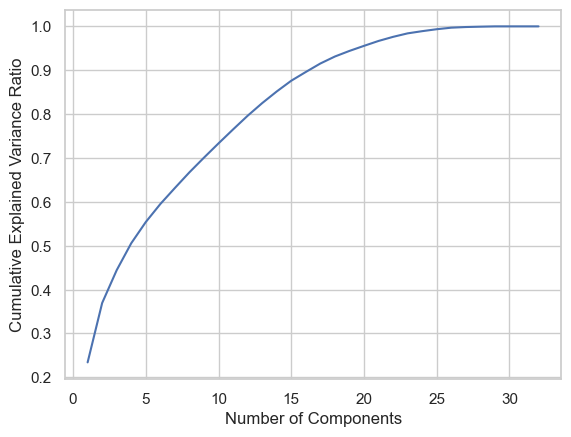

In [194]:

pca = PCA()
pca.fit(scaled_data)

cumulative_variance_ratio = np.cumsum(pca.explained_variance_ratio_)
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.grid(True)
plt.show()

###### Deducing the number of components for PCA using - Elbow Method

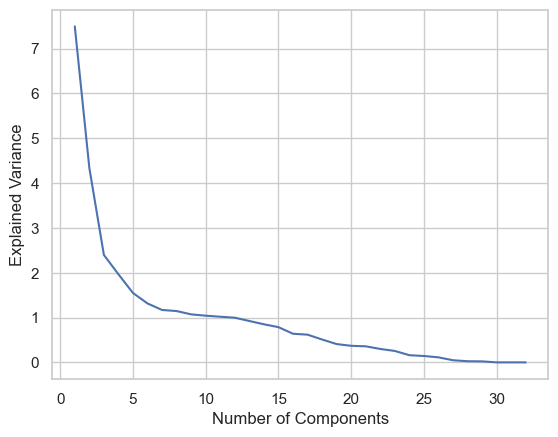

In [195]:
plt.plot(range(1, len(pca.explained_variance_) + 1), pca.explained_variance_)
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance')
plt.grid(True)
plt.show()

##### Applying PCA to reduce and extract required features

In [196]:
# Apply PCA
pca = PCA(0.95)  # Select the number of components to retain
pca_data = pca.fit_transform(scaled_data)

# Access the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Access the principal components (eigenvectors)
eigenvectors = pca.components_

# Access the eigenvalues
eigenvalues = pca.explained_variance_

# Use the transformed data for clustering or further analysis

In [197]:
pca_data.shape

(1584, 20)

In [251]:
# from sklearn.cluster import KMeans
# from sklearn.pipeline import Pipeline
# from sklearn.model_selection import GridSearchCV
# from sklearn.metrics import silhouette_score, make_scorer
# from sklearn.datasets import make_blobs

# # # Generate sample data
# # X, _ = make_blobs(n_samples=100, centers=3, random_state=42)

# # Define the pipeline
# pipeline = Pipeline([
#     ('kmeans', KMeans(random_state=42))
# ])

# # Define the parameter grid
# param_grid = {
#     'kmeans__n_clusters': [2, 3, 4, 5],
#     'kmeans__init': ['k-means++', 'random'],
#     'kmeans__n_init': [10, 20, 30]
# }

# # Define the scoring metric
# scoring = make_scorer(silhouette_score, greater_is_better=True)

# # Perform grid search
# grid_search = GridSearchCV(pipeline, param_grid=param_grid, scoring=scoring)
# grid_search.fit(pca_data)

# # Get the best model and its parameters
# best_model = grid_search.best_estimator_
# best_params = grid_search.best_params_
# best_score = grid_search.best_score_

# print("Best parameters:", best_params)
# print("Best score:", best_score)

Best parameters: {'kmeans__init': 'k-means++', 'kmeans__n_clusters': 2, 'kmeans__n_init': 10}
Best score: nan


In [165]:


# k_means = KMeans(n_clusters=2, n_init=10, random_state=10, init="k-means++")
# k_means.fit(pca_data)

# labels_pred = k_means.predict(pca_data)
# labels_pred

array([1, 0, 0, ..., 1, 0, 0])

In [198]:
inertias = []
for k in range(1, 11):
    km = KMeans(n_clusters=k).fit(pca_data)
    inertias.append(km.inertia_)

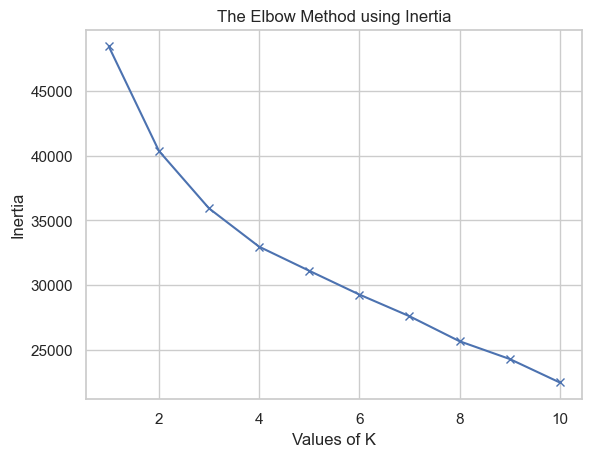

In [199]:
plt.plot(range(1, 11), inertias, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Inertia')
plt.title('The Elbow Method using Inertia')
plt.show()

In [200]:
inertias

[48436.19907030095,
 40365.19054823813,
 35925.01882010781,
 32963.634249503564,
 31103.245174800082,
 29267.44133405938,
 27593.456113412,
 25658.909268127078,
 24288.243846822683,
 22472.67158196029]

In [201]:
import sklearn.cluster as cluster

K = range(2,12)
wss = []
for k in K:
    kmeans=cluster.KMeans(n_clusters=k,init="k-means++")
    kmeans=kmeans.fit(pca_data)
    wss_iter = kmeans.inertia_
    wss.append(wss_iter)

In [202]:
mycenters = pd.DataFrame({'Clusters' : K, 'WSS' : wss})
mycenters

,Clusters,WSS
0,2,40369.00
1,3,35925.08
2,4,32977.06
3,5,31043.35
4,6,29261.23
5,7,27467.36
6,8,25888.99
7,9,23906.28
8,10,22459.71
9,11,21305.98


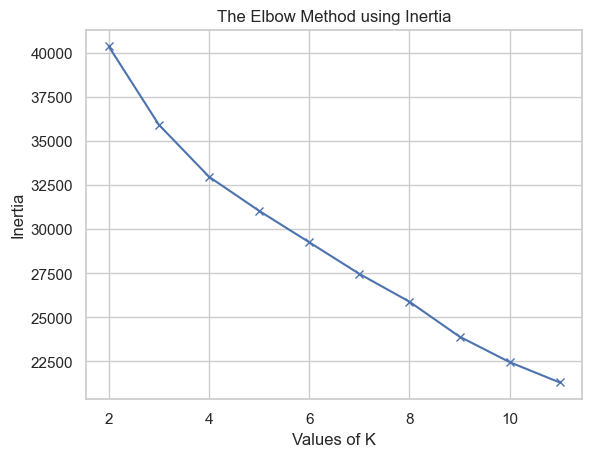

In [203]:
plt.plot(K, wss, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Inertia')
plt.title('The Elbow Method using Inertia')
plt.show()

In [204]:
from sklearn.metrics import silhouette_score
import sklearn.metrics as metrics

SK = range(2,21)
sil_score = []

# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in SK:
    labels=cluster.KMeans(n_clusters=k, init="k-means++", random_state=200).fit(pca_data).labels_
    score = metrics.silhouette_score(pca_data, labels, metric="euclidean", sample_size=1000, random_state=200)
    sil_score.append(score)
    print ("Silhouette score for k(clusters) = "+str(k)+" is "
           +str(metrics.silhouette_score(pca_data,labels, metric="euclidean", sample_size=1000, random_state=200)))

Silhouette score for k(clusters) = 2 is 0.1600517049051505
Silhouette score for k(clusters) = 3 is 0.14738358884867306
Silhouette score for k(clusters) = 4 is 0.1577151315378892
Silhouette score for k(clusters) = 5 is 0.15945191069843803
Silhouette score for k(clusters) = 6 is 0.17092032005633853
Silhouette score for k(clusters) = 7 is 0.18814415251524627
Silhouette score for k(clusters) = 8 is 0.21740152514512276
Silhouette score for k(clusters) = 9 is 0.22158032396552757
Silhouette score for k(clusters) = 10 is 0.23123684268685735
Silhouette score for k(clusters) = 11 is 0.2320951912542948
Silhouette score for k(clusters) = 12 is 0.24719071315937804
Silhouette score for k(clusters) = 13 is 0.2560310199187049
Silhouette score for k(clusters) = 14 is 0.26656077894072244
Silhouette score for k(clusters) = 15 is 0.25350230685667763
Silhouette score for k(clusters) = 16 is 0.25724482998547443
Silhouette score for k(clusters) = 17 is 0.26545752214731716
Silhouette score for k(clusters) = 1

In [205]:
sil_centers = pd.DataFrame({'Clusters' : SK, 'Sil Score' : sil_score})
sil_centers

,Clusters,Sil Score
0,2,0.16
1,3,0.15
2,4,0.16
3,5,0.16
4,6,0.17
...,...,...
14,16,0.26
15,17,0.27
16,18,0.26
17,19,0.25


<AxesSubplot:xlabel='Clusters', ylabel='Sil Score'>

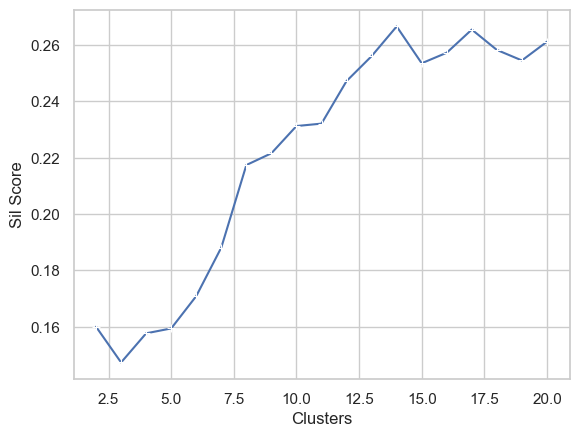

In [206]:
sns.lineplot(x = 'Clusters', y = 'Sil Score', data = sil_centers, marker="+")

Text(0.5, 1.0, 'Customer segmentation by 5 groups')

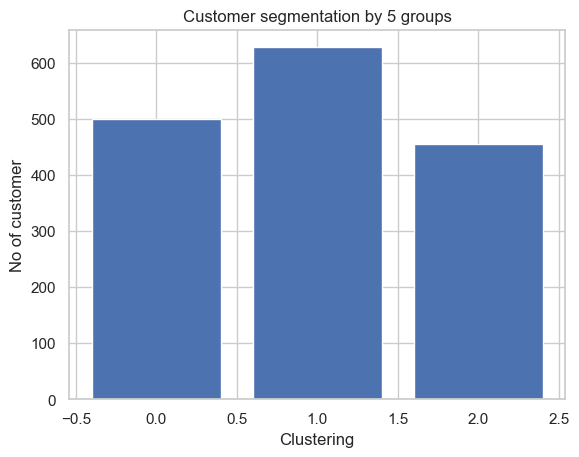

In [207]:
# No of customers in each group respectively
km = KMeans(n_clusters=3).fit(pca_data)
y_km = km.fit_predict(pca_data)
n_cluster, km_count = np.unique(y_km, return_counts=True)

plt.bar(n_cluster, km_count)
plt.ylabel('No of customer')
plt.xlabel('Clustering')
plt.title('Customer segmentation by 3 groups')

# Model comparison

In [ ]:
model_comparison = pd.DataFrame({
    "XGBoost": {'Accuracy': xgb_accuracy, 'AUC': xgb_auc, 'F1 score': xgb_f1},
    "LGBM": {'Accuracy': lgbm_accuracy, 'AUC': lgbm_auc, 'F1 score': lgbm_f1},
    "Random forest": {'Accuracy': rfc_accuracy, 'AUC': rfc_auc, 'F1 score': rfc_f1},
    "Decision trees": {'Accuracy': dct_accuracy, 'AUC': dct_auc, 'F1 score': dct_f1},
    "K-nearest neigbors": {'Accuracy': knn_accuracy, 'AUC': knn_auc, 'F1 score': knn_f1}
})

In [ ]:
fig.plt.gcf()
fig.set_size_inches(15,15)
titles = ['AUC', 'Accuracy', 'F1 score']
for title, label in enumerate(comparison.columns):
    plt.subplot(2,2,title+1)
    sns.barplot(x=comparison.index, y=comparison[label], data=comparison)
    plt.xticks(fontsize=10)
    plt.title(title[title])
plt.show()